In [1]:
using Pkg
using Conda
using WebIO
using Interact
using DifferentialEquations
using DiffEqFlux
using DiffEqSensitivity, OrdinaryDiffEq, Zygote
using Plots
using Lux, Optim, Test
using Optimization, OptimizationPolyalgorithms

using BifurcationKit
using Revise
using SparseArrays, LinearAlgebra, DiffEqOperators, Setfield, Parameters
using GaussianProcesses
using Distributions,Random
using ForwardDiff
using MAT
using CSV
using DataFrames

using DataDrivenDiffEq
using ModelingToolkit
using Surrogates,SurrogatesAbstractGPs
using ReservoirComputing

gr()

WebIO._IJuliaInit()

┌ Warning: OrcV2 initialization failed with
│   err = ErrorException("could not load library \"C:\\Users\\周天恒\\.julia\\artifacts\\12030a5c187a7e327b57d45e3397edf672ab442d\\bin\\libLLVMExtra-12.dll\"\nThe specified procedure could not be found. ")
└ @ Enzyme.Compiler.JIT C:\Users\周天恒\.julia\packages\Enzyme\di3zM\src\compiler\orcv2.jl:103
┌ Info: DataDrivenDiffEq : OccamNet is available.
└ @ DataDrivenDiffEq C:\Users\周天恒\.julia\packages\DataDrivenDiffEq\s9jl3\src\DataDrivenDiffEq.jl:168


Plots.GRBackend()

$$
\ddot{x}+b\dot{x}+\alpha ^2x+\mu x^3+\gamma x^5+\rho x^7=\delta _{st}\omega _{n}^{2}\Phi \cos \left( \omega t \right) 
$$

$$
\left\{ \begin{array}{l}
	\dot{x}=y\\
	\dot{y}=-by-\alpha ^{2}x-\mu x^3-\gamma x^5-\rho x^7+\delta _{st} \omega_{n}^{2}\Phi \cos \left( \omega t \right)\\
\end{array} \right. 
$$

In [2]:
function Duffing(u,p,t)
    b,alpha_2,mu,v,rho,delta_st,wn_2,Phi,w = p
    x,y = u
    du1 = y
    du2 = -b*y - alpha_2*x - mu*x^3 - v*x^5 - rho*x^7 + delta_st * wn_2 *Phi * cos(w*t)
    du = [du1,du2]
end

function Duffing_Approx(u,p,t)
    b,alpha_2,mu,v,rho,delta_st,wn_2,Phi,w = p
    x,y = u
    du1 = y
    #there is no v and rho
    du2 = -b*y - alpha_2*x - mu*x^3 + delta_st * wn_2 *Phi * cos(w*t)
    du = [du1,du2]
end

Duffing_Approx (generic function with 1 method)

In [3]:
initial_1 = [1.0,0.0]
datasize_1 = 20
timespan_1 = (0.0,10.0)
t_1 = range(timespan_1[1],timespan_1[2],length=datasize_1)
#param_1 = [0.3159,1.0,1.499,-0.3921,0.0422,1.0,1.0,1.0,round(2*pi*19.95,digits = 3)]
param_1 = [0.3159,1.0,1.499,-1.0,0.0422,1.0,1.0,1.0,round(2*pi*19.95,digits = 3)]
prob_Duffing = ODEProblem(Duffing,initial_1,timespan_1,param_1)
sol_Duffing = solve(prob_Duffing,Tsit5(),saveat=t_1)

prob_Duffing_A = ODEProblem(Duffing_Approx,initial_1,timespan_1,param_1)
sol_Duffing_A = solve(prob_Duffing_A,Tsit5(),saveat=t_1)

retcode: Success
Interpolation: 1st order linear
t: 20-element Vector{Float64}:
  0.0
  0.5263157894736842
  1.0526315789473684
  1.5789473684210527
  2.1052631578947367
  2.6315789473684212
  3.1578947368421053
  3.6842105263157894
  4.2105263157894735
  4.7368421052631575
  5.2631578947368425
  5.7894736842105265
  6.315789473684211
  6.842105263157895
  7.368421052631579
  7.894736842105263
  8.421052631578947
  8.947368421052632
  9.473684210526315
 10.0
u: 20-element Vector{Vector{Float64}}:
 [1.0, 0.0]
 [0.7075137832645869, -0.9660025505790213]
 [0.1377353305695019, -1.1012410892929378]
 [-0.3877505568486175, -0.8538257700480537]
 [-0.7025199934024, -0.2880252643720388]
 [-0.6735678126384862, 0.37140196230056044]
 [-0.37598613936169717, 0.6888894604731564]
 [-0.004706982326779668, 0.6828069763559168]
 [0.31100631400081175, 0.4942340850421393]
 [0.4875641883347875, 0.15828979344087216]
 [0.47445883384159876, -0.19556174908587498]
 [0.3079624383954879, -0.40657929628418565]
 [0.077

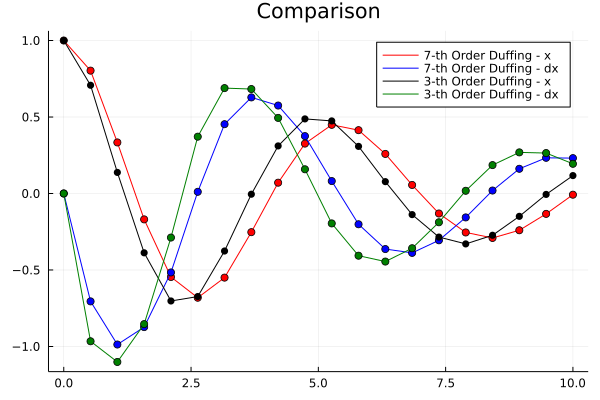

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


In [4]:
plot(t_1,Array(sol_Duffing[1,:]),color = "red",label = "7-th Order Duffing - x")
scatter!(t_1,Array(sol_Duffing[1,:]),color = "red",label = "")
plot!(t_1,Array(sol_Duffing[2,:]),color = "blue",label = "7-th Order Duffing - dx")
scatter!(t_1,Array(sol_Duffing[2,:]),color = "blue",label = "",title = "Comparison")


plot!(t_1,Array(sol_Duffing_A[1,:]),color = "black",label = "3-th Order Duffing - x")
scatter!(t_1,Array(sol_Duffing_A[1,:]),color = "black",label = "")
plot!(t_1,Array(sol_Duffing_A[2,:]),color = "green",label = "3-th Order Duffing - dx")
scatter!(t_1,Array(sol_Duffing_A[2,:]),color = "green",label = "",title = "Comparison")

In [179]:
t_5 = range(timespan_1[1],timespan_1[2],length=5)
t_10 = range(timespan_1[1],timespan_1[2],length=10)
t_15 = range(timespan_1[1],timespan_1[2],length=15)
t_30 = range(timespan_1[1],timespan_1[2],length=30)
t_45 = range(timespan_1[1],timespan_1[2],length=45)
t_true = range(timespan_1[1],timespan_1[2],length=1000)


prob_Duffing = ODEProblem(Duffing,initial_1,timespan_1,param_1)
sol_Duffing_5 = solve(prob_Duffing,Tsit5(),saveat=t_5)
sol_Duffing_10 = solve(prob_Duffing,Tsit5(),saveat=t_10)
sol_Duffing_15 = solve(prob_Duffing,Tsit5(),saveat=t_15)
sol_Duffing_30 = solve(prob_Duffing,Tsit5(),saveat=t_30)
sol_Duffing_45 = solve(prob_Duffing,Tsit5(),saveat=t_45)
sol_Duffing_true = solve(prob_Duffing,Tsit5(),saveat=t_true)

retcode: Success
Interpolation: 1st order linear
t: 1000-element Vector{Float64}:
  0.0
  0.01001001001001001
  0.02002002002002002
  0.03003003003003003
  0.04004004004004004
  0.05005005005005005
  0.06006006006006006
  0.07007007007007007
  0.08008008008008008
  0.09009009009009009
  0.1001001001001001
  0.11011011011011011
  0.12012012012012012
  ⋮
  9.88988988988989
  9.8998998998999
  9.90990990990991
  9.91991991991992
  9.92992992992993
  9.93993993993994
  9.94994994994995
  9.95995995995996
  9.96996996996997
  9.97997997997998
  9.98998998998999
 10.0
u: 1000-element Vector{Vector{Float64}}:
 [1.0, 0.0]
 [0.9999666812276671, -0.007834259127456347]
 [0.999806470165361, -0.02607988217490005]
 [0.9994219329934416, -0.05074845989733095]
 [0.9988133577540165, -0.06893068161676837]
 [0.9980790795274327, -0.0765729518956515]
 [0.9972806130193719, -0.0841055610833353]
 [0.9963585975976624, -0.10199326234396502]
 [0.9952154574152987, -0.12641980747091505]
 [0.9938507110171751, -0.144

In [ ]:
dudt = Flux.Chain(
             Flux.Dense(2,32,tanh),
             Flux.Dense(32,2))
n_ode = NeuralODE(dudt,timespan_1,Tsit5(),saveat=t_15,reltol=1e-7,abstol=1e-9)
ps = Flux.params(n_ode)

u0 = initial_1
pred = n_ode(u0) # Get the prediction using the correct initial condition

function predict_n_ode()
  n_ode(u0)
end

loss_n_ode() = 1/15 * sum(abs2,reshape(Array(sol_Duffing_15) .- predict_n_ode(),:))

data = Iterators.repeated((), 1000)
opt = ADAM(0.1)
iter = 0
cb = function () #callback function to observe training
  global iter
  iter += 1
  display(loss_n_ode())
  # plot current prediction against data
  cur_pred = predict_n_ode()
  pl = scatter(t_15,Array(sol_Duffing_15)[1,:],label="x_data",color = "red")
  scatter!(pl,t_15,cur_pred[1,:],label="x_prediction",color = "blue")
  display(plot(pl))
end

# Display the ODE with the initial parameter values.
cb()

Flux.train!(loss_n_ode, ps, data, opt, cb = cb)

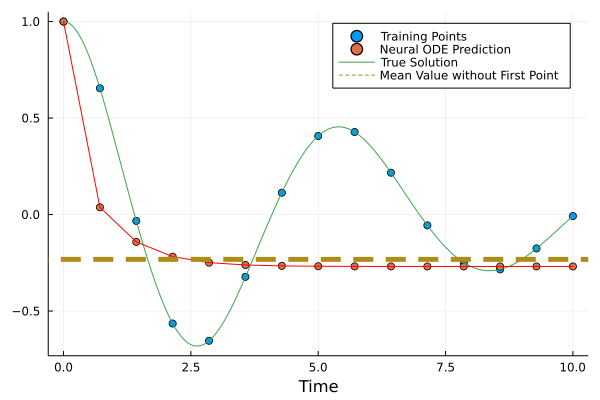

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


In [51]:
p_1 = plot()
scatter!(p_1,t_15,sol_Duffing_15[1,:],label = "Training Points")
scatter!(p_1,t_15,predict_n_ode()[1,:],label = "Neural ODE Prediction")
plot!(p_1,t_true,Array(sol_Duffing_true)[1,:],label = "True Solution")
plot!(p_1,t_15,predict_n_ode()[1,:],label = "",color = "red")
hline!(p_1,[mean(predict_n_ode()[1,2:size(predict_n_ode())[2]])],linestyle = :dash, width = 5,label = "Mean Value without First Point")
xlabel!(p_1,"Time")
p_11 = p_1

In [ ]:
dudt = Flux.Chain(
             Flux.Dense(2,32,tanh),
             Flux.Dense(32,2))
n_ode = NeuralODE(dudt,timespan_1,Tsit5(),saveat=t_30,reltol=1e-7,abstol=1e-9)
ps = Flux.params(n_ode)

u0 = initial_1
pred = n_ode(u0) # Get the prediction using the correct initial condition

function predict_n_ode()
  n_ode(u0)
end

loss_n_ode() = 1/30 * sum(abs2,reshape(Array(sol_Duffing_30) .- predict_n_ode(),:))

data = Iterators.repeated((), 200)
opt = ADAM(0.1)
iter = 0
cb = function () #callback function to observe training
  global iter
  iter += 1
  display(loss_n_ode())
  # plot current prediction against data
  cur_pred = predict_n_ode()
  pl = scatter(t_30,Array(sol_Duffing_30)[1,:],label="x_data",color = "red")
  scatter!(pl,t_30,cur_pred[1,:],label="x_prediction",color = "blue")
  display(plot(pl))
end

# Display the ODE with the initial parameter values.
cb()

Flux.train!(loss_n_ode, ps, data, opt, cb = cb)

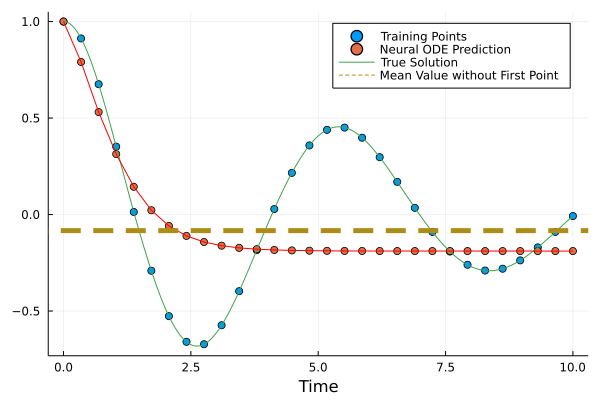

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


In [56]:
p_2 = plot()
scatter!(p_2,t_30,sol_Duffing_30[1,:],label = "Training Points")
scatter!(p_2,t_30,predict_n_ode()[1,:],label = "Neural ODE Prediction")
plot!(p_2,t_true,Array(sol_Duffing_true)[1,:],label = "True Solution")
plot!(p_2,t_30,predict_n_ode()[1,:],label = "",color = "red")
hline!(p_2,[mean(predict_n_ode()[1,2:size(predict_n_ode())[2]])],linestyle = :dash, width = 5,label = "Mean Value without First Point")
xlabel!(p_2,"Time")
p_22 = p_2

In [ ]:
dudt = Flux.Chain(
             Flux.Dense(2,32,tanh),
             Flux.Dense(32,2))
n_ode = NeuralODE(dudt,timespan_1,Tsit5(),saveat=t_45,reltol=1e-7,abstol=1e-9)
ps = Flux.params(n_ode)

u0 = initial_1
pred = n_ode(u0) # Get the prediction using the correct initial condition

function predict_n_ode()
  n_ode(u0)
end

loss_n_ode() = 1/45 * sum(abs2,reshape(Array(sol_Duffing_45) .- predict_n_ode(),:))

data = Iterators.repeated((), 500)
opt = ADAM(0.1)
iter = 0
cb = function () #callback function to observe training
  global iter
  iter += 1
  display(loss_n_ode())
  # plot current prediction against data
  cur_pred = predict_n_ode()
  pl = scatter(t_45,Array(sol_Duffing_45)[1,:],label="x_data",color = "red")
  scatter!(pl,t_45,cur_pred[1,:],label="x_prediction",color = "blue")
  display(plot(pl))
end

# Display the ODE with the initial parameter values.
cb()

Flux.train!(loss_n_ode, ps, data, opt, cb = cb)

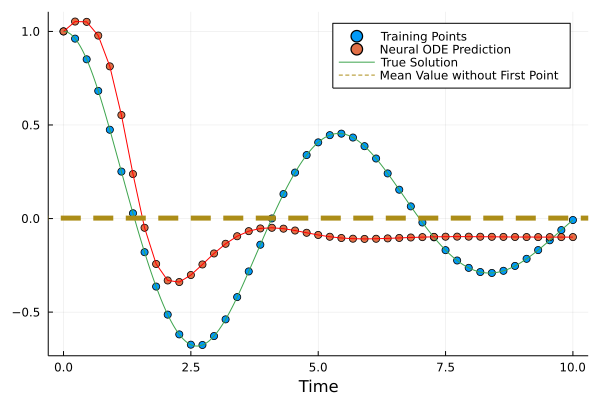

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


In [60]:
p_3 = plot()
scatter!(p_3,t_45,sol_Duffing_45[1,:],label = "Training Points")
scatter!(p_3,t_45,predict_n_ode()[1,:],label = "Neural ODE Prediction")
plot!(p_3,t_true,Array(sol_Duffing_true)[1,:],label = "True Solution")
plot!(p_3,t_45,predict_n_ode()[1,:],label = "",color = "red")
hline!(p_3,[mean(predict_n_ode()[1,2:size(predict_n_ode())[2]])],linestyle = :dash, width = 5,label = "Mean Value without First Point")
xlabel!(p_3,"Time")
p_33 = p_3

In [80]:
using Lux
using Random
rng = Random.default_rng()
using DiffEqFlux: group_ranges

nn = Lux.Chain(
                  Lux.Dense(2, 32, tanh),
                  Lux.Dense(32, 2))
p_init, st = Lux.setup(rng, nn)
tsteps = t_15
neuralode = NeuralODE(nn, timespan_1, Tsit5(), saveat = t_15)
prob_node = ODEProblem((u,p,t)->nn(u,p,st)[1], initial_1, timespan_1, Lux.ComponentArray(p_init))

function plot_multiple_shoot(plt, preds, group_size)
    step = group_size-1
    ranges = group_ranges(15, group_size)

    for (i, rg) in enumerate(ranges)
        plot!(plt, t_15[rg], preds[i][1,:], markershape=:rect,label = "",width = 3)
    end
end




anim = Plots.Animation()
iter = 0
callback = function (p, l, preds; doplot = true)
  display(l)
  global iter
  iter += 1
  if doplot && iter%1 == 0
    # plot the original data
    plt = plot(t_true,Array(sol_Duffing_true)[1,:],label = "True Solution")
    global plt
    scatter!(plt,t_15, sol_Duffing_15[1,:], label = "Training Points")

    # plot the different predictions for individual shoot
    plot_multiple_shoot(plt, preds, group_size)

    frame(anim)
    display(plot(plt))
  end
  return false
end



#84 (generic function with 1 method)

In [ ]:
group_size = 3
continuity_term = 200

function loss_function(data, pred)
    return sum(abs2, data - pred)
end

function loss_multiple_shooting(p)
    return multiple_shoot(p, sol_Duffing_15, t_15, prob_node, loss_function, Tsit5(),
                          group_size; continuity_term)
end

adtype = Optimization.AutoZygote()
optf = Optimization.OptimizationFunction((x,p) -> loss_multiple_shooting(x), adtype)
optprob = Optimization.OptimizationProblem(optf, Lux.ComponentArray(p_init))
res_ms = Optimization.solve(optprob, PolyOpt(),
                                callback = callback,maxiters = 100)

In [ ]:
using Lux
using Random
rng = Random.default_rng()
using DiffEqFlux: group_ranges

nn = Lux.Chain(
                  Lux.Dense(2, 32, tanh),
                  Lux.Dense(32, 2))
p_init, st = Lux.setup(rng, nn)
tsteps = t_30
neuralode = NeuralODE(nn, timespan_1, Tsit5(), saveat = t_30)
prob_node = ODEProblem((u,p,t)->nn(u,p,st)[1], initial_1, timespan_1, Lux.ComponentArray(p_init))

function plot_multiple_shoot(plt, preds, group_size)
    step = group_size-1
    ranges = group_ranges(30, group_size)

    for (i, rg) in enumerate(ranges)
        plot!(plt2, t_30[rg], preds[i][1,:], markershape=:rect,label = "",width = 3)
    end
end




anim = Plots.Animation()
iter = 0
callback = function (p, l, preds; doplot = true)
  display(l)
  global iter
  iter += 1
  if doplot && iter%1 == 0
    # plot the original data
    plt2 = plot(t_true,Array(sol_Duffing_true)[1,:],label = "True Solution")
    global plt2
    scatter!(plt2,t_30, sol_Duffing_30[1,:], label = "Training Points")
    xlabel!(plt2,"Time")

    # plot the different predictions for individual shoot
    plot_multiple_shoot(plt2, preds, group_size)

    frame(anim)
    display(plot(plt2))
  end
  return false
end

group_size = 3
continuity_term = 200

function loss_function(data, pred)
    return sum(abs2, data - pred)
end

function loss_multiple_shooting(p)
    return multiple_shoot(p, sol_Duffing_30, t_30, prob_node, loss_function, Tsit5(),
                          group_size; continuity_term)
end

adtype = Optimization.AutoZygote()
optf = Optimization.OptimizationFunction((x,p) -> loss_multiple_shooting(x), adtype)
optprob = Optimization.OptimizationProblem(optf, Lux.ComponentArray(p_init))
res_ms = Optimization.solve(optprob, PolyOpt(),
                                callback = callback,maxiters = 100)


1560.9087547734728

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


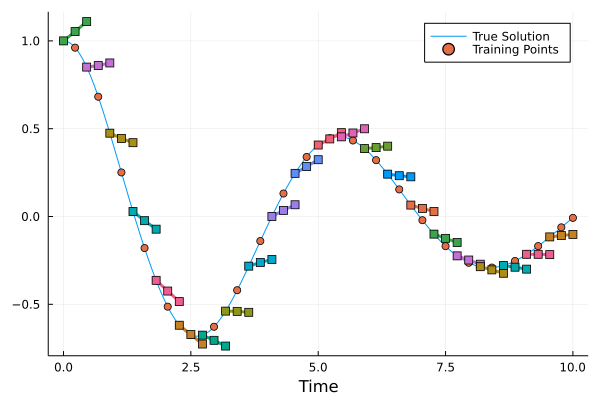

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


1358.1276507026741

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


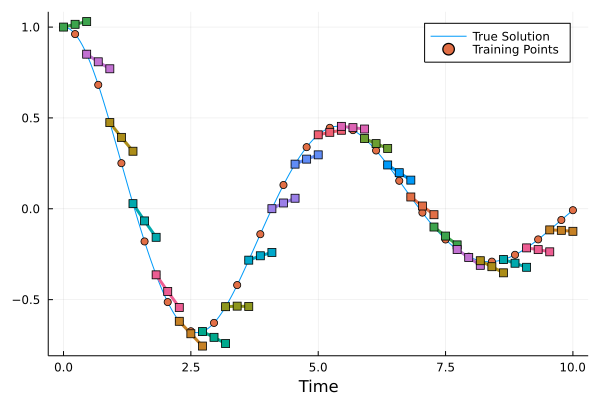

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


1166.507047471301

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


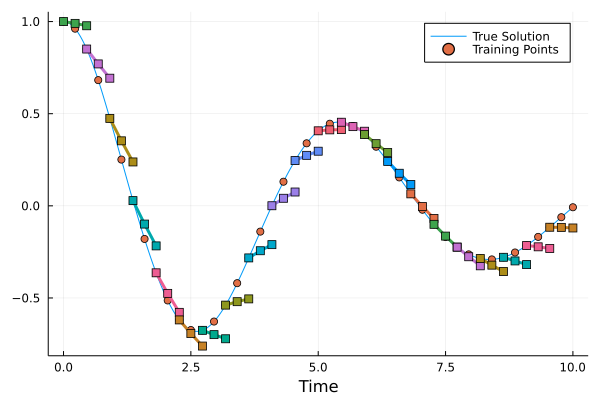

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


979.6771469707461

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


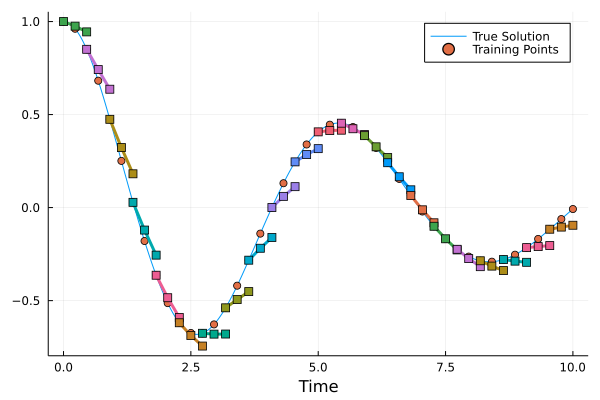

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


792.3742883695069

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


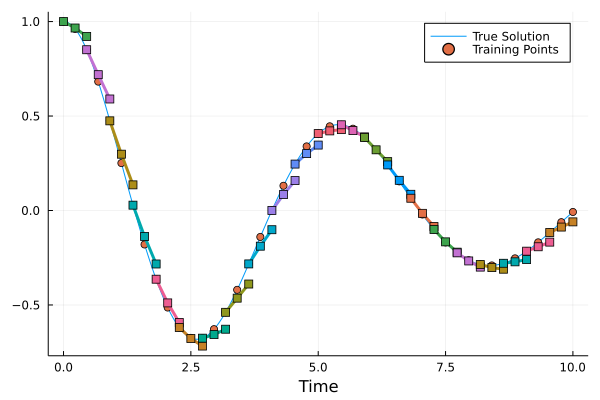

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


612.3438966908644

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


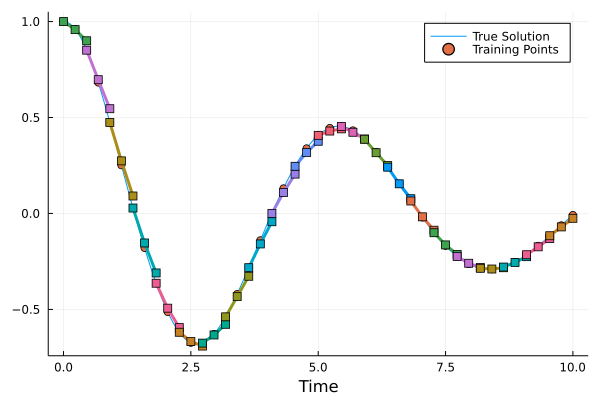

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


473.31039719591575

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


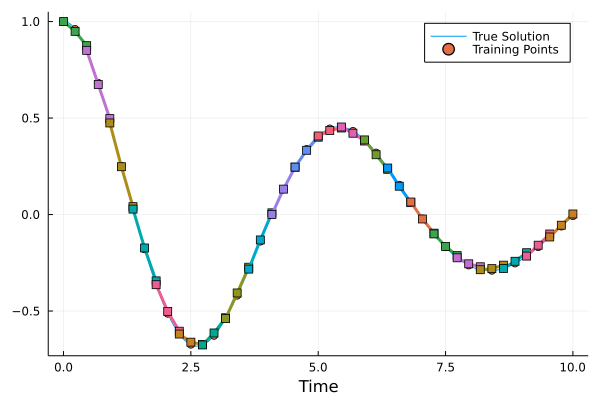

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


450.9089876174519

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


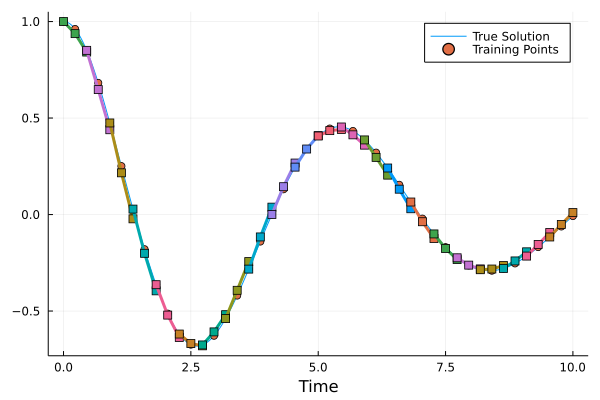

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


438.89737186677354

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


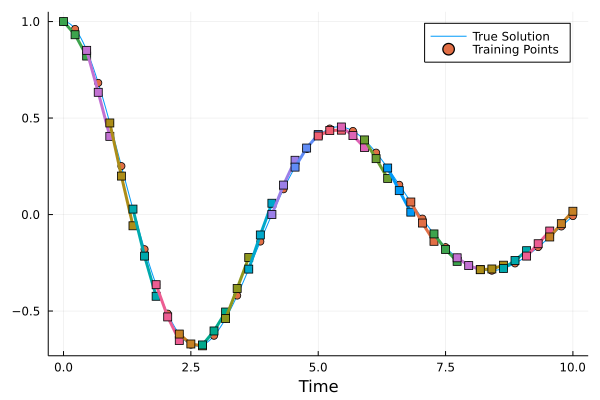

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


399.92242035459606

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


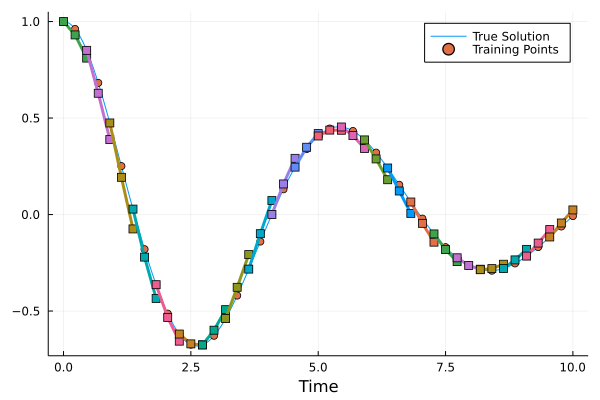

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


349.0659914437196

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


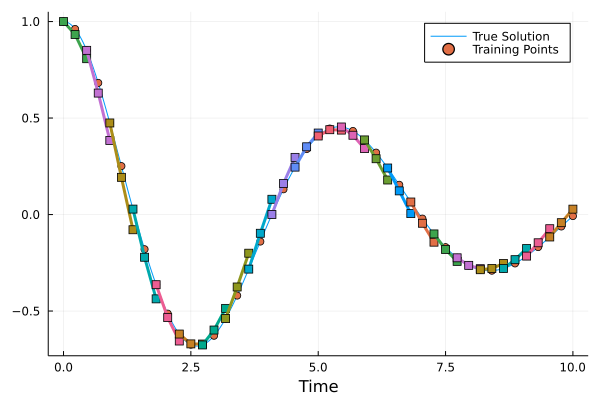

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


303.6858431526551

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


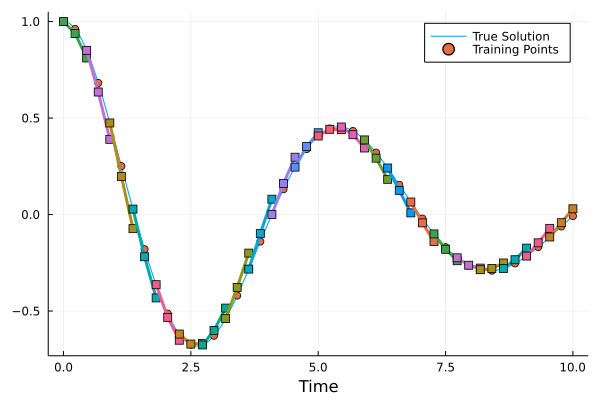

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


276.43910409758496

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


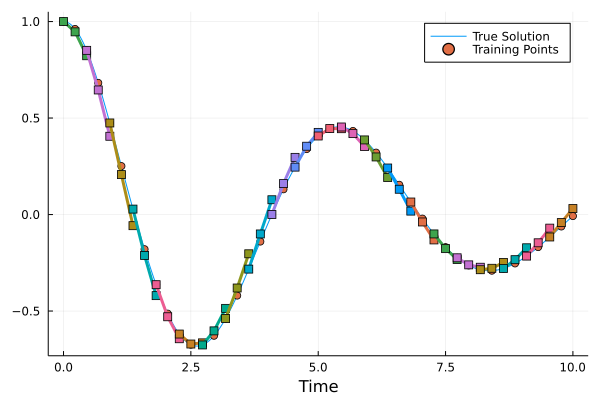

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


248.1076405934773

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


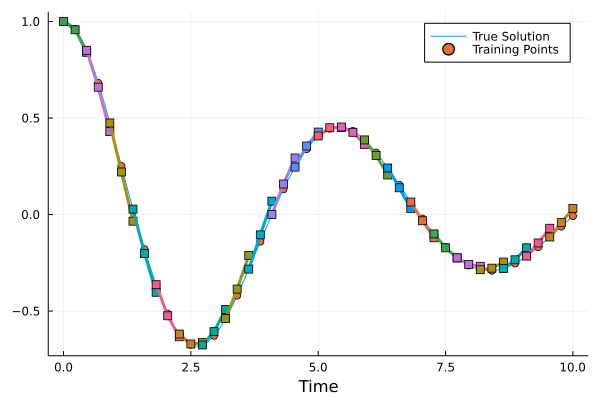

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


231.5575756534995

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


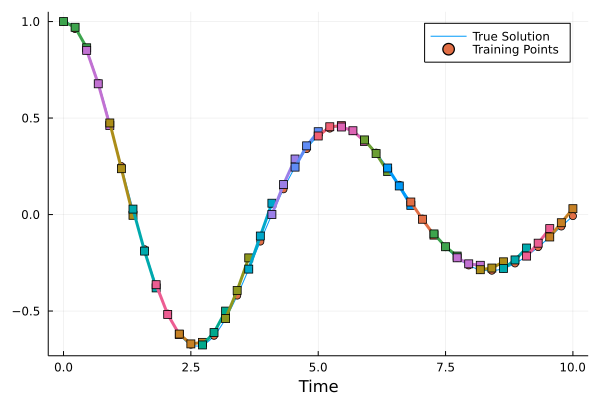

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


230.97932433902292

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


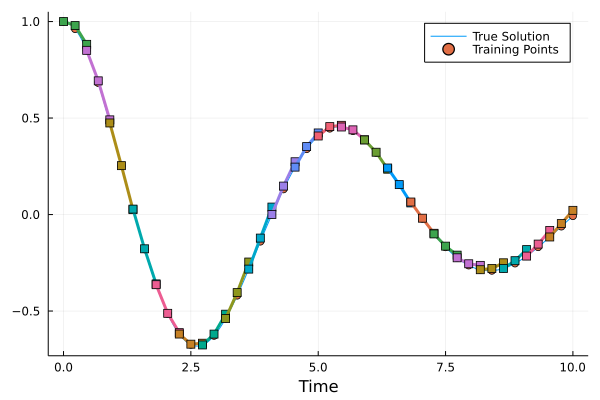

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


217.20002473457797

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


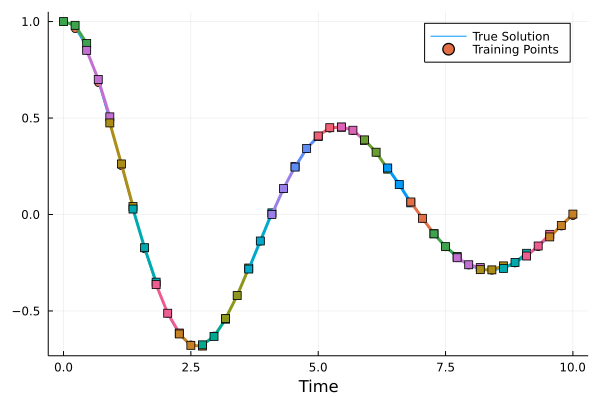

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


249.54364233427597

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


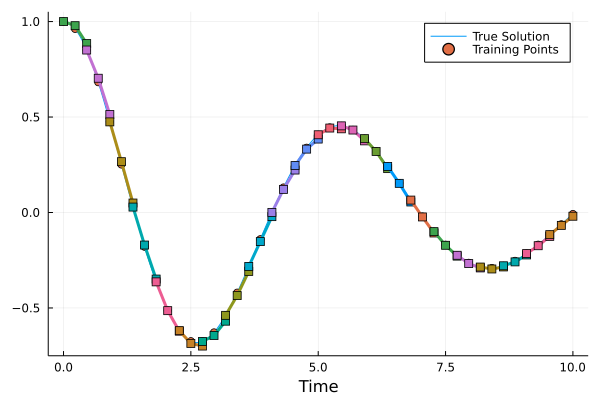

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


260.01499783740144

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


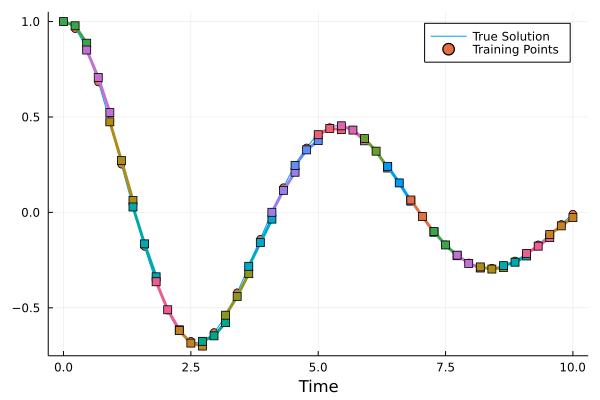

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


243.17504782639173

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


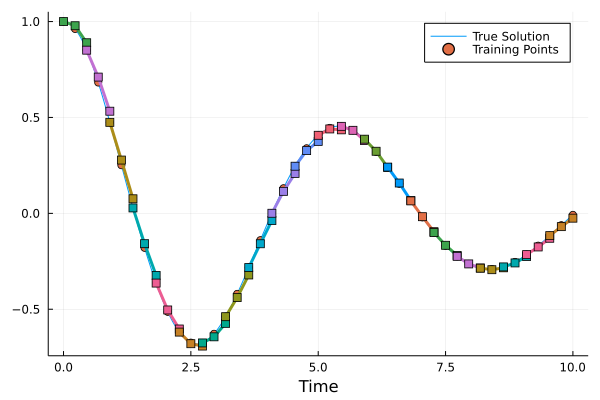

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


231.98224418817097

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


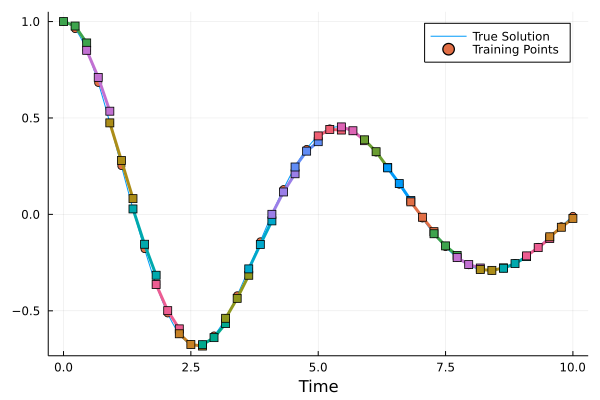

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


223.02855093874118

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


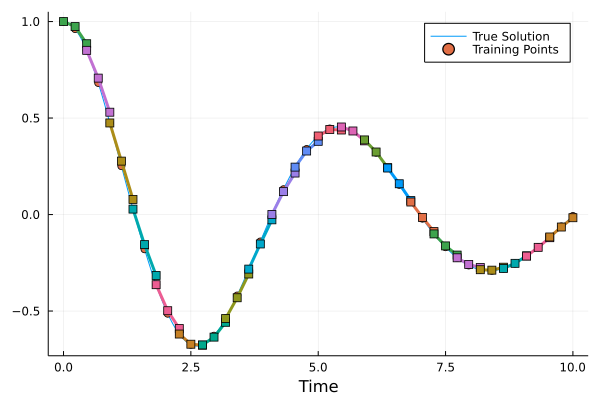

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


207.22391173569363

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


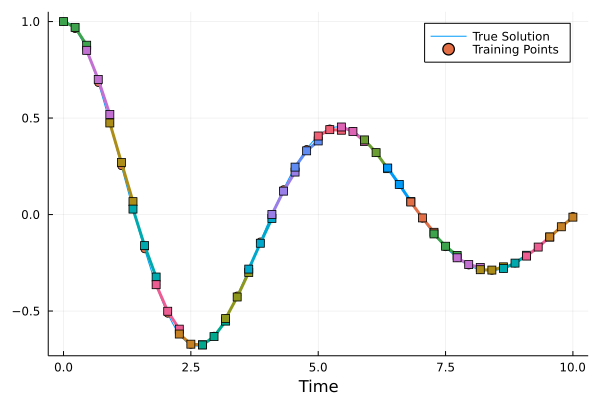

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


189.49996690637883

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


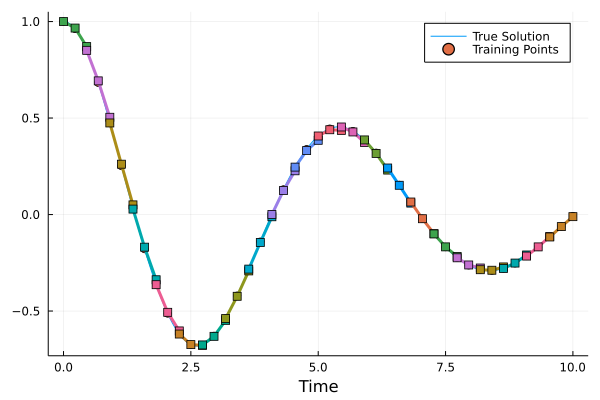

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


167.63214031030518

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


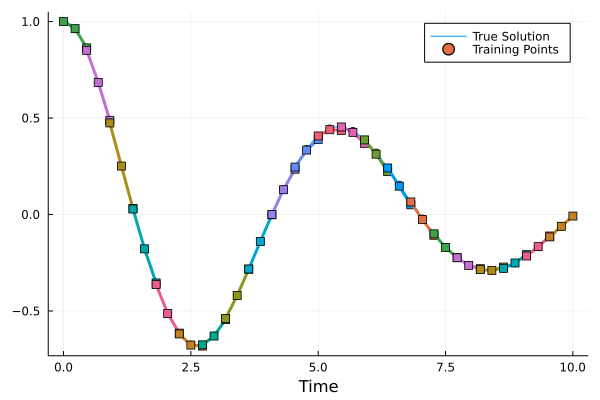

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


166.4429619447392

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


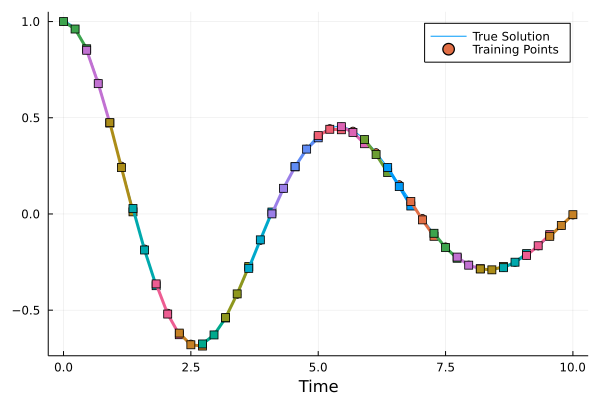

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


166.03124607382844

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


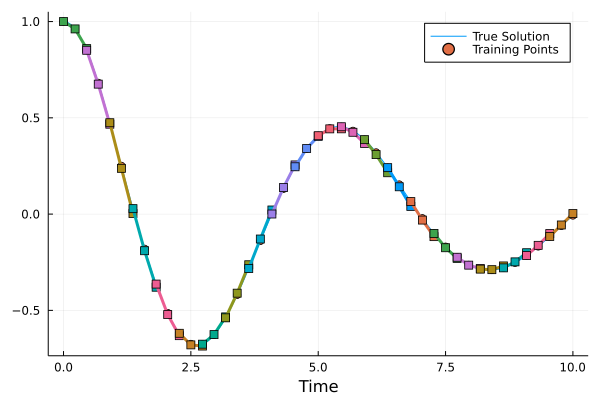

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


162.90681836215566

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


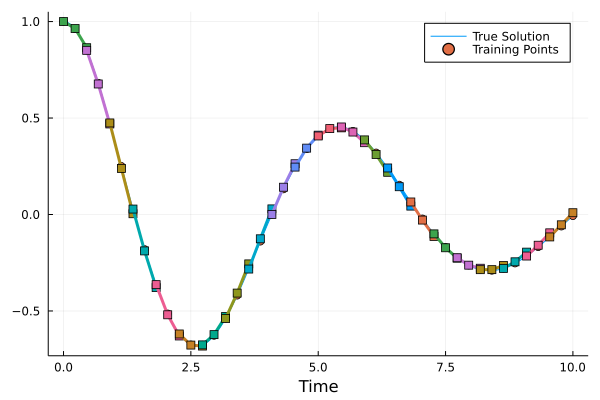

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


161.6204191060451

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


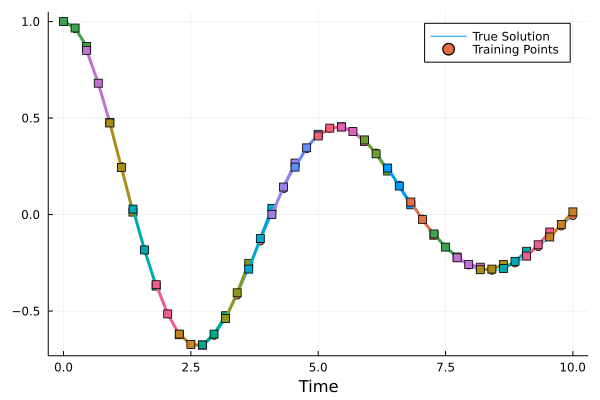

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


166.27045220005624

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


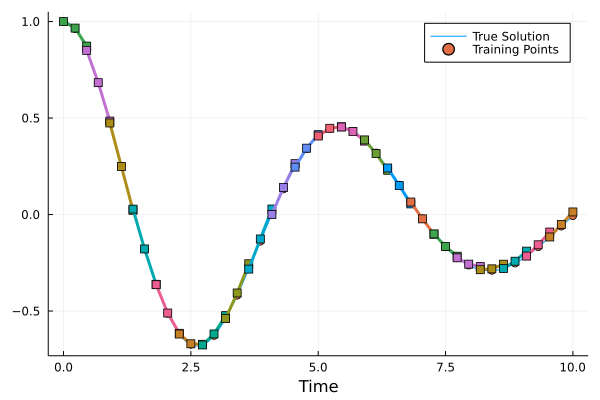

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


162.56227170230963

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


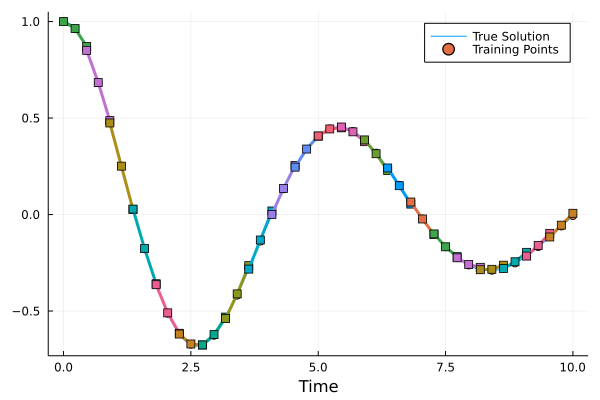

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


155.2091291660409

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


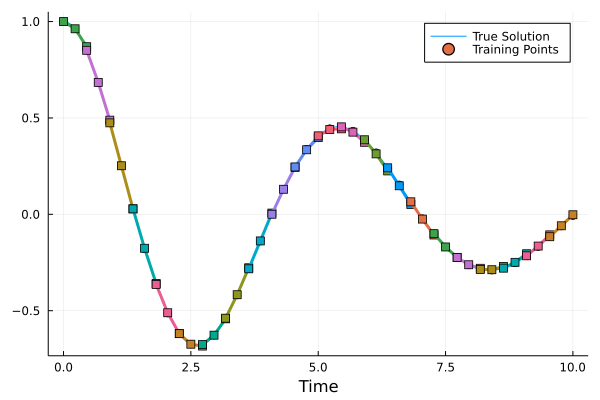

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


155.09483980097409

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


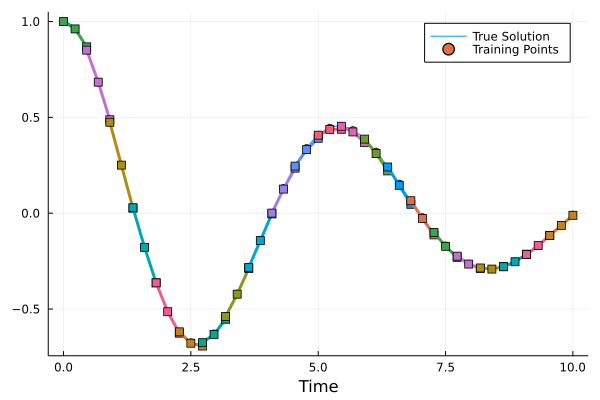

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


151.3886016886893

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


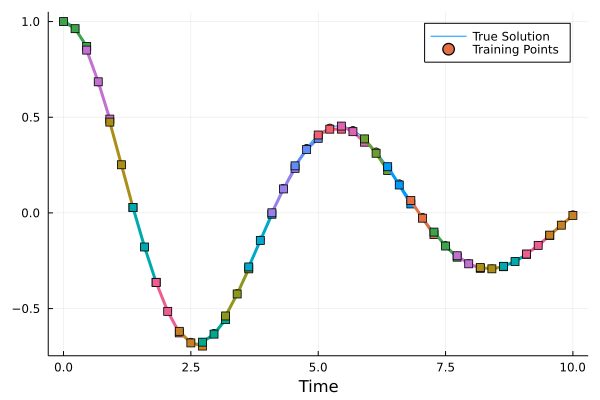

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


140.7857972789247

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


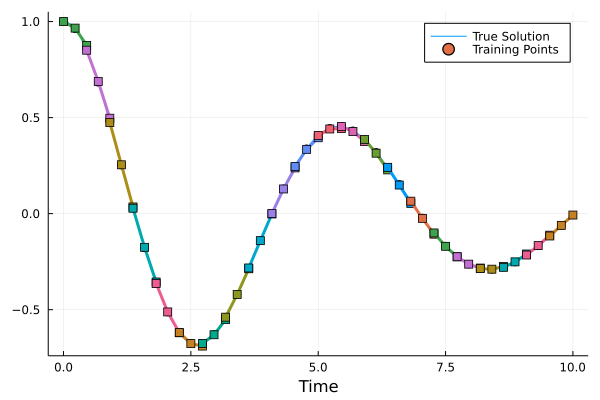

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


145.30653950837478

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


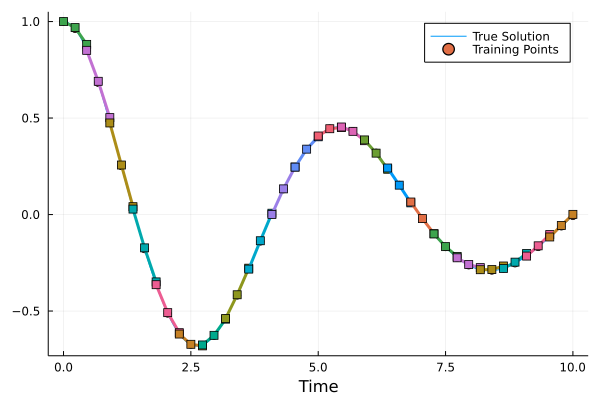

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


153.07855002629492

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


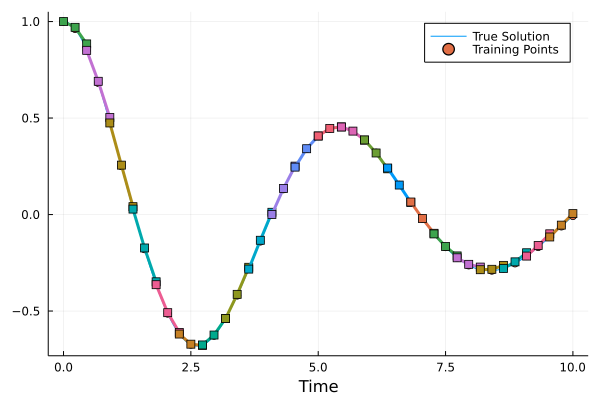

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


150.86427417596224

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


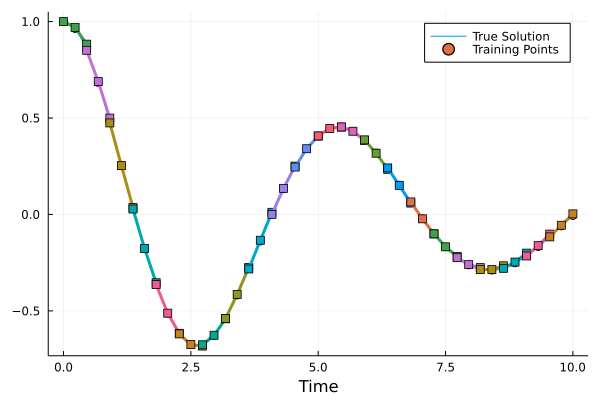

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


147.01720500054643

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


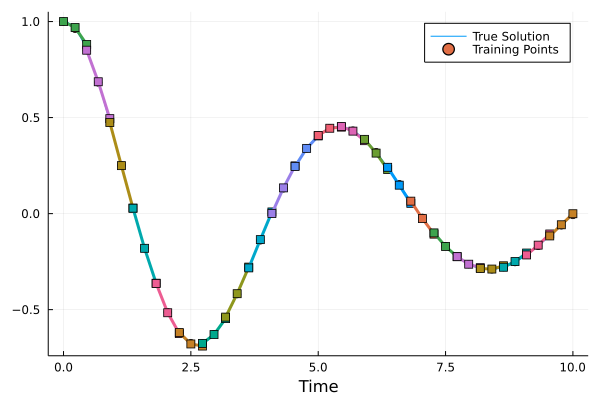

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


141.59835510485078

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


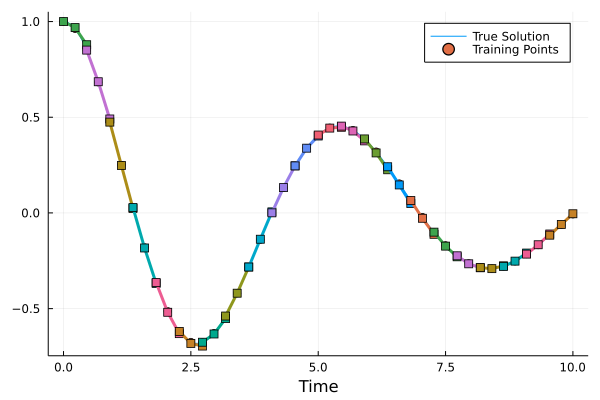

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


137.18776561779177

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


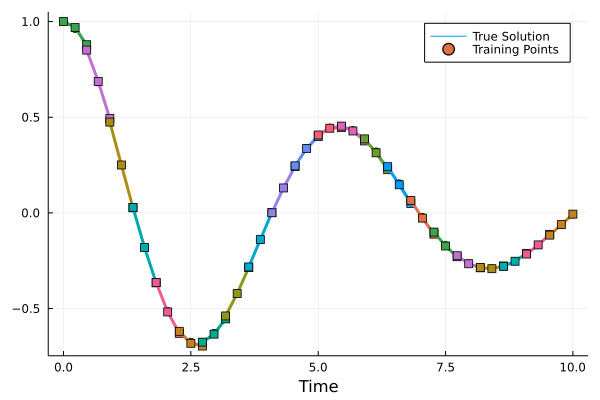

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


135.35310630407753

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


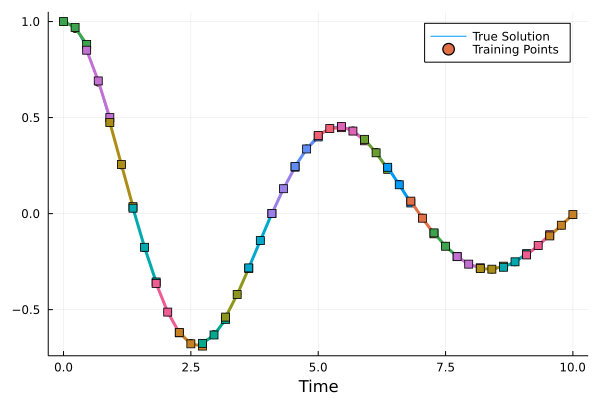

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


141.18437077869223

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


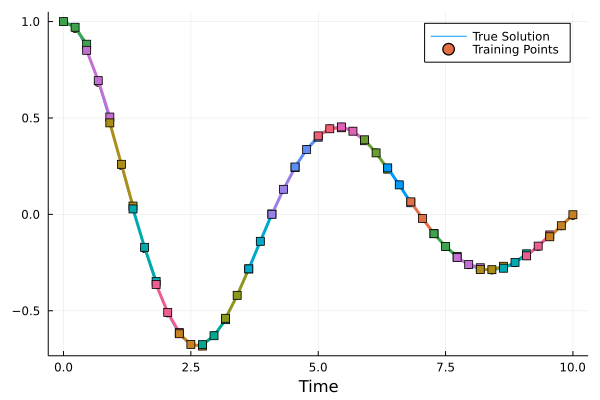

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


147.7304309170836

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


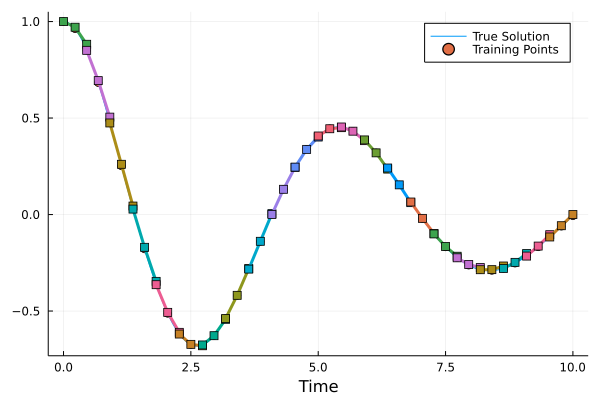

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


144.8373231971452

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


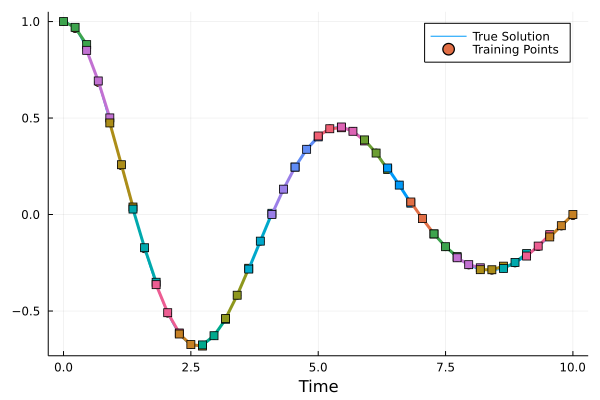

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


137.58399067013136

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


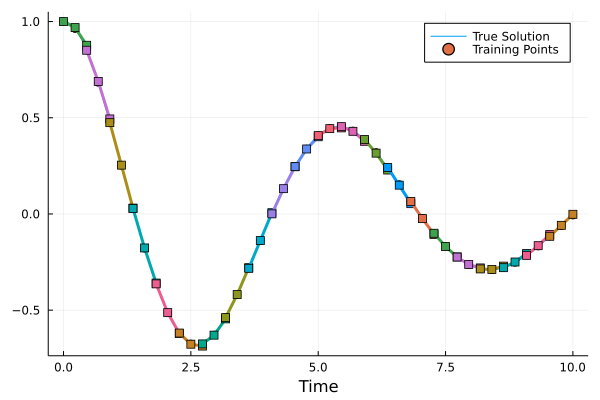

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


141.5787830542471

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


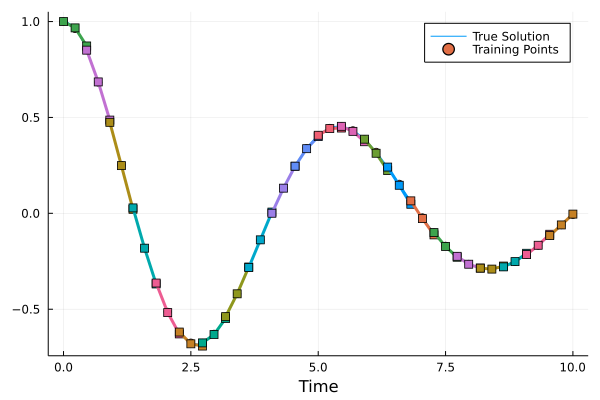

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


144.06183610061458

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


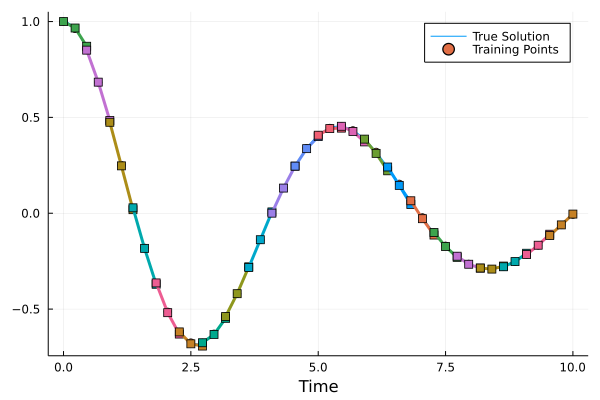

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


139.92662090494326

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


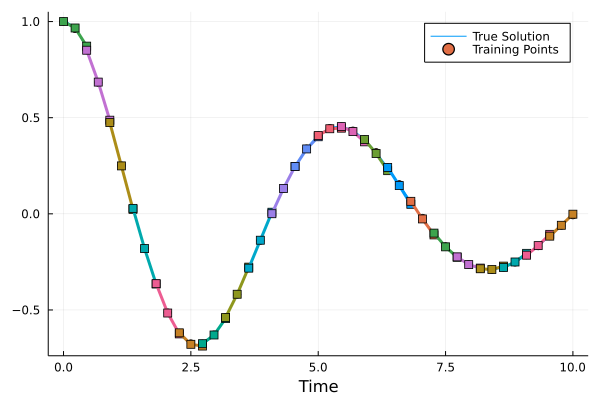

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


139.3294597718982

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


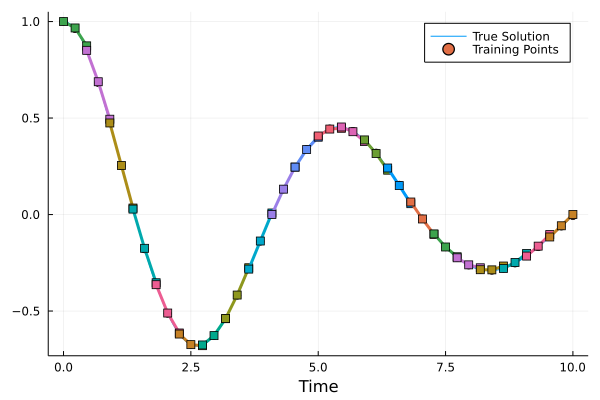

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


143.6007117555252

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


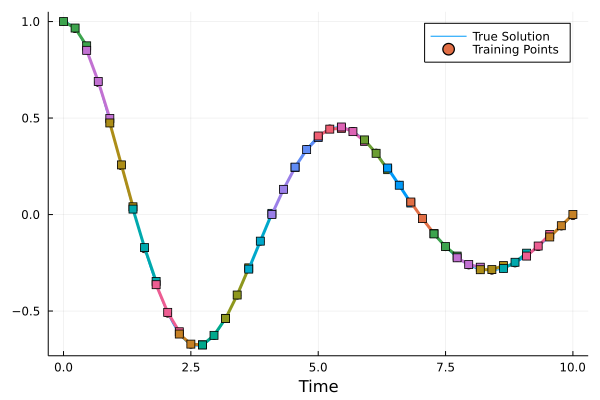

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


139.92517281440607

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


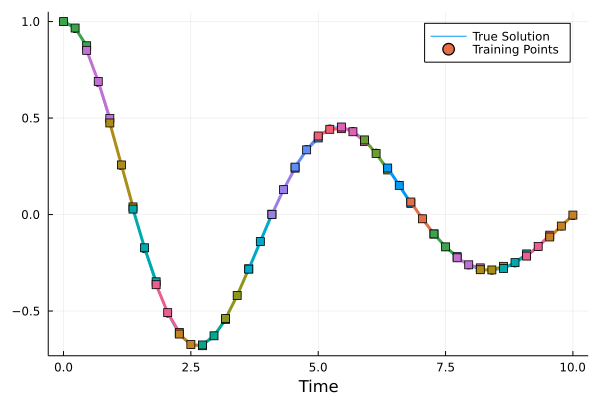

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


137.9288184400895

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


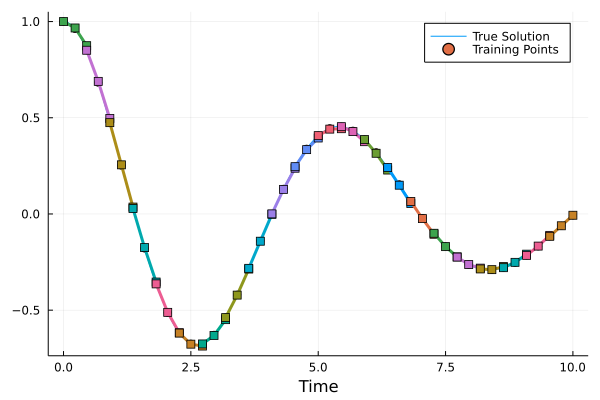

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


137.27526117517525

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


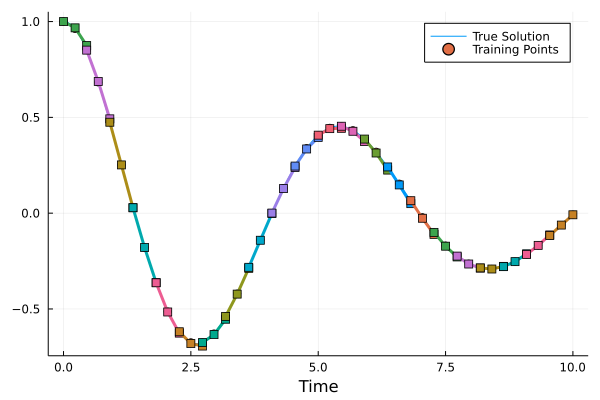

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


137.8324124624119

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


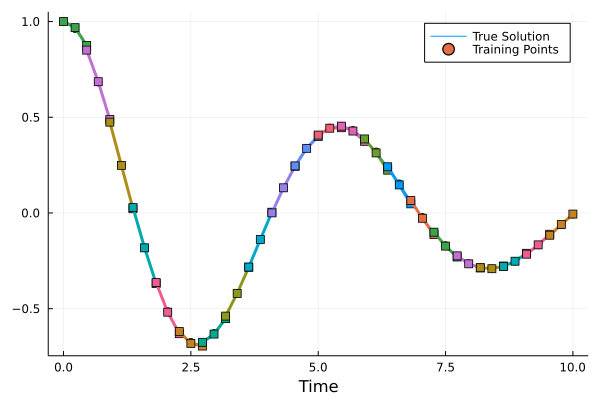

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


139.56706954694835

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


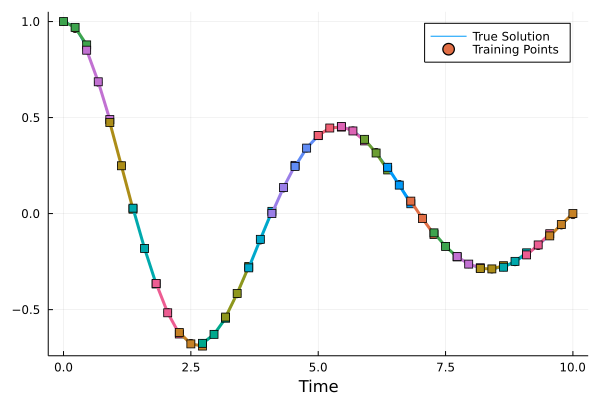

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


140.83174012742535

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


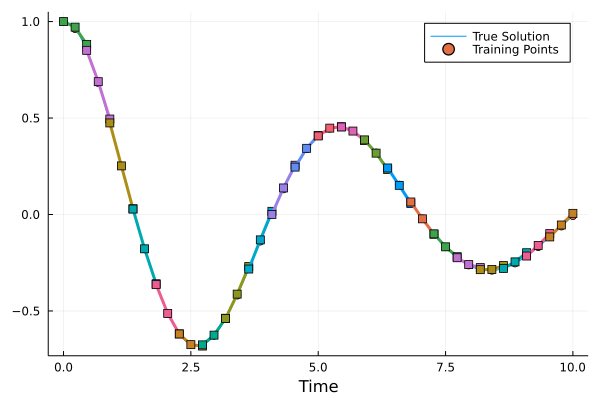

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


136.26843826254728

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


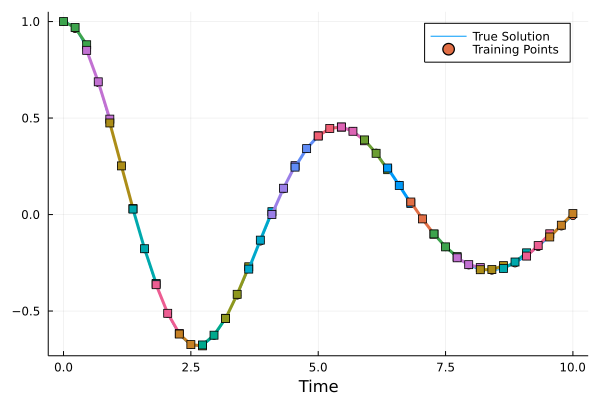

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


131.46938429240663

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


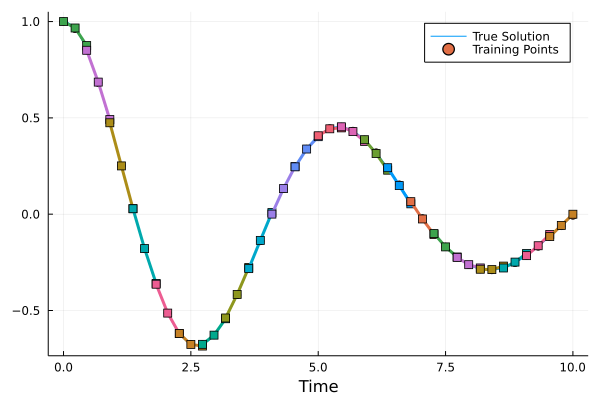

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


136.8450043532399

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


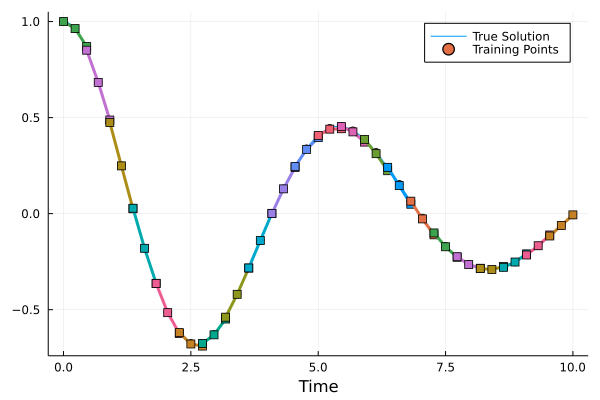

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


136.93158875213132

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


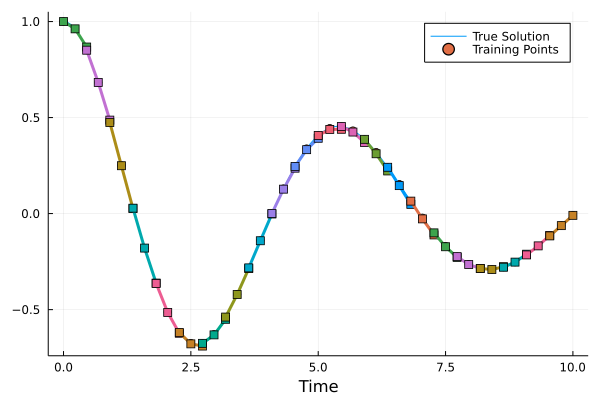

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


132.20407712291555

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


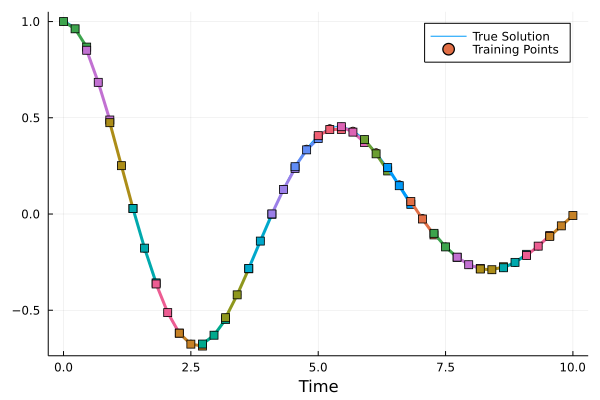

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


133.84966018218665

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


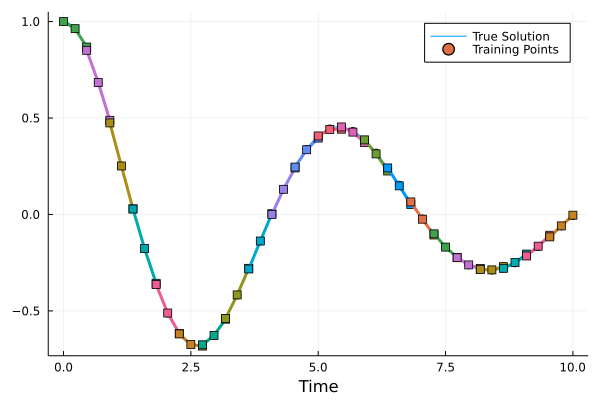

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


134.74375846415273

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


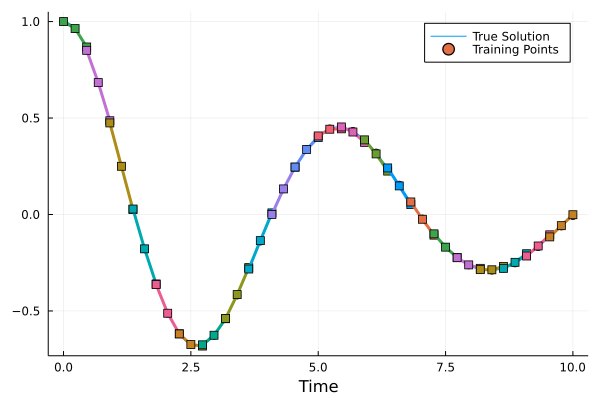

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


134.83636925354713

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


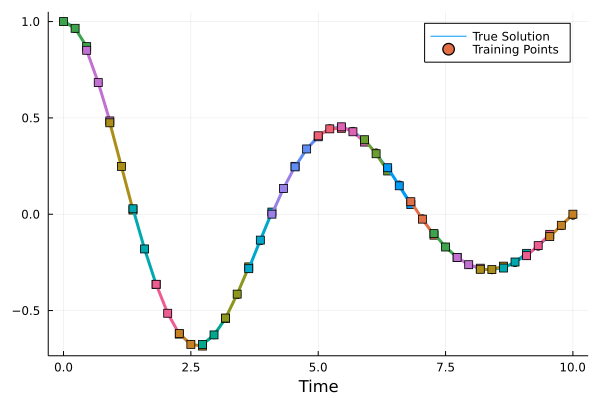

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


134.45072687287583

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


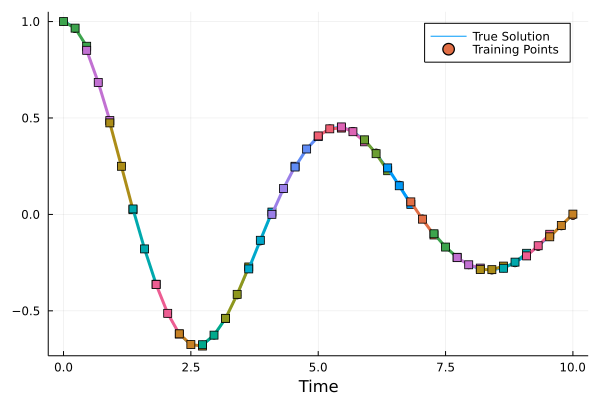

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


133.58447909720732

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


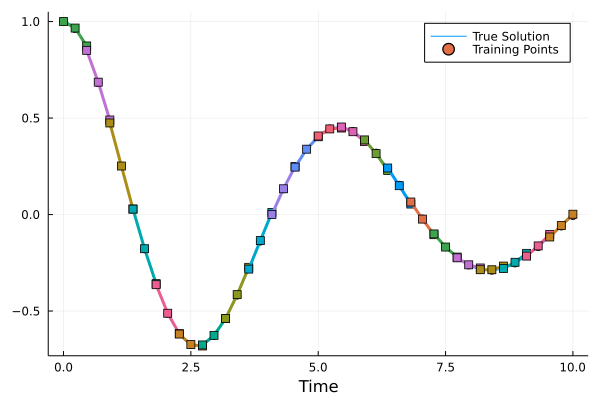

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


132.21226337302235

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


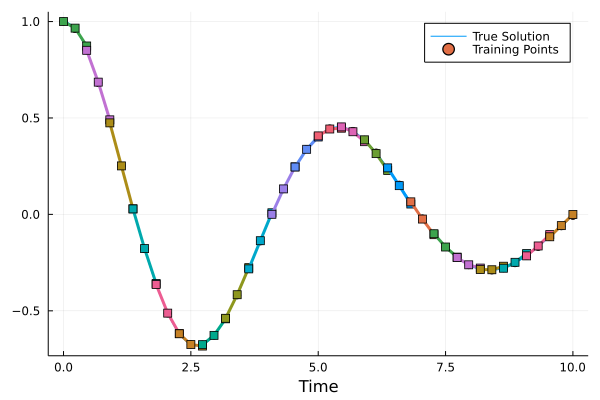

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


133.1949030275065

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


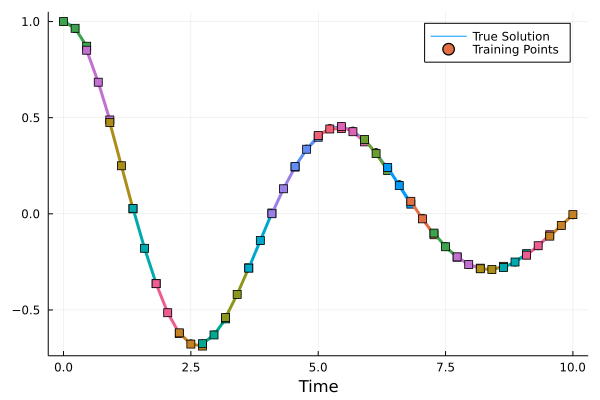

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


134.2741416756659

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


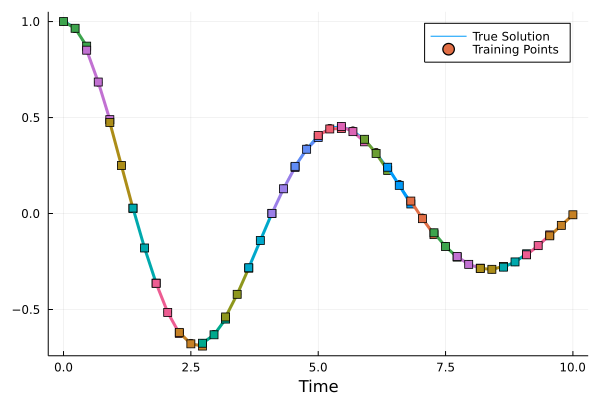

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


132.47713284484755

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


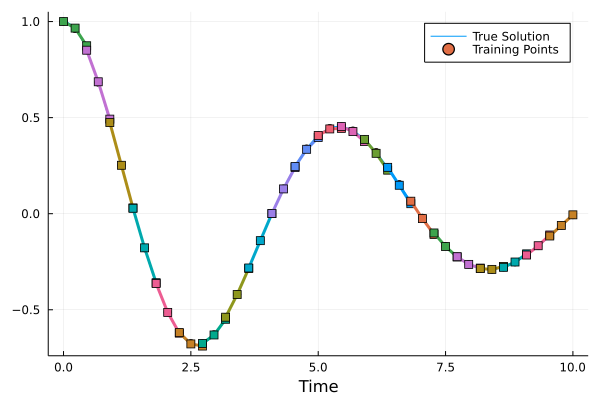

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


131.22514182806276

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


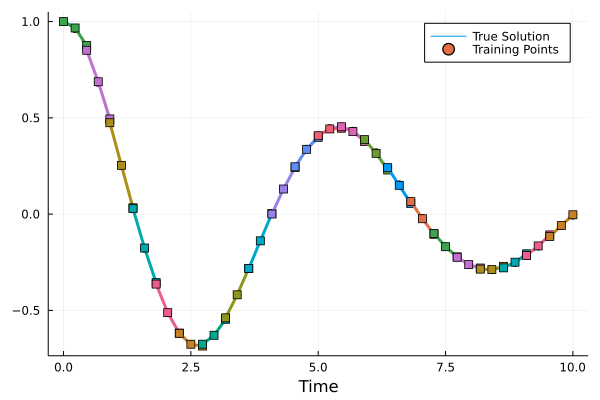

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


130.23182023038

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


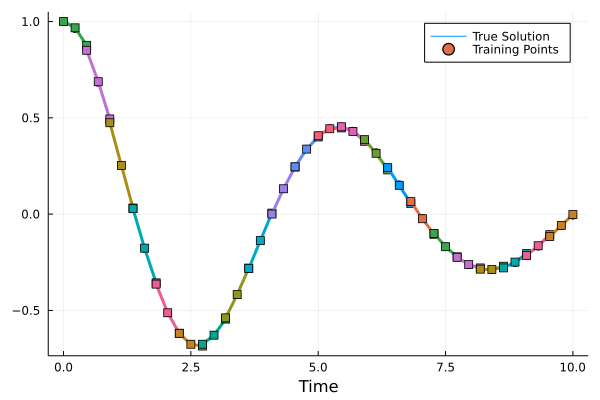

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


131.11863889603438

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


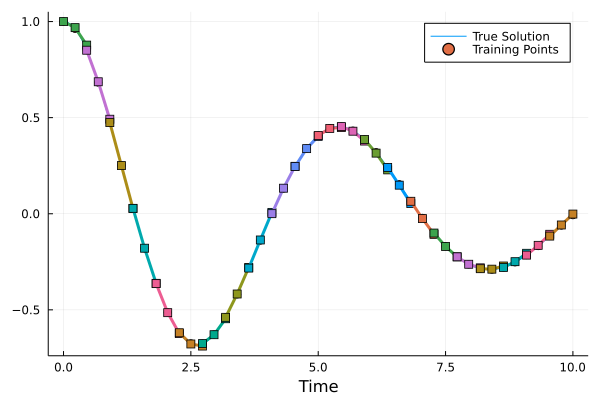

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


130.61284901692045

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


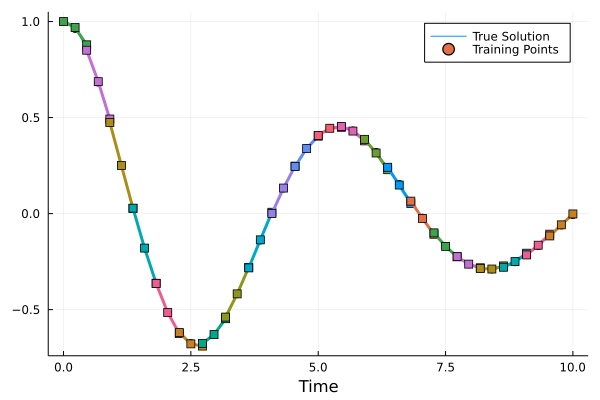

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


129.2413605934371

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


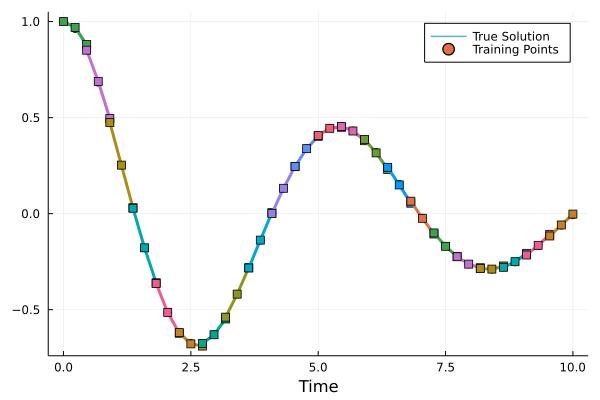

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


130.74738633247352

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


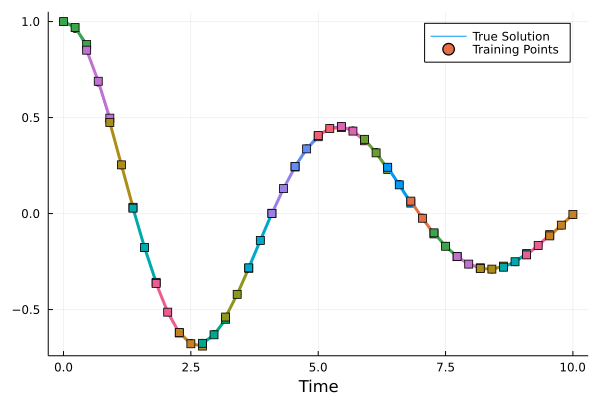

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


131.1736511039489

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


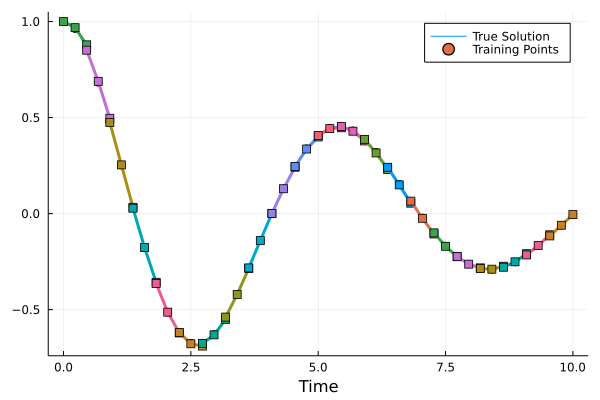

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


130.00336249833734

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


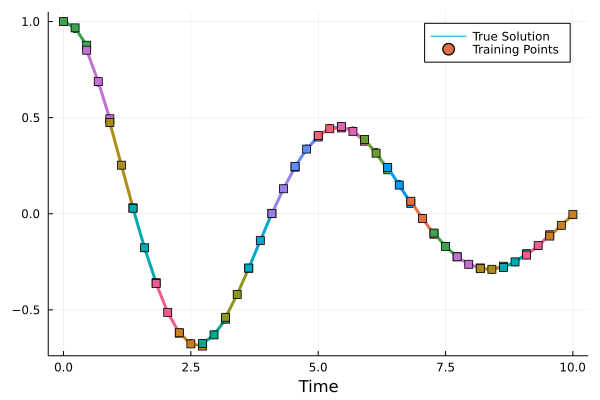

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


129.14645504040263

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


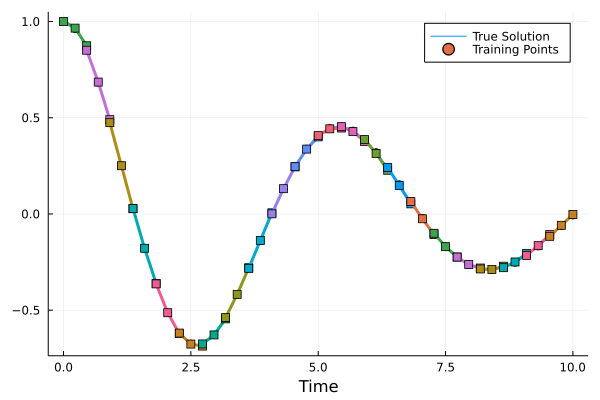

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


130.45118454761197

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


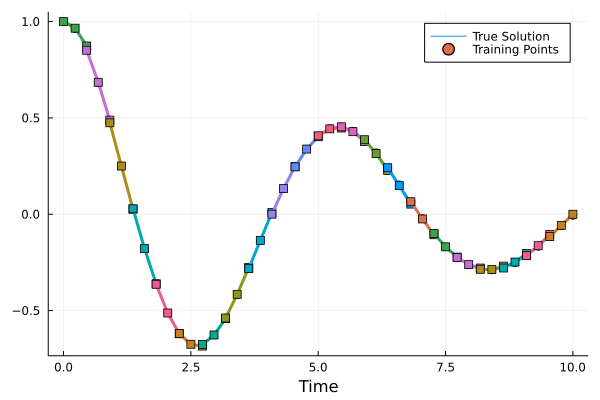

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


131.58478032282295

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


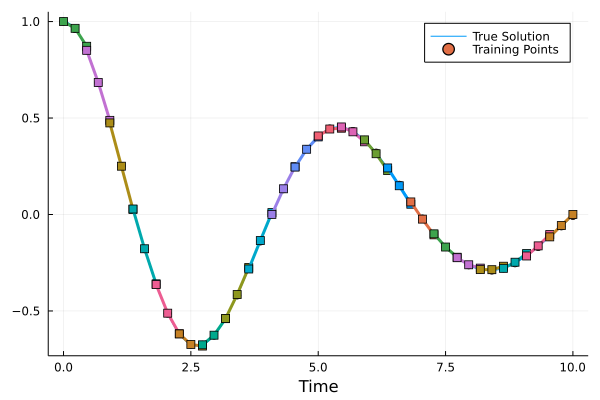

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


130.26528570211772

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


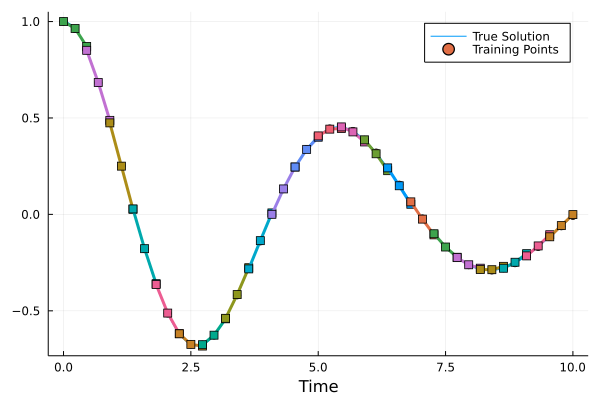

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


129.06959846495965

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


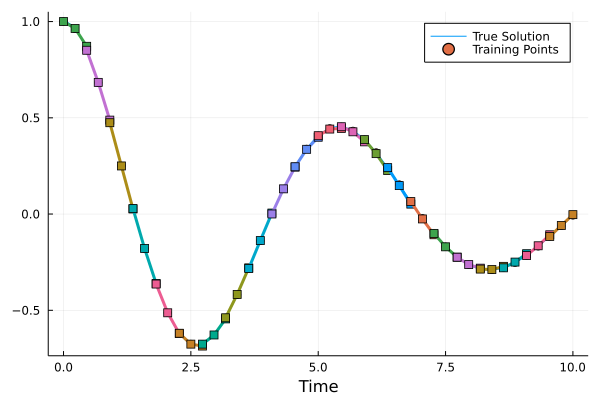

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


129.96982874497093

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


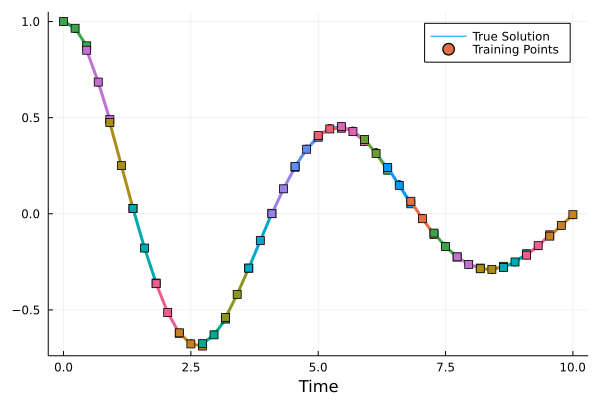

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


129.55217614479568

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


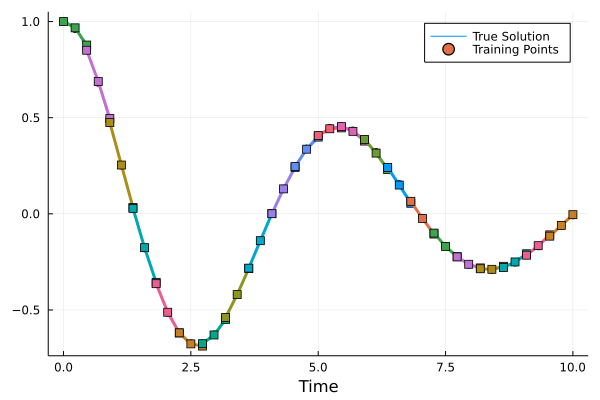

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


131.8740651612893

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


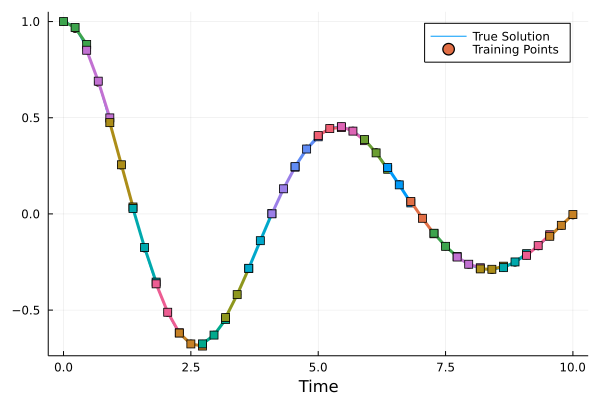

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


131.47772362980834

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


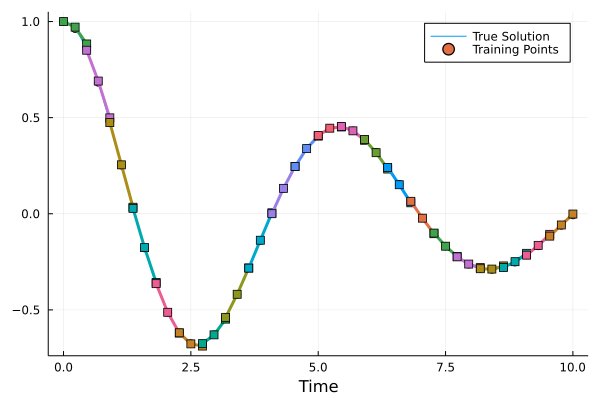

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


130.22031450984522

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


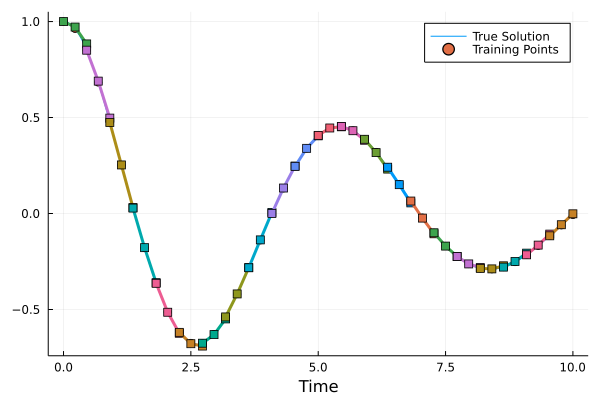

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


130.52901800816608

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


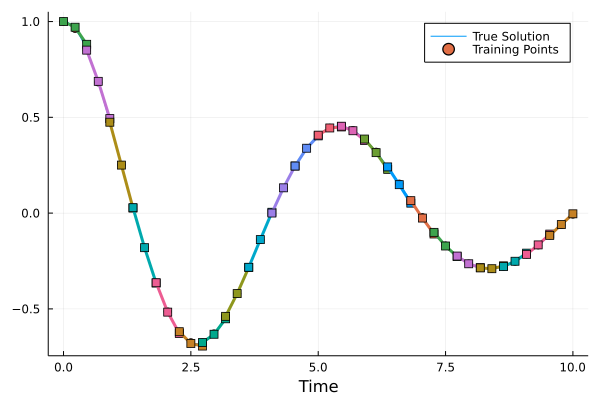

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


129.5395444772572

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


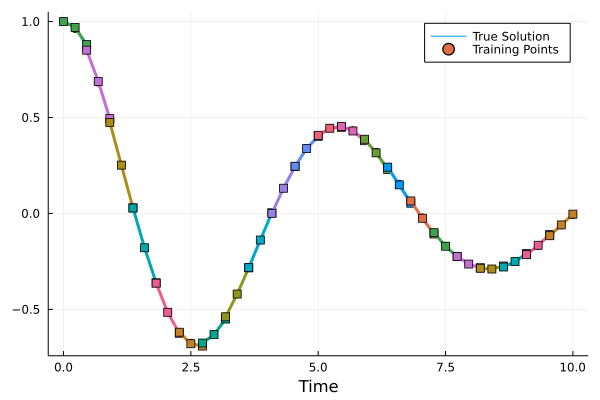

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


129.24973967481492

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


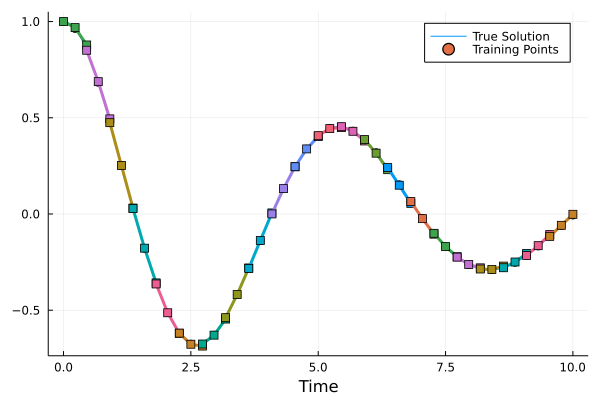

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


130.5748027029666

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


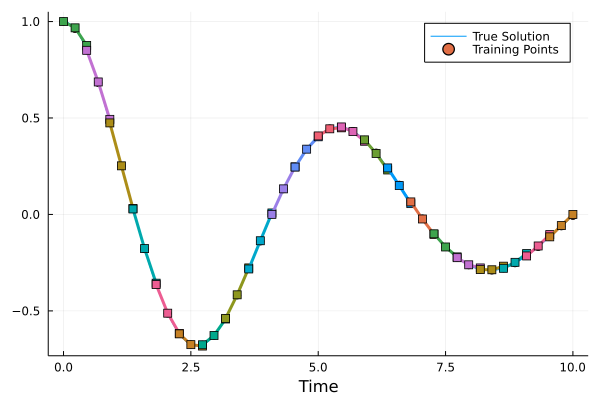

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


129.1804589857225

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


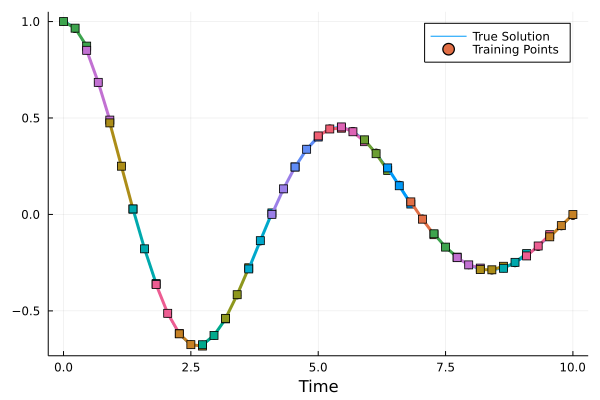

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


129.84041604344046

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


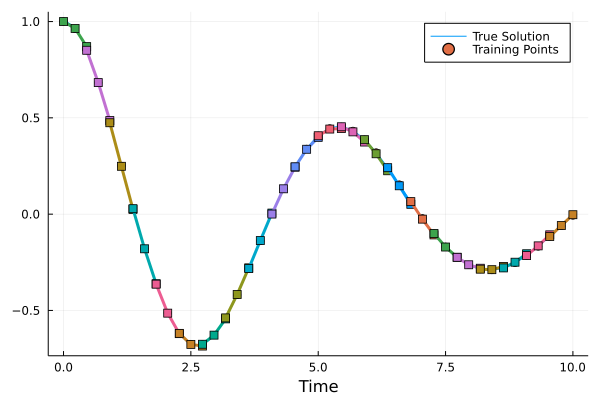

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


130.00532854956

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


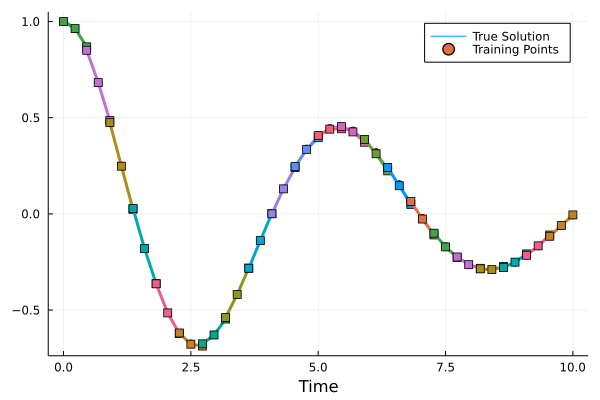

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


130.30749067017288

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


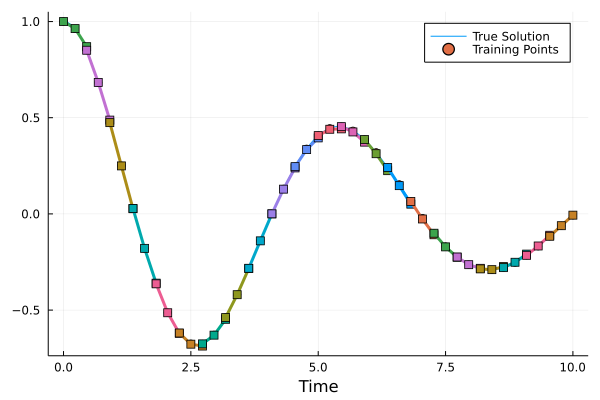

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


130.4553860488159

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


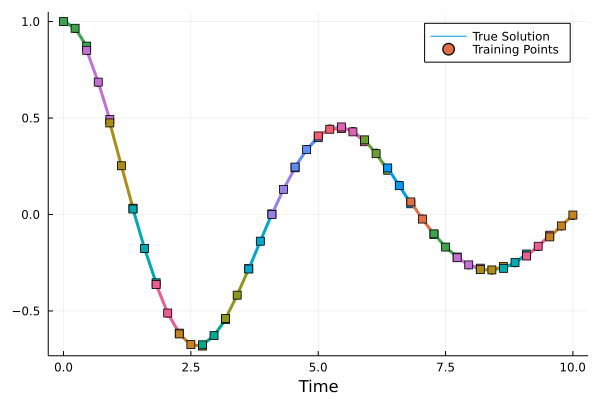

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


130.91650717234938

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


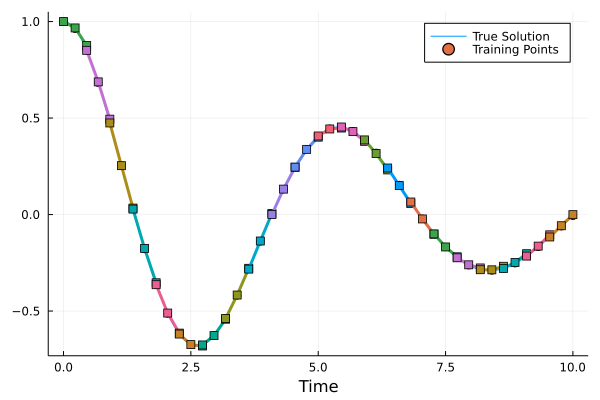

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


129.55707761280257

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


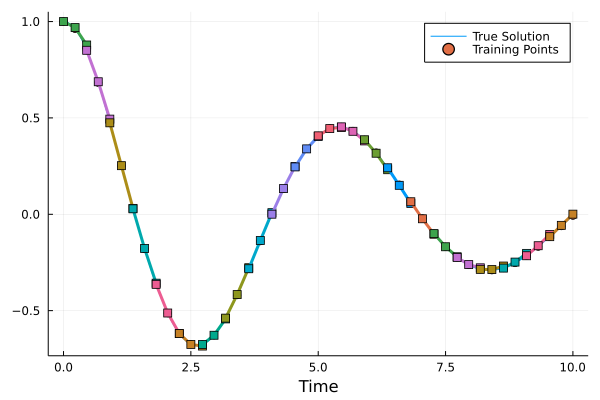

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


129.06959846495965

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


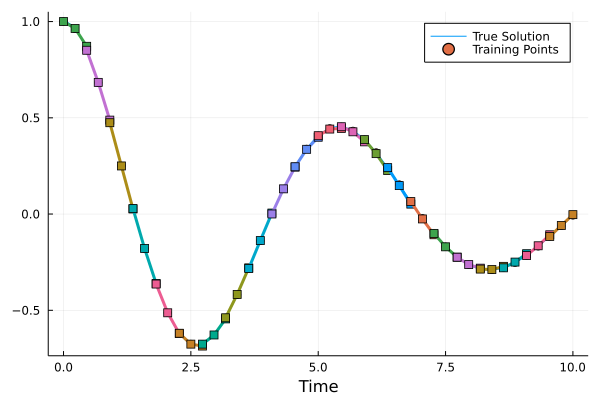

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


129.06959846495965

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


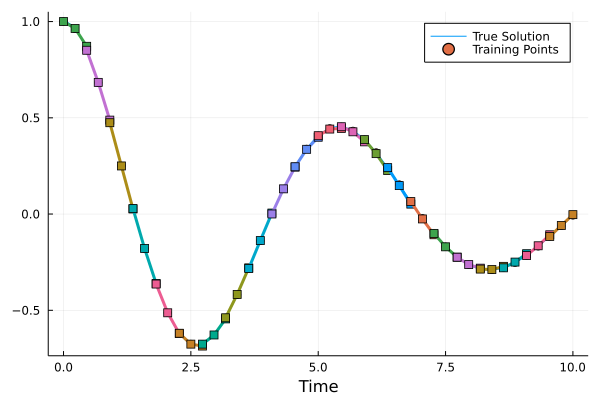

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


128.41054509885493

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


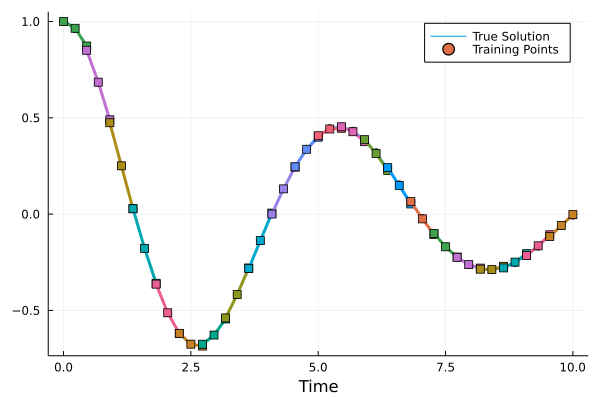

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


128.4032096899482

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


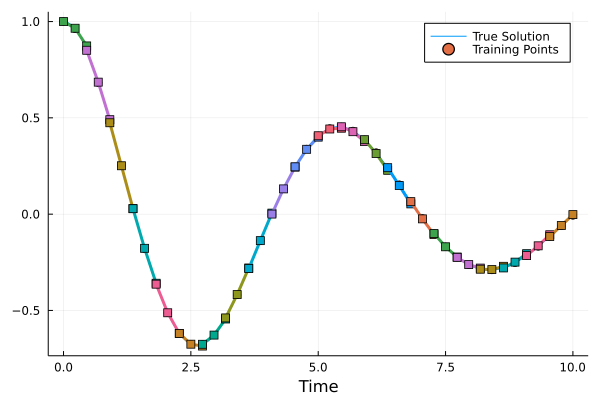

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


128.2214606423958

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


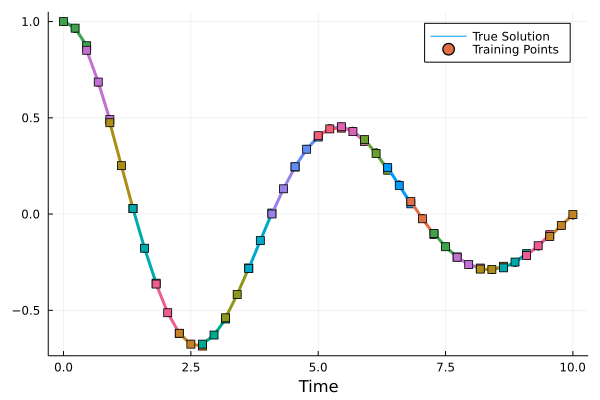

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


127.94160444784981

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


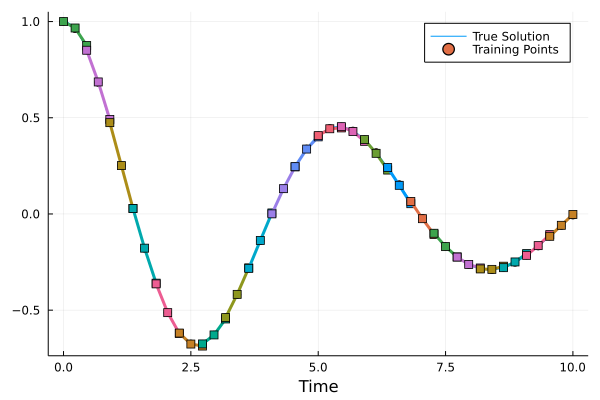

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


127.76302320831718

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


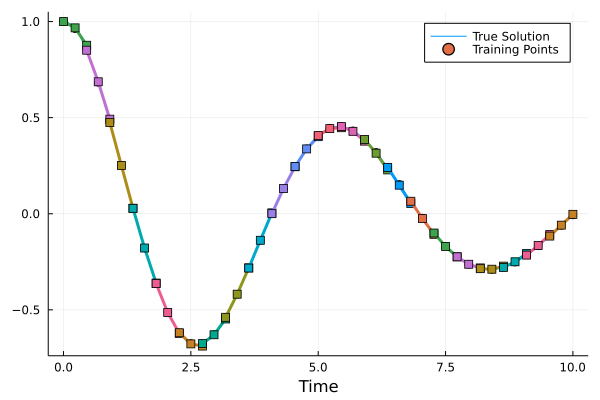

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


127.66038532343393

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


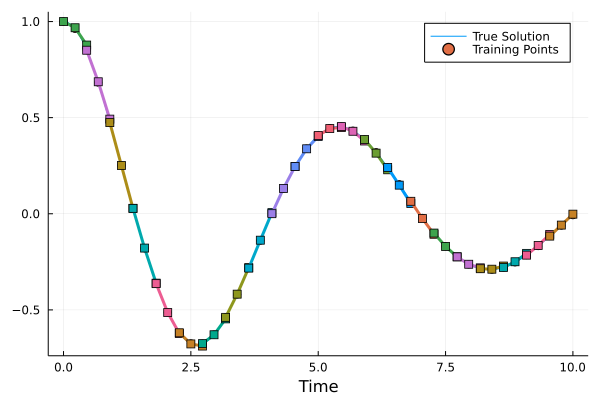

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


127.5869852440397

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


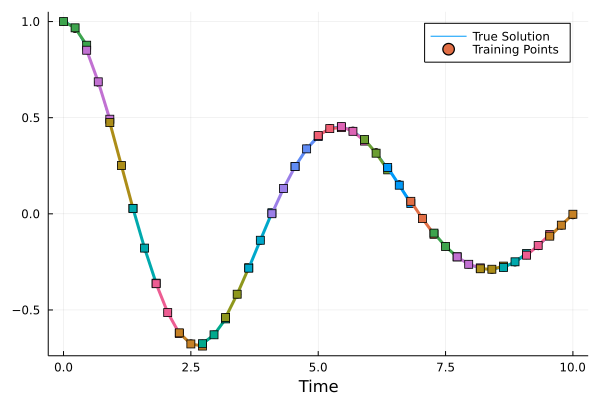

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


127.58406394379278

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


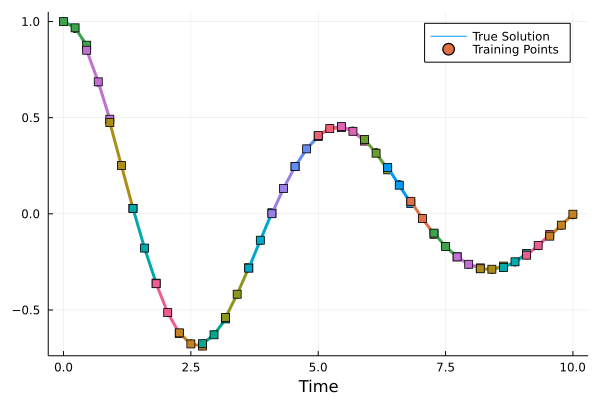

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


127.47930766654633

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


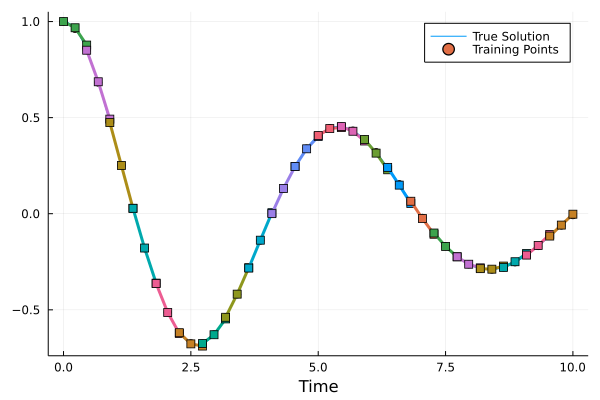

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


127.40802118602923

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


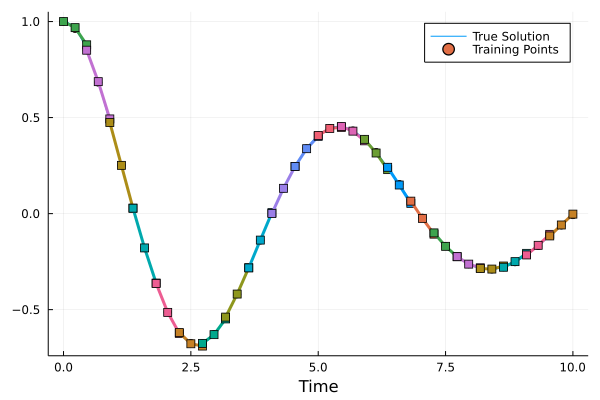

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


127.39132590753424

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


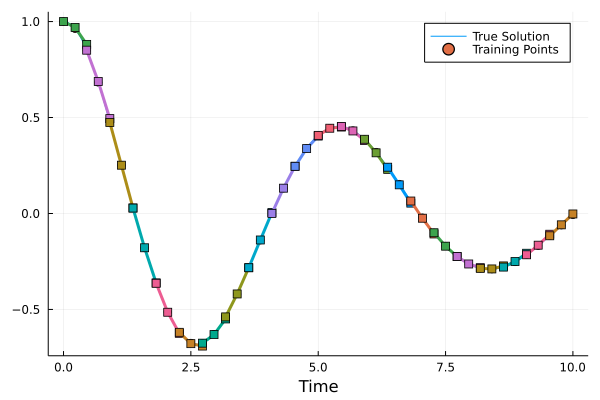

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


126.53816542414742

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


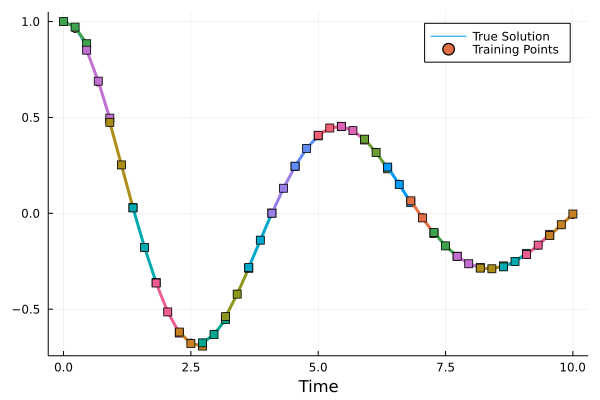

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


124.63590908713462

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


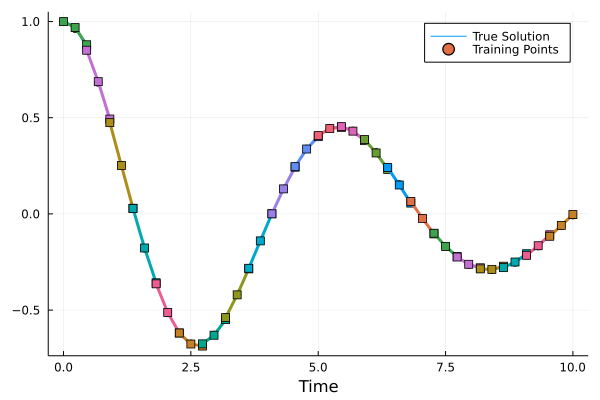

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


124.63569008229948

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


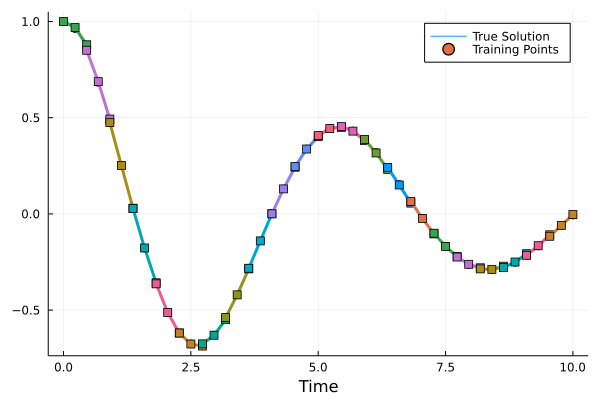

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


123.61915772824808

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


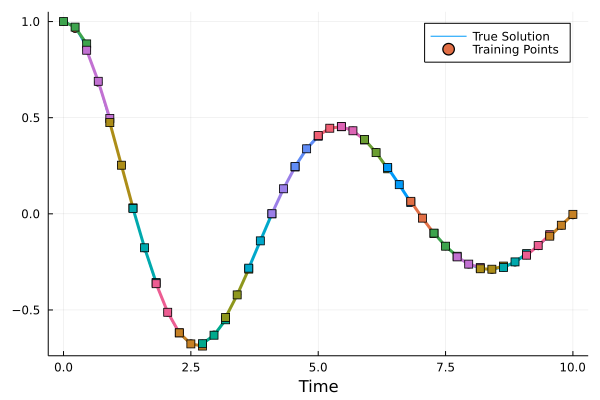

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


123.18655410689605

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


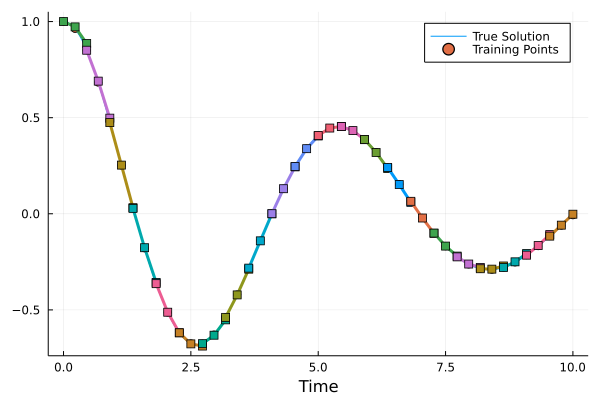

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


121.73557412381919

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


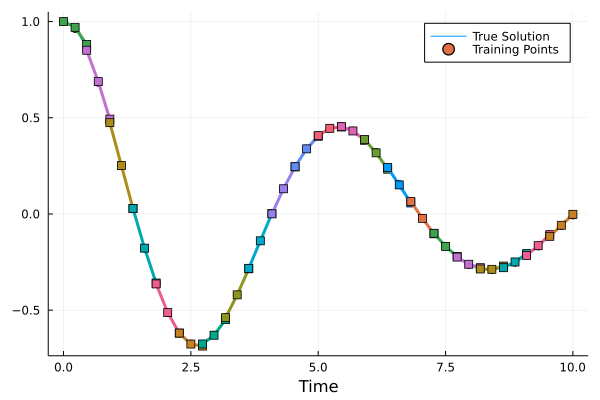

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


120.93817148856334

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


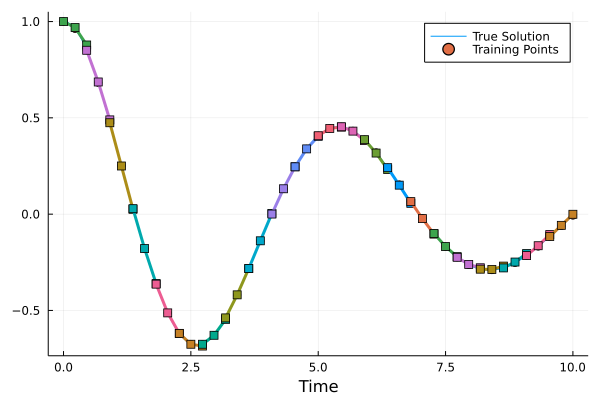

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


119.3898266147795

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


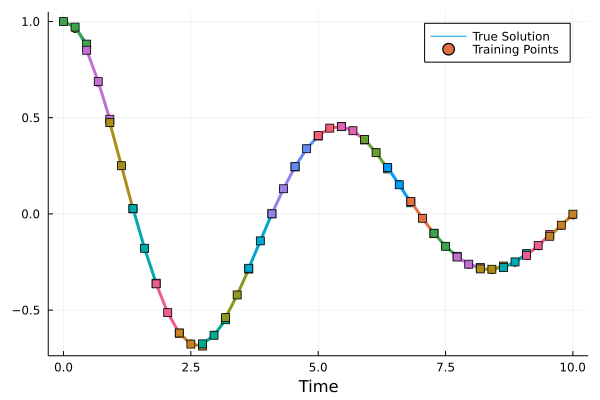

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


118.9764267475722

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


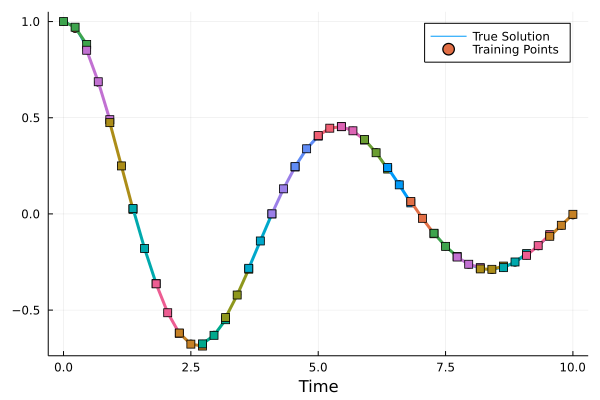

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


117.89639806172829

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


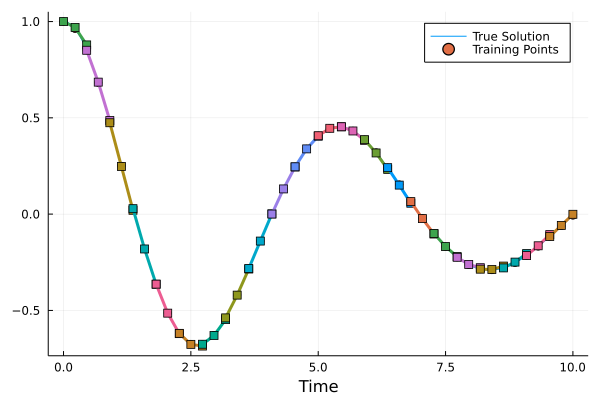

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


117.30343474599057

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


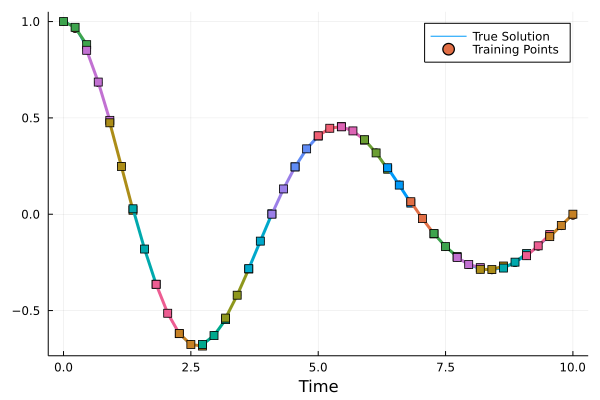

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


116.5866926809187

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


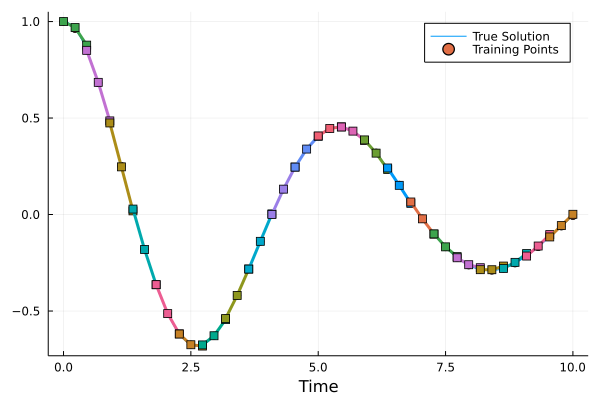

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


115.94234043760275

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


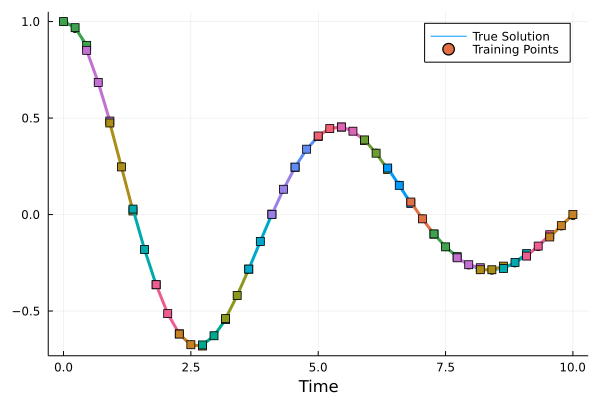

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


115.94132469814785

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


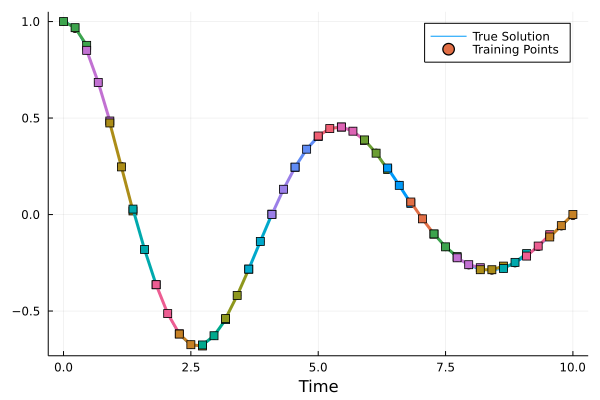

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


115.87366761536877

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


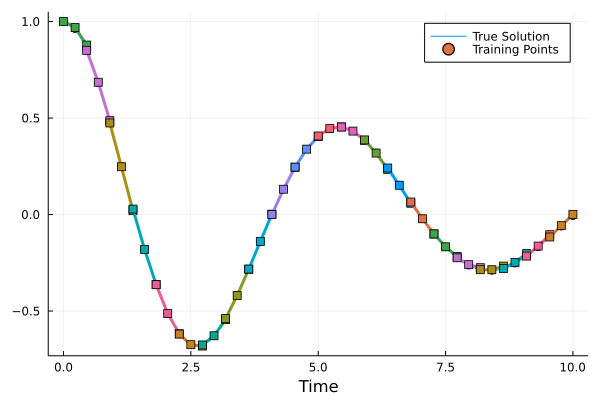

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


115.77231828905562

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


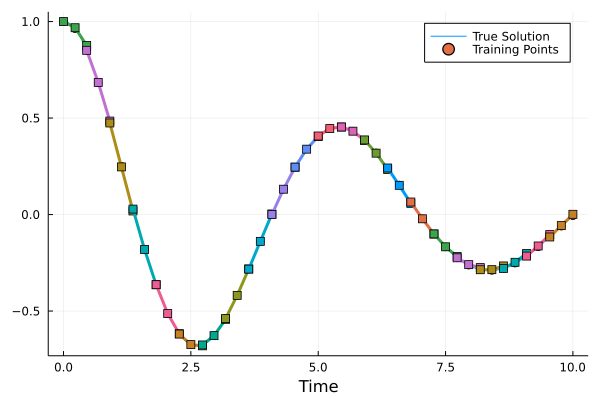

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


115.50391811682758

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


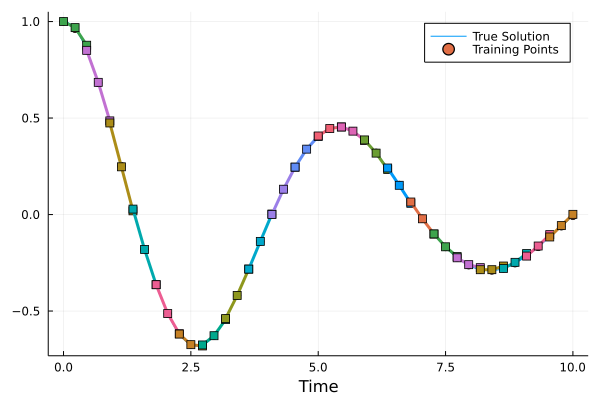

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


115.44430110325101

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


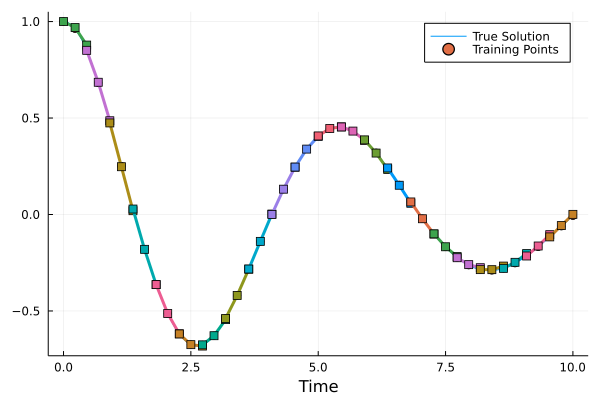

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


115.37648515254895

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


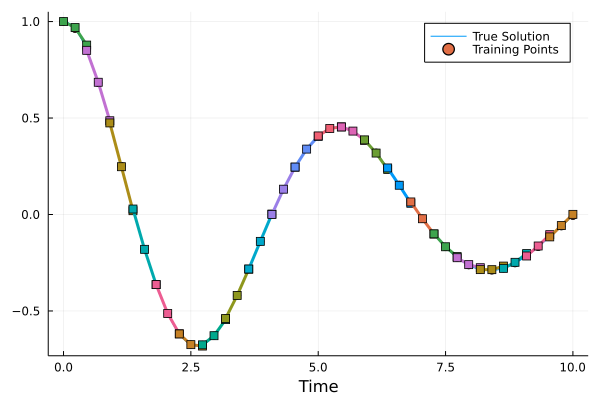

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


115.37494797255059

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


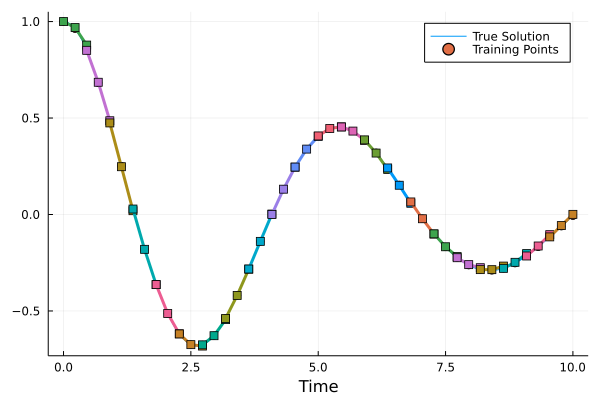

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


115.08416281061406

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


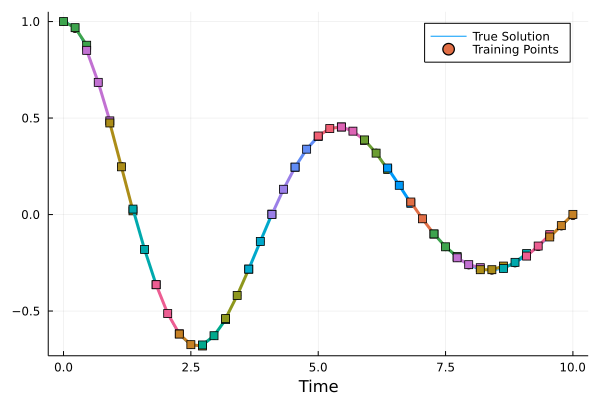

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


114.94124809904986

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


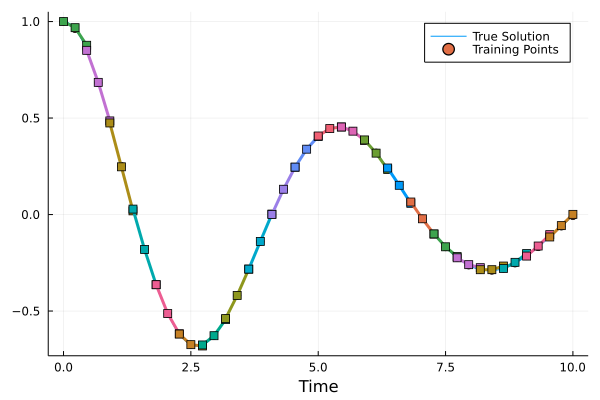

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


114.9192033079664

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


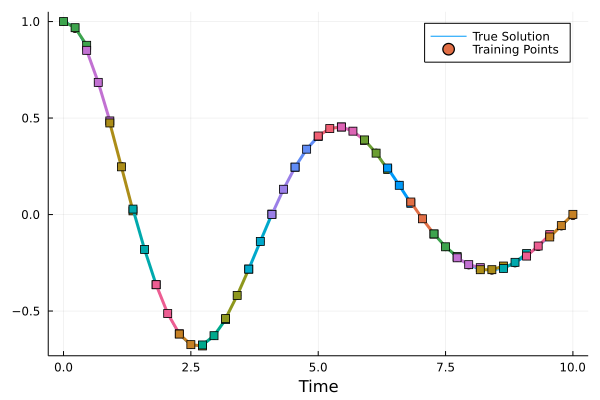

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


114.87532104150719

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


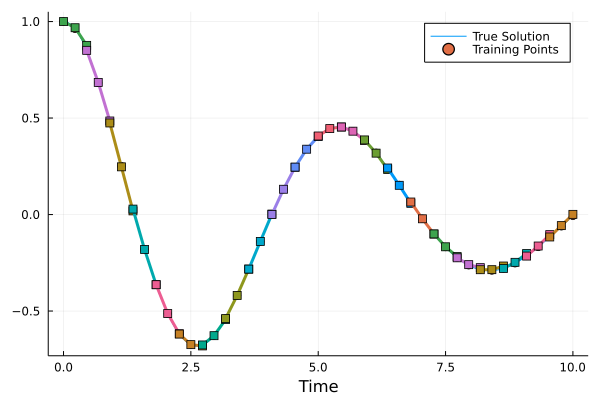

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


114.33126106434669

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


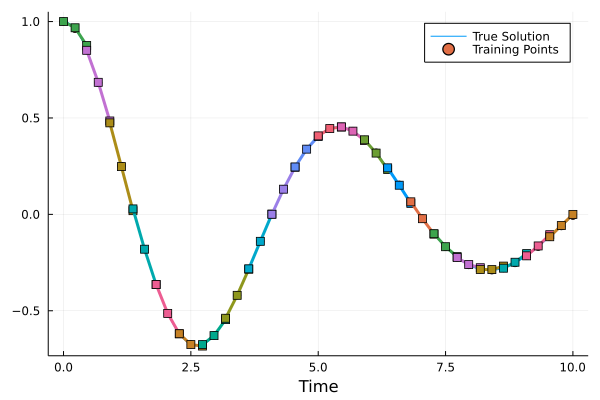

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


112.9150632222937

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


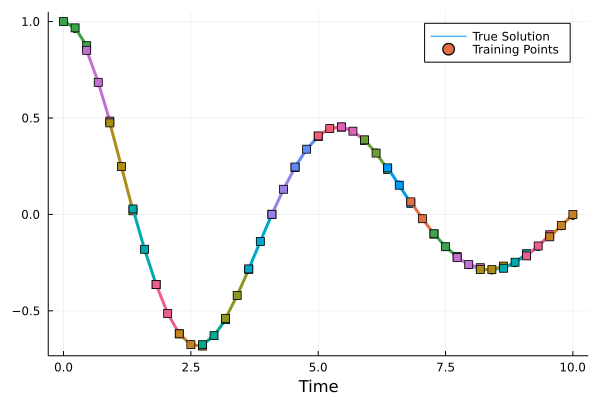

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


112.76810217204014

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


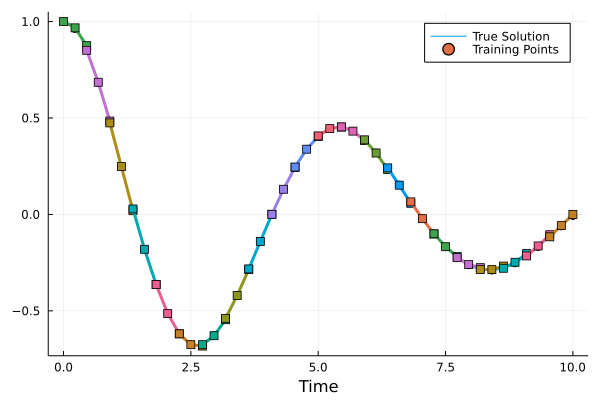

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


111.145558015341

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


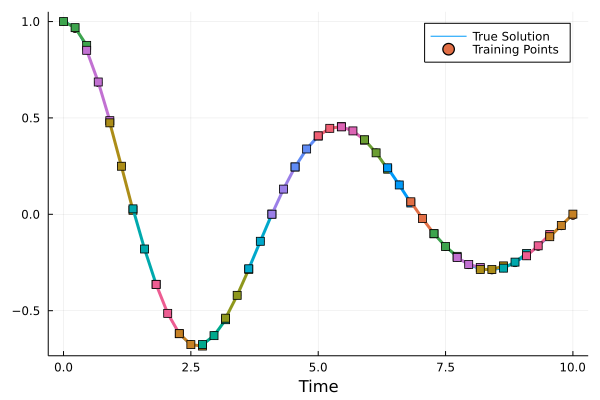

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


111.09393458572126

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


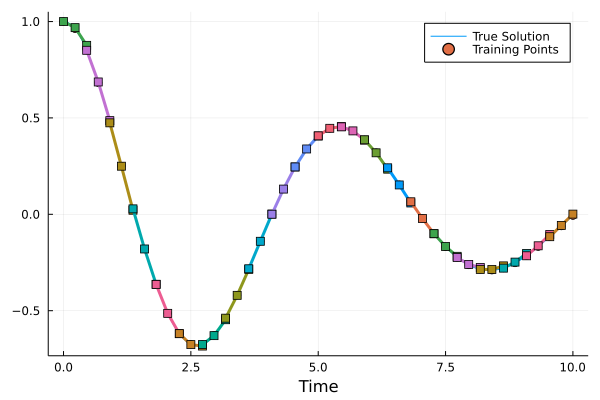

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


111.02454911958593

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


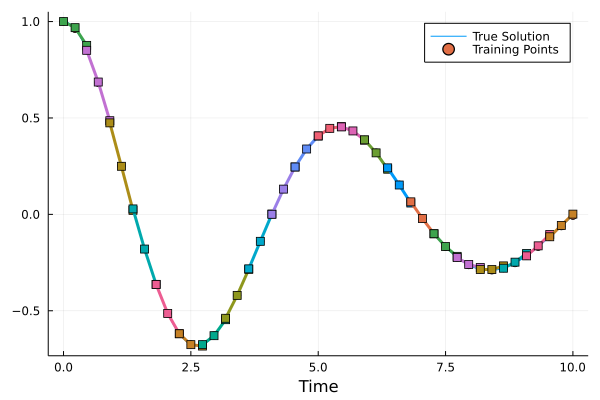

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


110.84186073739033

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


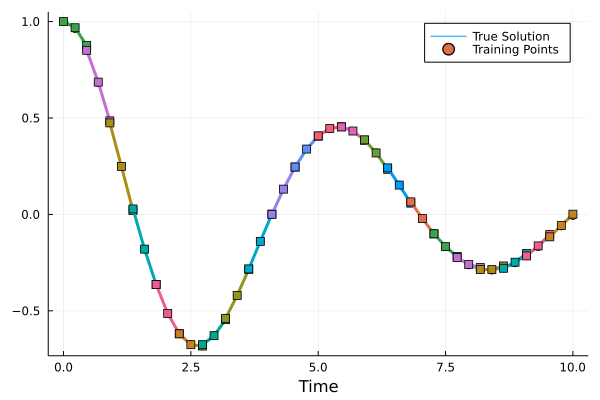

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


110.56501398764706

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


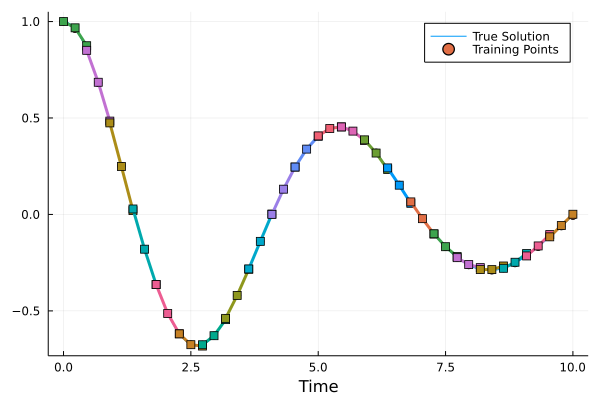

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


110.52727154180455

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


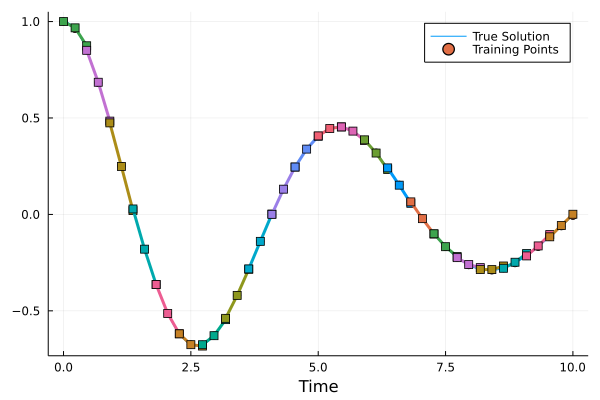

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


110.52517323772514

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


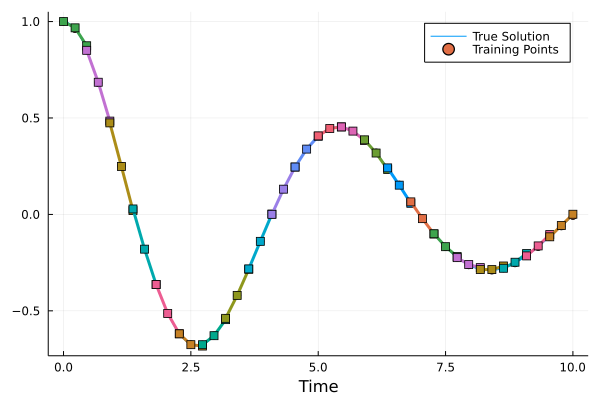

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


110.50153029803808

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


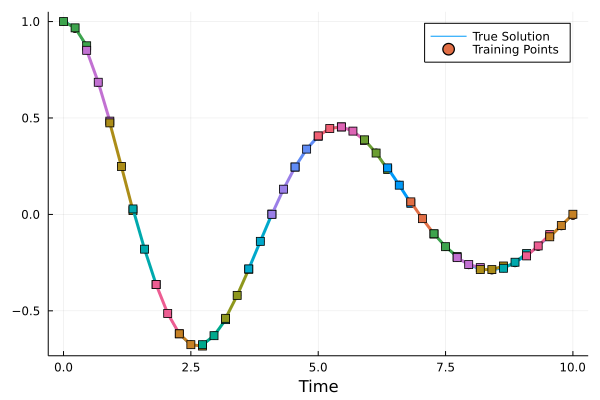

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


110.49450713918255

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


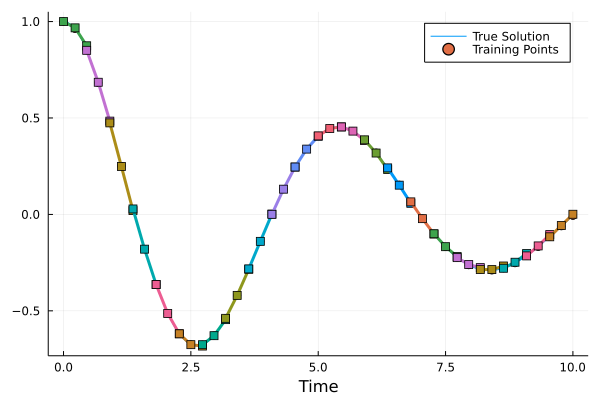

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


110.43068915394775

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


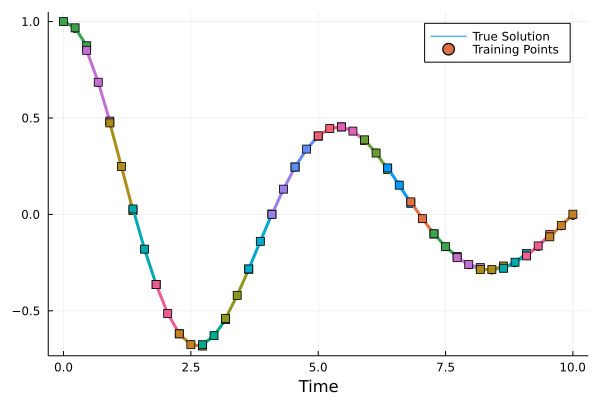

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


110.34592384540531

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


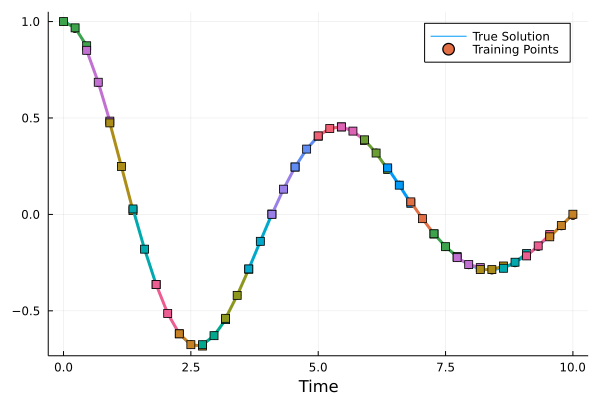

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


110.32590373134967

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


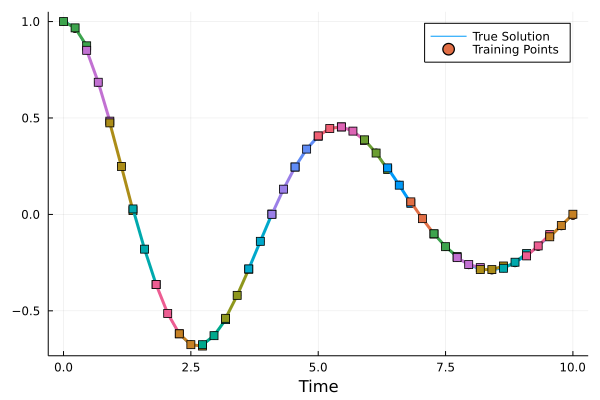

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


110.21888530245212

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


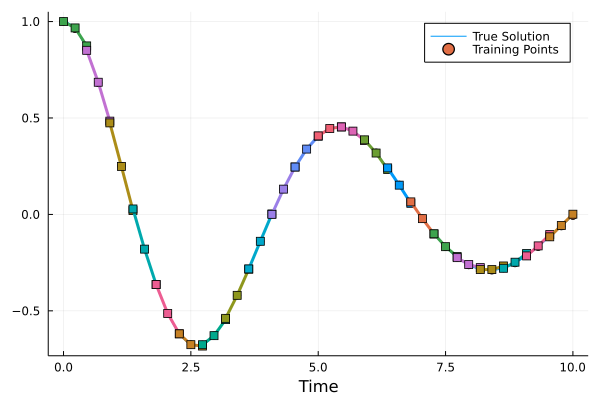

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


110.07269120449294

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


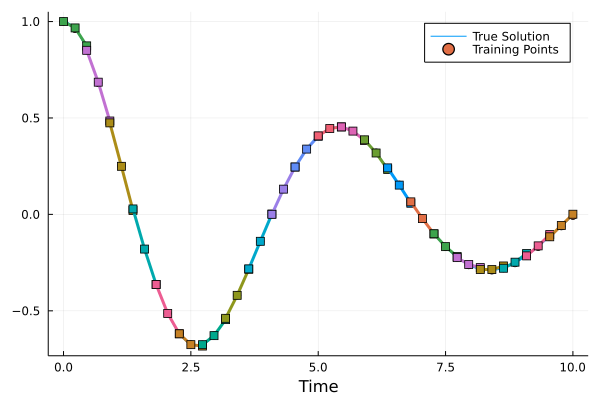

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


109.96192216817713

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


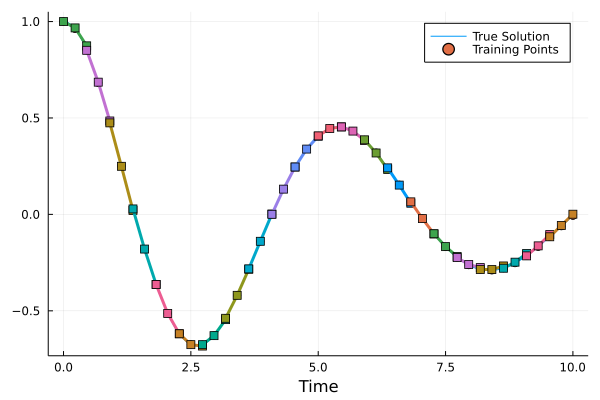

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


109.8836112713432

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


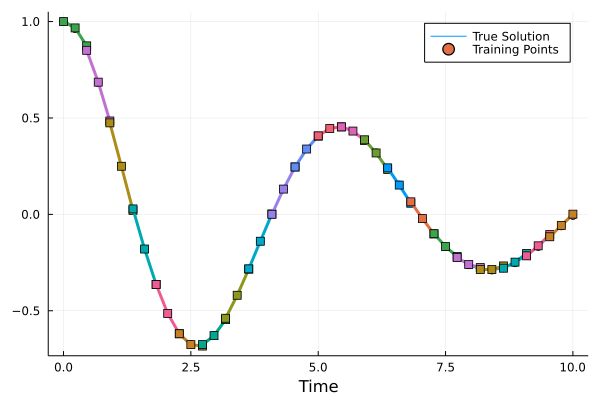

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


109.84766885757321

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


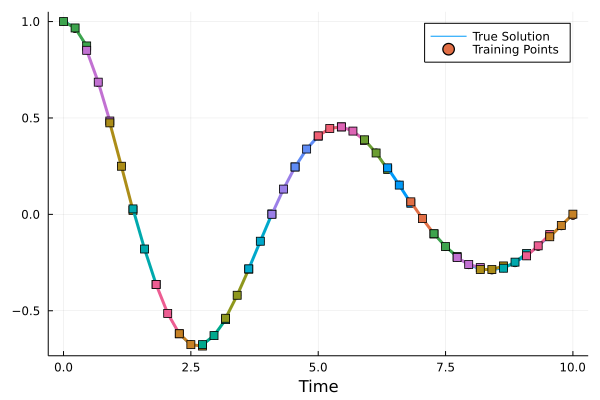

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


109.6404092917691

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


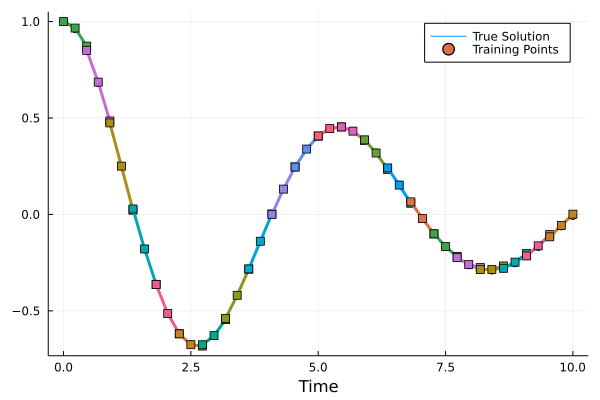

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


109.42282118724607

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


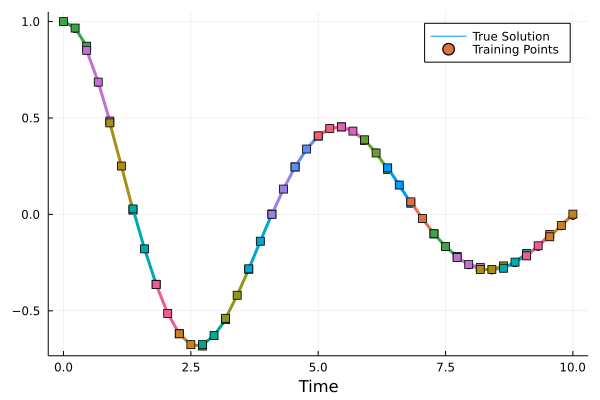

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


109.37392397702745

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


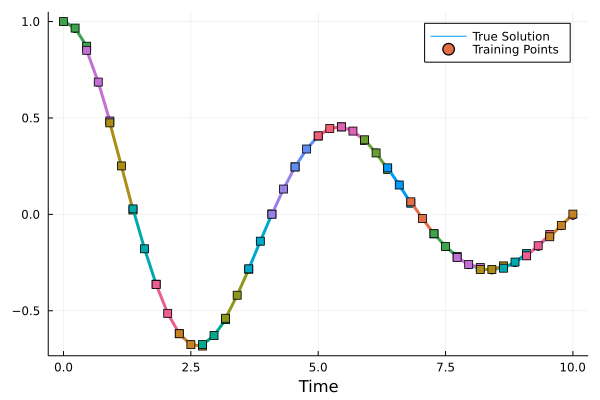

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


109.1592829794169

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


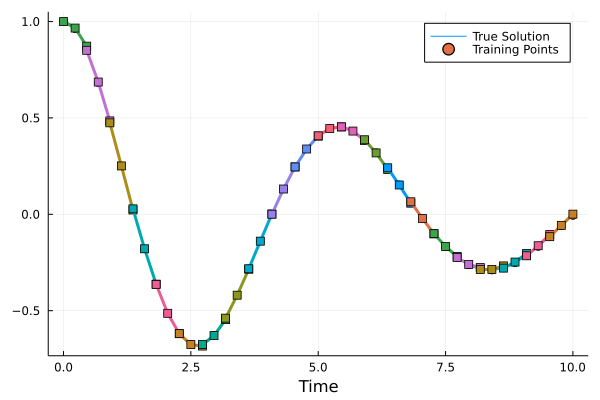

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


109.03847842498931

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


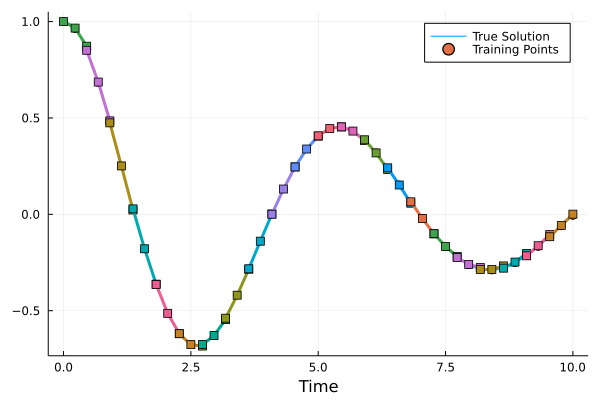

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


109.01464681493538

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


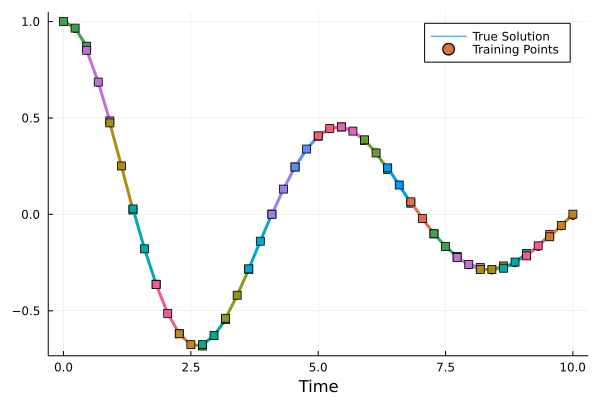

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


108.98026125762782

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


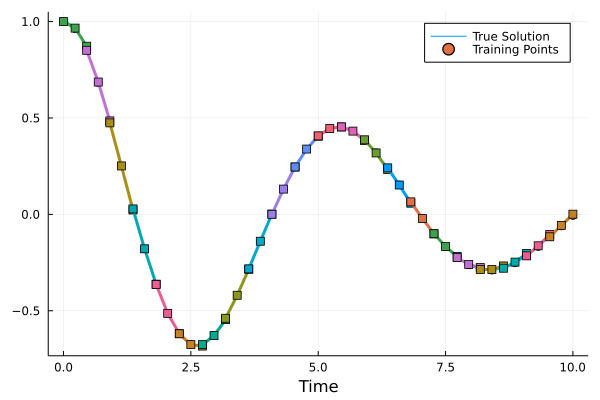

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


108.8873966932042

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


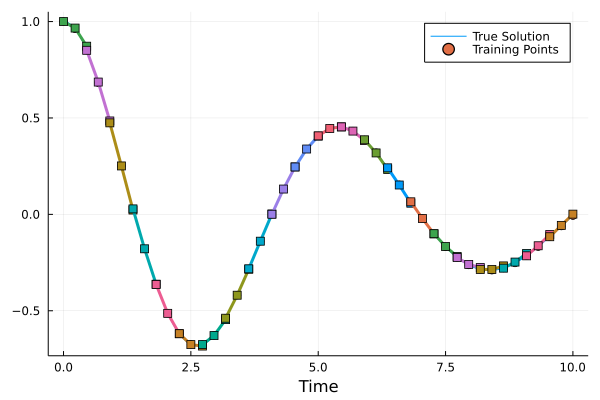

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


108.8682036577527

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


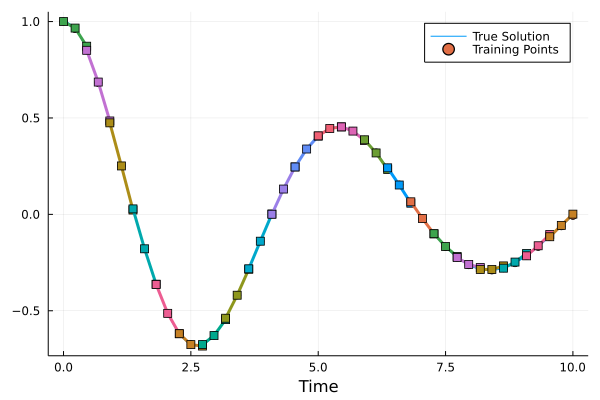

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


108.8630354530199

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


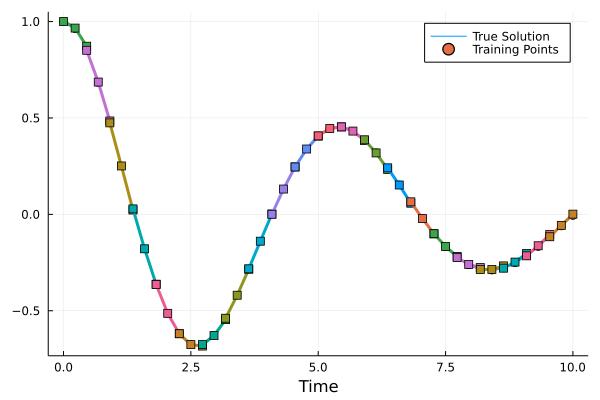

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


108.79654035305154

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


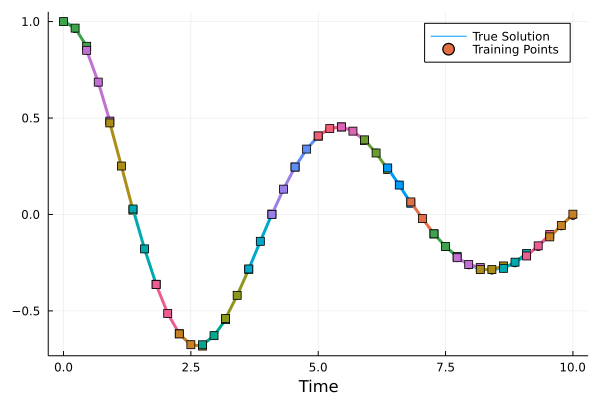

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


108.6868201028399

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


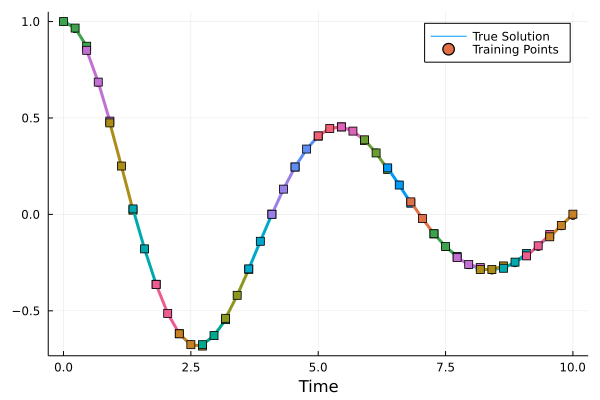

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


108.67603835277343

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


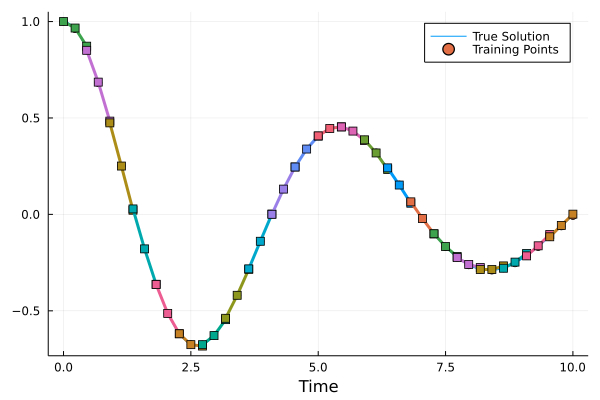

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


108.50037966325664

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


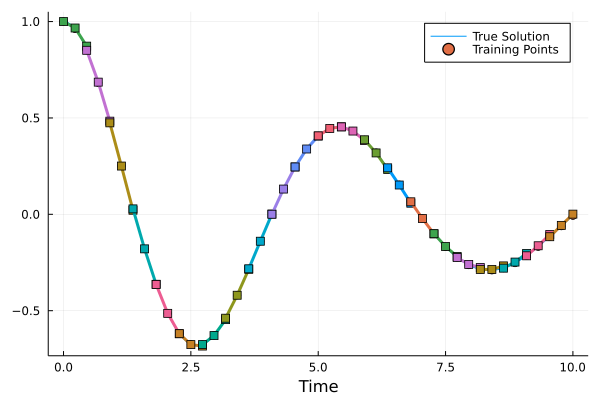

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


108.47216313920266

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


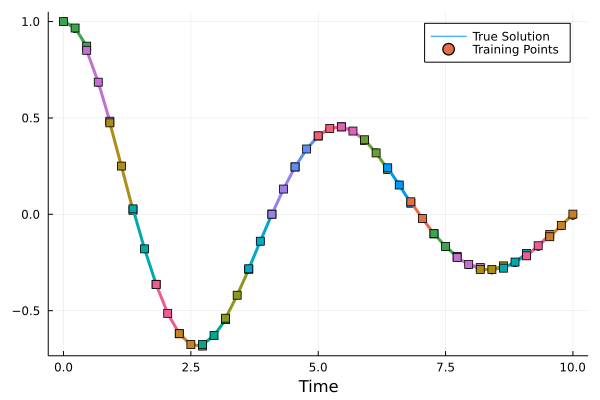

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


107.83968039204437

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


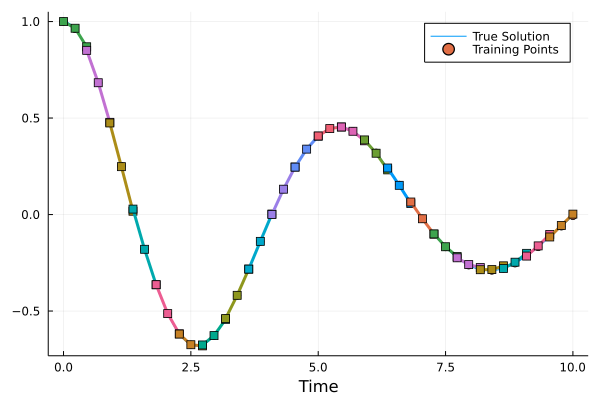

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


107.47612212798823

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


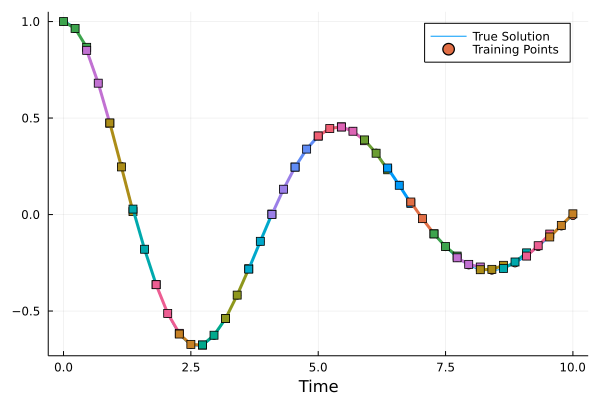

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


105.9432155375051

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


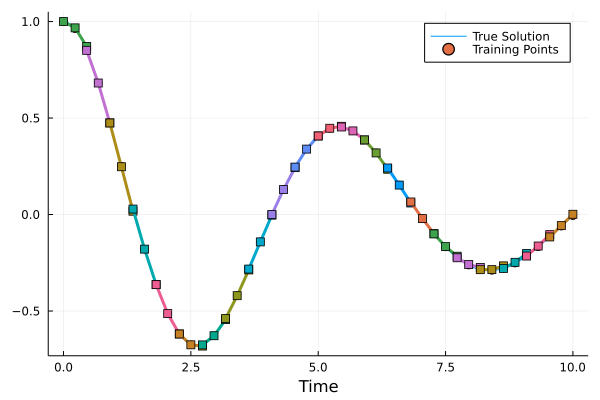

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


105.84927955688666

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


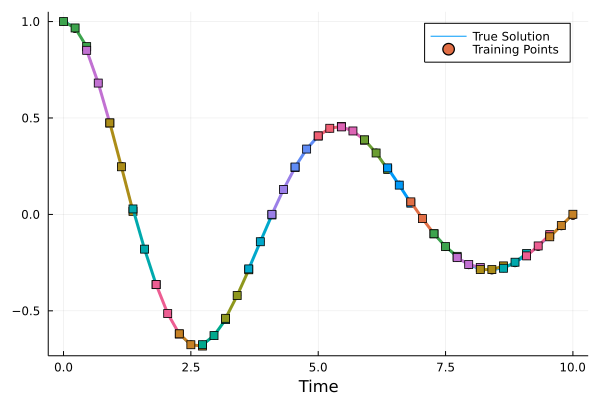

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


105.24136415943443

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


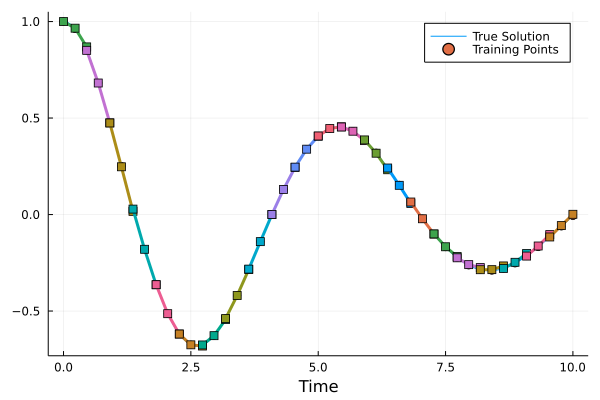

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


104.0401486474423

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


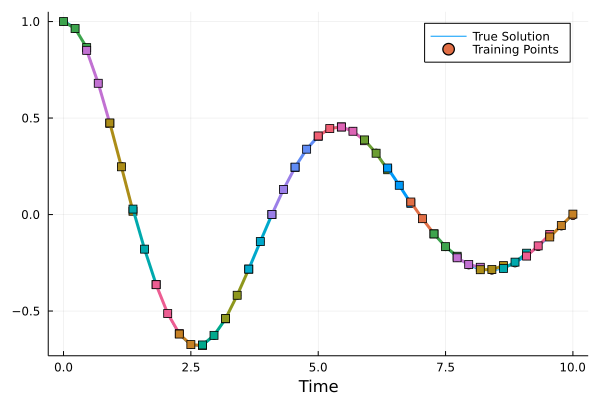

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


103.5369491484974

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


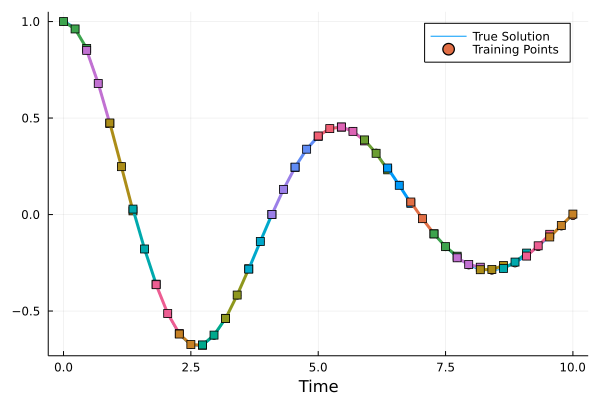

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


97.6526194822866

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


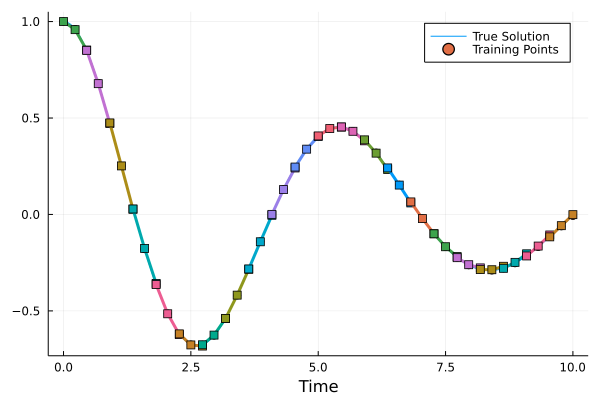

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


97.13461649720492

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


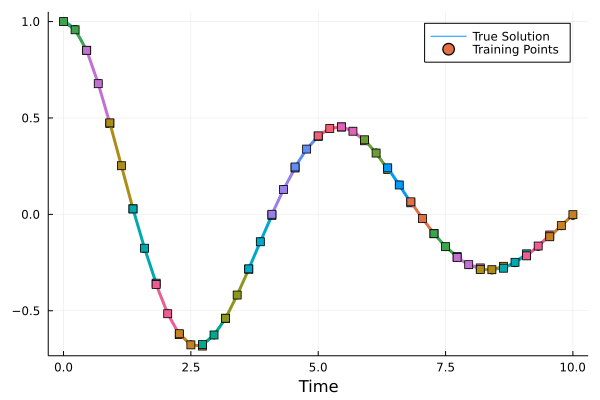

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


95.897510186708

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


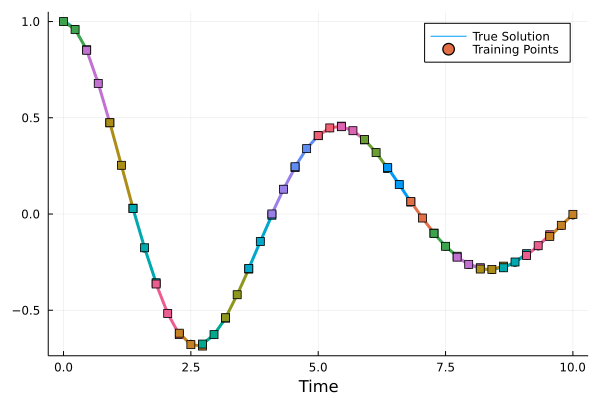

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


89.12598070649003

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


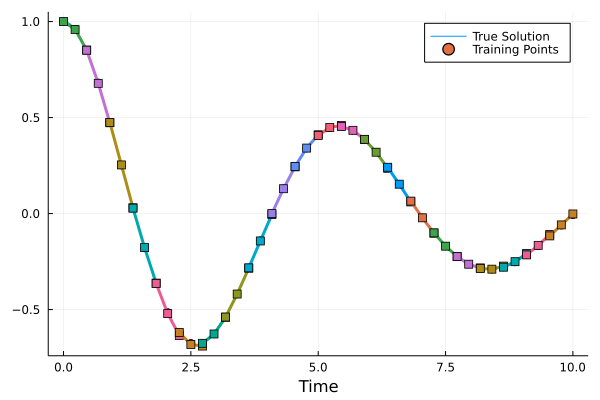

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


88.34677282614312

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


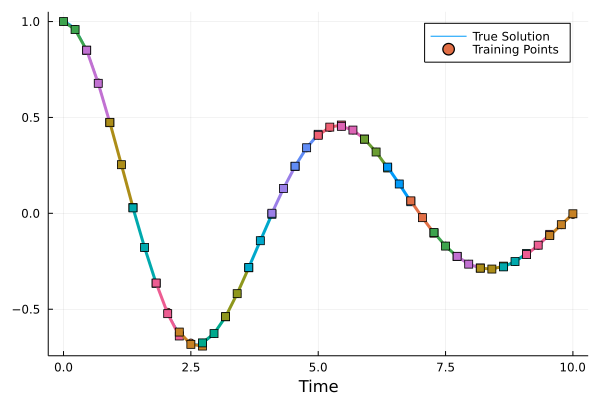

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


86.78123370922734

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


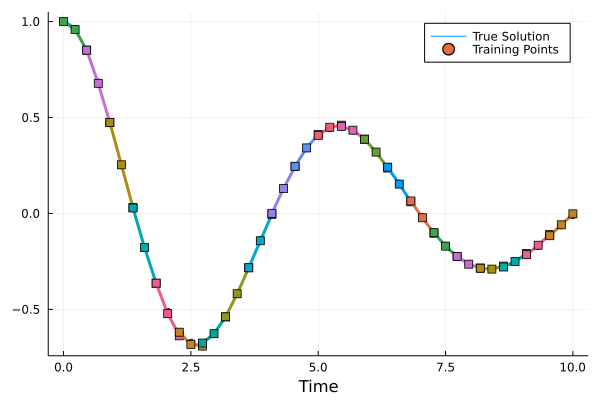

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


86.49494234399944

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


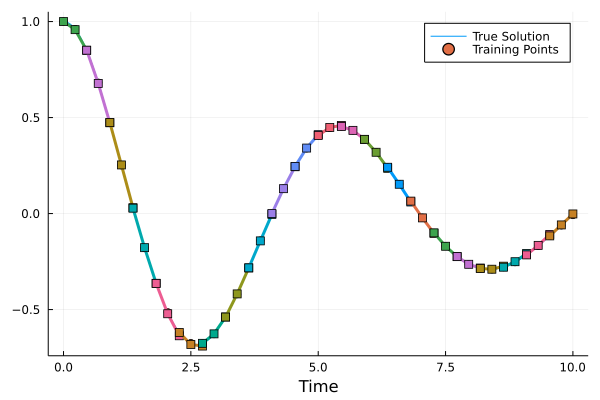

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


85.77112481691356

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


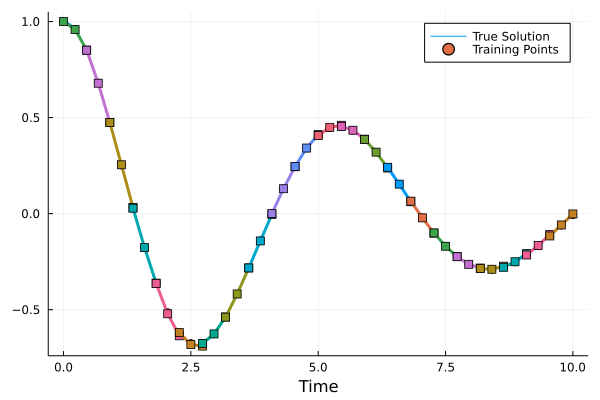

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


84.99242357978144

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


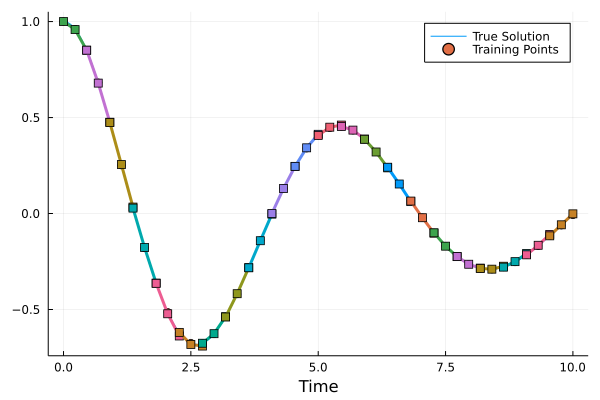

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


83.89104091742229

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


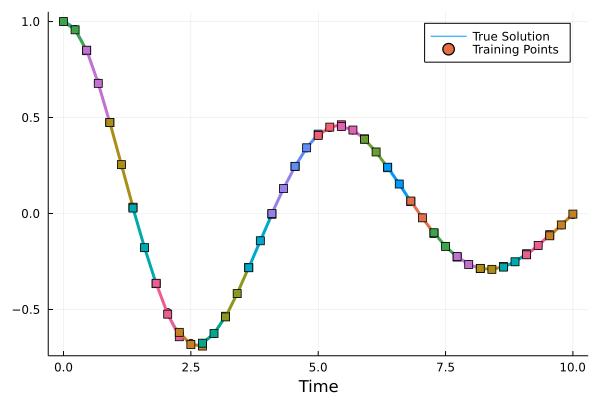

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


81.10088225625094

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


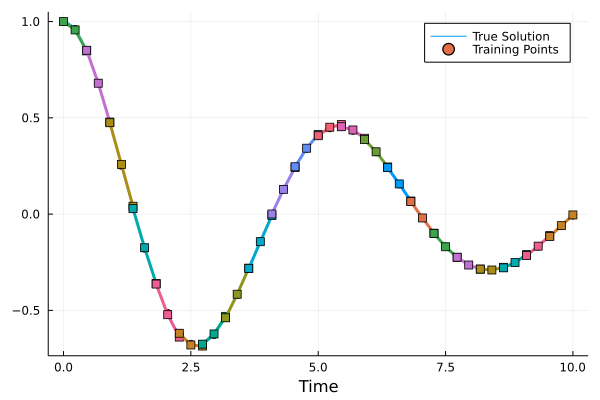

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


79.19232034397061

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


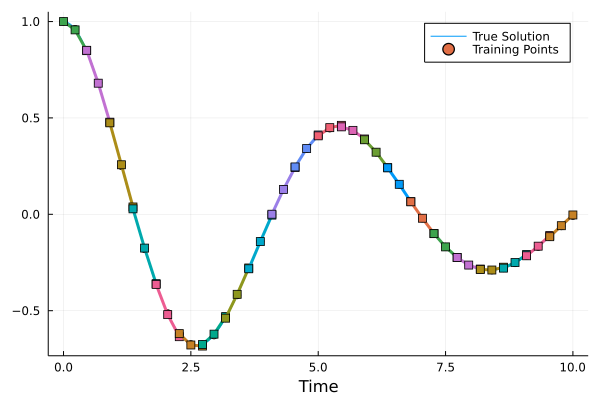

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


77.46435222240682

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


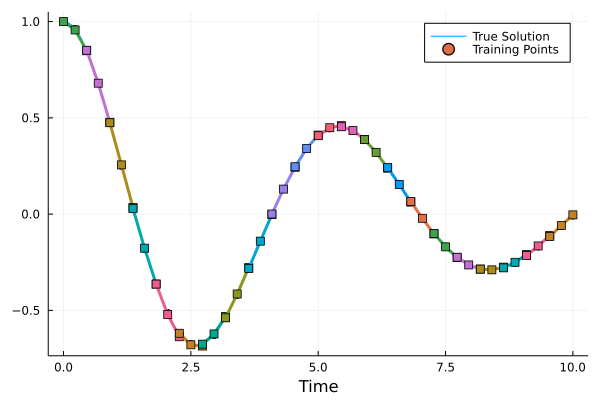

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


75.13315385844373

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


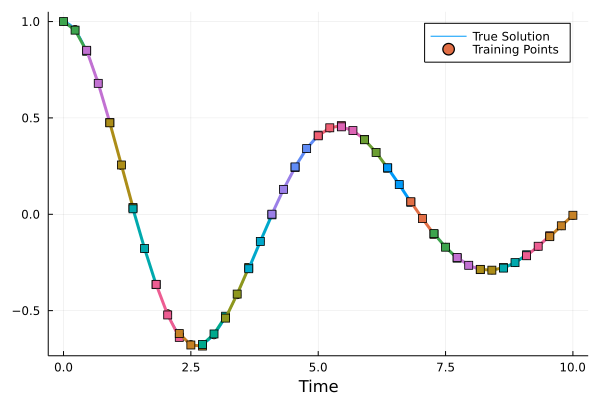

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


70.92832028097905

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


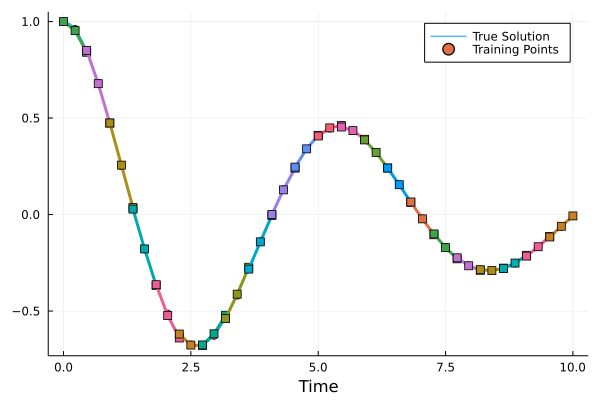

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


69.34835691811489

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


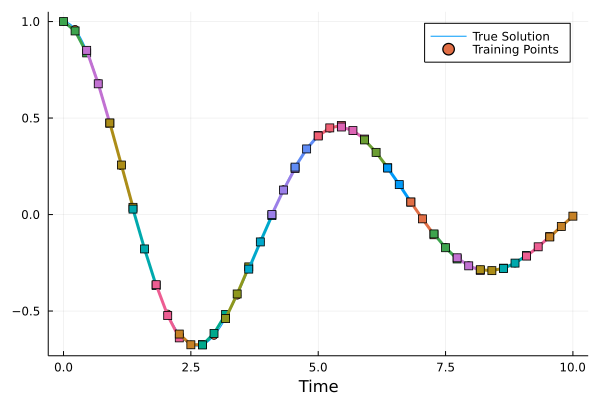

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


66.5260927557007

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


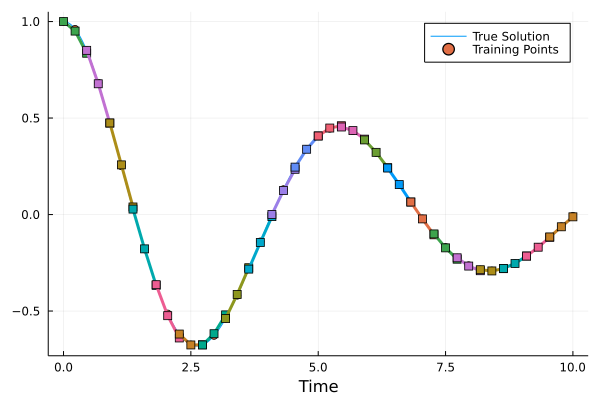

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


63.13298609993521

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


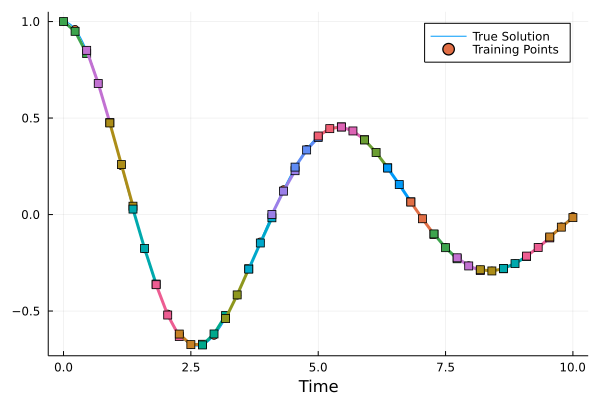

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


60.93234547921597

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


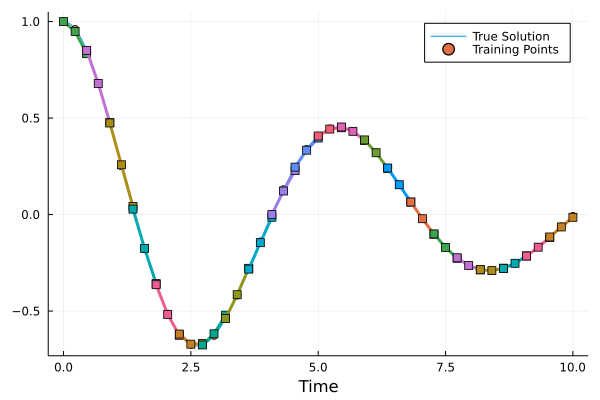

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


56.85630604784195

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


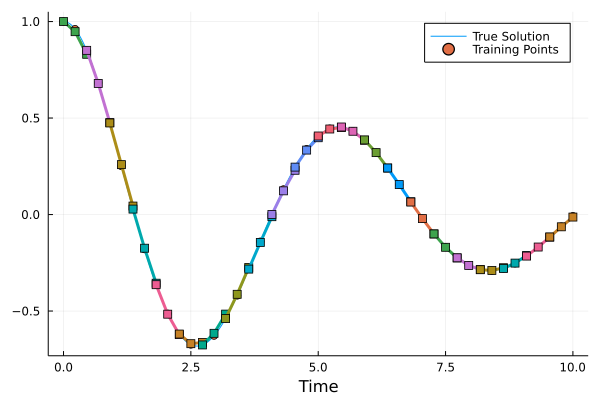

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


52.52907418393685

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


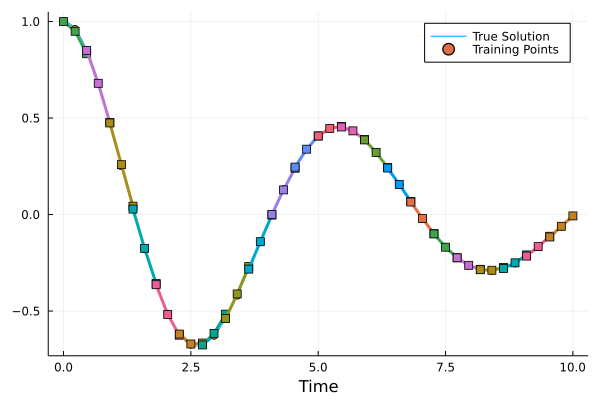

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


48.85460671516858

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


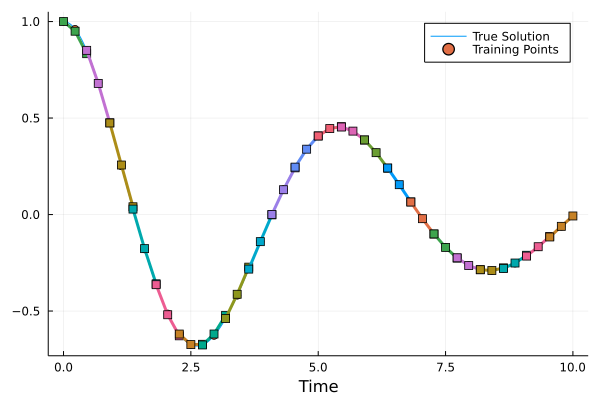

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


45.41471300239802

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


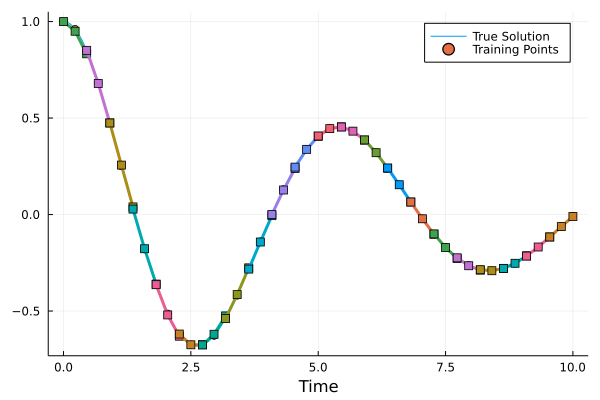

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


u: ComponentVector{Float32}(layer_1 = (weight = Float32[-0.2636247 -0.62841207; 0.3561801 0.07061556; … ; -0.38731277 -0.3123731; -0.12682787 -0.016972084], bias = Float32[-0.4198103; -0.023788074; … ; -0.09319773; 0.027568264;;]), layer_2 = (weight = Float32[-0.043547817 -0.25973865 … -0.34451228 0.078634664; 0.6447635 -0.43904853 … 0.5074186 0.28892624], bias = Float32[-0.45389852; -0.1973025;;]))

In [86]:
using Lux
using Random
rng = Random.default_rng()
using DiffEqFlux: group_ranges

nn = Lux.Chain(
                  Lux.Dense(2, 32, tanh),
                  Lux.Dense(32, 2))
p_init, st = Lux.setup(rng, nn)
tsteps = t_45
neuralode = NeuralODE(nn, timespan_1, Tsit5(), saveat = t_45)
prob_node = ODEProblem((u,p,t)->nn(u,p,st)[1], initial_1, timespan_1, Lux.ComponentArray(p_init))

function plot_multiple_shoot(plt, preds, group_size)
    step = group_size-1
    ranges = group_ranges(45, group_size)

    for (i, rg) in enumerate(ranges)
        plot!(plt3, t_45[rg], preds[i][1,:], markershape=:rect,label = "",width = 3)
    end
end




anim = Plots.Animation()
iter = 0
callback = function (p, l, preds; doplot = true)
  display(l)
  global iter
  iter += 1
  if doplot && iter%1 == 0
    # plot the original data
    plt3 = plot(t_true,Array(sol_Duffing_true)[1,:],label = "True Solution")
    global plt3
    scatter!(plt3,t_45, sol_Duffing_45[1,:], label = "Training Points")
    xlabel!(plt3,"Time")

    # plot the different predictions for individual shoot
    plot_multiple_shoot(plt3, preds, group_size)

    frame(anim)
    display(plot(plt3))
  end
  return false
end

group_size = 3
continuity_term = 200

function loss_function(data, pred)
    return sum(abs2, data - pred)
end

function loss_multiple_shooting(p)
    return multiple_shoot(p, sol_Duffing_45, t_45, prob_node, loss_function, Tsit5(),
                          group_size; continuity_term)
end

adtype = Optimization.AutoZygote()
optf = Optimization.OptimizationFunction((x,p) -> loss_multiple_shooting(x), adtype)
optprob = Optimization.OptimizationProblem(optf, Lux.ComponentArray(p_init))
res_ms = Optimization.solve(optprob, PolyOpt(),
                                callback = callback,maxiters = 100)

In [271]:
res_ms.u

ComponentVector{Float32}(layer_1 = (weight = Float32[-0.2636247 -0.62841207; 0.3561801 0.07061556; … ; -0.38731277 -0.3123731; -0.12682787 -0.016972084], bias = Float32[-0.4198103; -0.023788074; … ; -0.09319773; 0.027568264;;]), layer_2 = (weight = Float32[-0.043547817 -0.25973865 … -0.34451228 0.078634664; 0.6447635 -0.43904853 … 0.5074186 0.28892624], bias = Float32[-0.45389852; -0.1973025;;]))

In [272]:
p_init

(layer_1 = (weight = Float32[-0.39996898 -0.30607167; 0.014481983 0.23244688; … ; -0.001620271 -0.33505893; -0.2368717 -0.045240242], bias = Float32[0.0; 0.0; … ; 0.0; 0.0;;]), layer_2 = (weight = Float32[0.07516445 -0.2405609 … -0.3378892 0.029600807; 0.3186217 -0.21230008 … 0.3901744 0.047152717], bias = Float32[0.0; 0.0;;]))

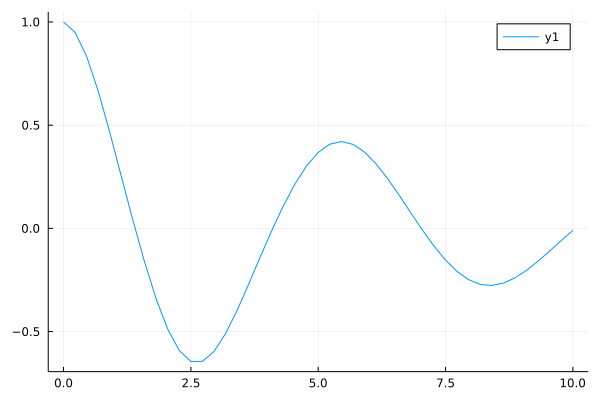

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


In [273]:
plot(t_45,Array(neuralode(u0,res_ms.u,st)[1])[1,:])

In [88]:
NNODE = Flux.Chain(x -> [x],
           Flux.Dense(1,32,tanh),
           Flux.Dense(32,1),
           first)

g(t) = t*NNODE(t) + initial_1[1]
ϵ = sqrt(eps(Float32))
loss() = mean(([(g(t+ϵ)-g(t))/ϵ for t in t_15] .- sol_Duffing_15[2,:]).^2) 

#+ 0.1* mean((NNODE.(t_1) .- sol_Duffing[1,:]).^2)

opt = Flux.Adam(0.1)
data = Iterators.repeated((), 1000)
iter = 0
cb = function () #callback function to observe training
  global iter += 1
  if iter % 500 == 0
    display(loss())
  end
end
display(loss())
Flux.train!(loss, Flux.params(NNODE), data, opt; cb=cb)



0.23028411386340525

0.000185079238480285

0.00039941247036260057

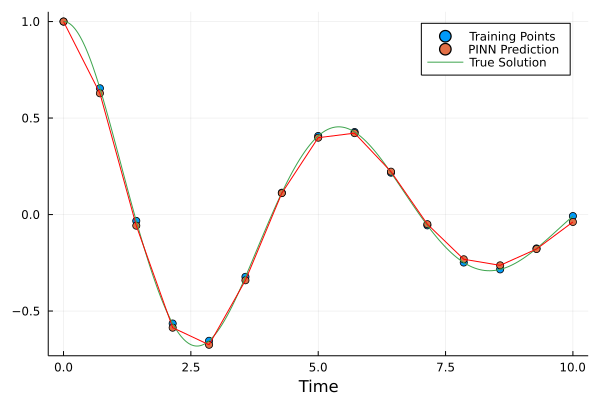

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


In [95]:
pinn_1 = plot()
scatter!(pinn_1,t_15,sol_Duffing_15[1,:],label = "Training Points")
scatter!(pinn_1,t_15,g.(t_15),label = "PINN Prediction")
plot!(pinn_1,t_true,Array(sol_Duffing_true)[1,:],label = "True Solution")
plot!(pinn_1,t_15,g.(t_15),label = "",color = "red")
xlabel!(pinn_1,"Time")

In [96]:
NNODE = Flux.Chain(x -> [x],
           Flux.Dense(1,32,tanh),
           Flux.Dense(32,1),
           first)

g(t) = t*NNODE(t) + initial_1[1]
ϵ = sqrt(eps(Float32))
loss() = mean(([(g(t+ϵ)-g(t))/ϵ for t in t_30] .- sol_Duffing_30[2,:]).^2) 

#+ 0.1* mean((NNODE.(t_1) .- sol_Duffing[1,:]).^2)

opt = Flux.Adam(0.1)
data = Iterators.repeated((), 1000)
iter = 0
cb = function () #callback function to observe training
  global iter += 1
  if iter % 500 == 0
    display(loss())
  end
end
display(loss())
Flux.train!(loss, Flux.params(NNODE), data, opt; cb=cb)

0.5404007162542558

0.0002345020726564751

0.00010929774796628278

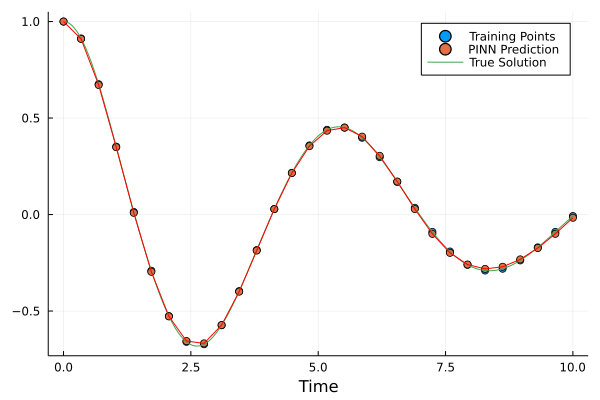

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


In [97]:
pinn_2 = plot()
scatter!(pinn_2,t_30,sol_Duffing_30[1,:],label = "Training Points")
scatter!(pinn_2,t_30,g.(t_30),label = "PINN Prediction")
plot!(pinn_2,t_true,Array(sol_Duffing_true)[1,:],label = "True Solution")
plot!(pinn_2,t_30,g.(t_30),label = "",color = "red")
xlabel!(pinn_2,"Time")

In [107]:
NNODE = Flux.Chain(x -> [x],
           Flux.Dense(1,32,tanh),
           Flux.Dense(32,1),
           first)

g(t) = t*NNODE(t) + initial_1[1]
ϵ = sqrt(eps(Float32))
loss() = mean(([(g(t+ϵ)-g(t))/ϵ for t in t_45] .- sol_Duffing_45[2,:]).^2) 

#+ 0.1* mean((NNODE.(t_1) .- sol_Duffing[1,:]).^2)

opt = Flux.Adam(0.1)
data = Iterators.repeated((), 400)
iter = 0
cb = function () #callback function to observe training
  global iter += 1
  if iter % 100 == 0
    display(loss())
  end
end
display(loss())
Flux.train!(loss, Flux.params(NNODE), data, opt; cb=cb)

0.2536602705311858

0.03911225365537852

0.027956691373408907

0.0017447899673212204

0.0005278490975206289

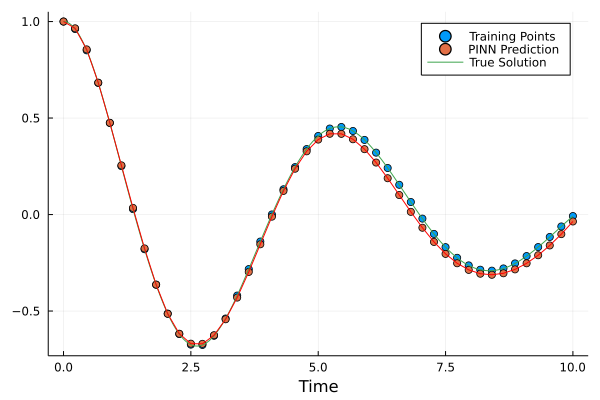

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


In [108]:
pinn_3 = plot()
scatter!(pinn_3,t_45,sol_Duffing_45[1,:],label = "Training Points")
scatter!(pinn_3,t_45,g.(t_45),label = "PINN Prediction")
plot!(pinn_3,t_true,Array(sol_Duffing_true)[1,:],label = "True Solution")
plot!(pinn_3,t_45,g.(t_45),label = "",color = "red")
xlabel!(pinn_3,"Time")

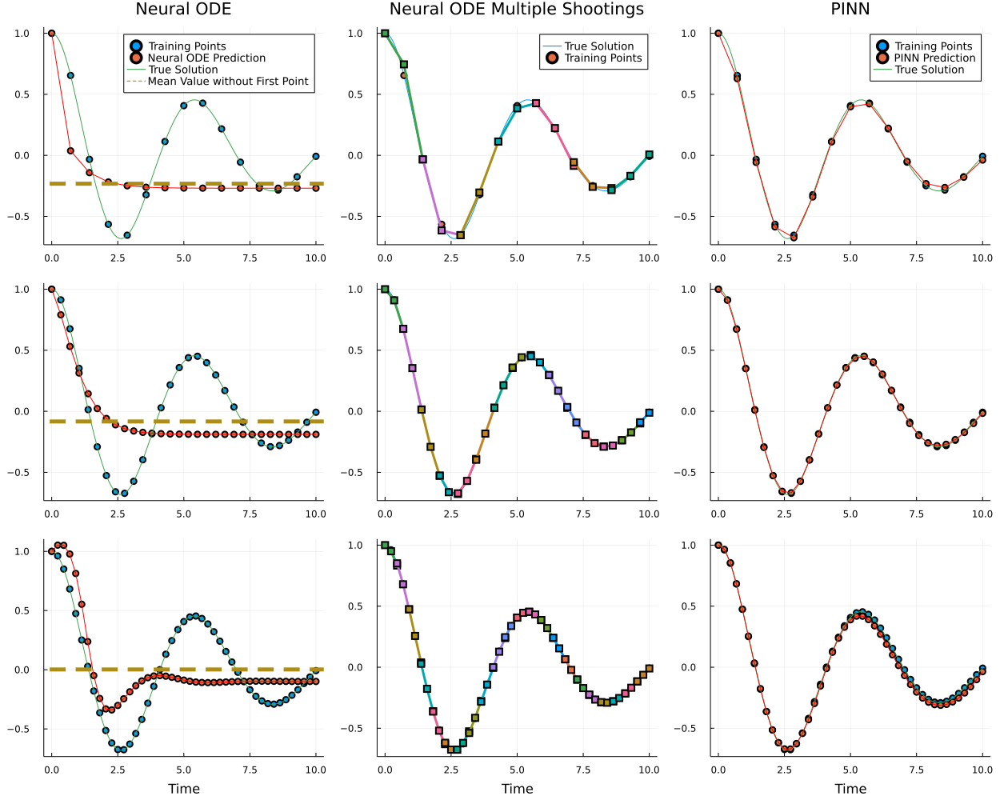

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


In [166]:
l = @layout [a b c;d e f;g h i]
p = plot(p_11,plt,pinn_1,p_22,plt2,pinn_2,p_33,plt3,pinn_3,layout = grid(3,3),size = (1250,1000),legendfontsize = 9)

In [167]:
savefig(p,"C:/Users/周天恒/Desktop/课程/英国布里斯托/Bristol课程/DSP/Julia")

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


In [136]:
?savefig

search: savefig StackOverflowError AbstractVectorOfArray



```
savefig([plot,] filename)
```

Save a Plot (the current plot if `plot` is not passed) to file. The file type is inferred from the file extension. All backends support png and pdf file types, some also support svg, ps, eps, html and tex.


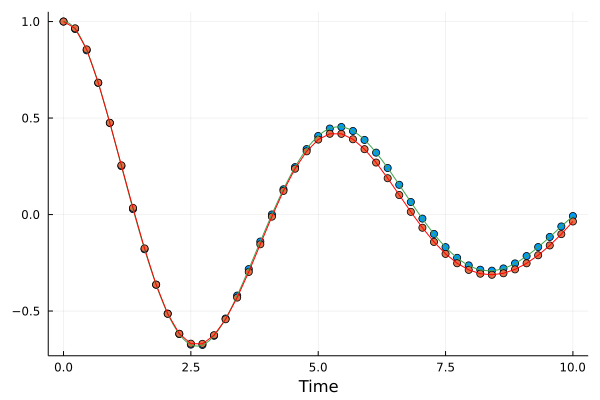

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


In [157]:
xlabel!(p_11,"")
xlabel!(p_22,"")
xlabel!(p_33,"Time")
xlabel!(plt,"")
xlabel!(plt2,"")
xlabel!(plt3,"Time")
xlabel!(pinn_1,"")
xlabel!(pinn_2,"")
xlabel!(pinn_3,"Time")

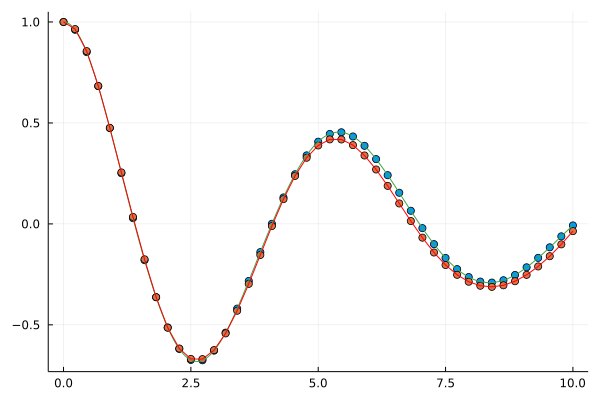

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


In [122]:
plot!(p_22,legend = false)
plot!(p_33,legend = false)
plot!(plt2,legend = false)
plot!(plt3,legend = false)
plot!(pinn_2,legend = false)
plot!(pinn_3,legend = false)

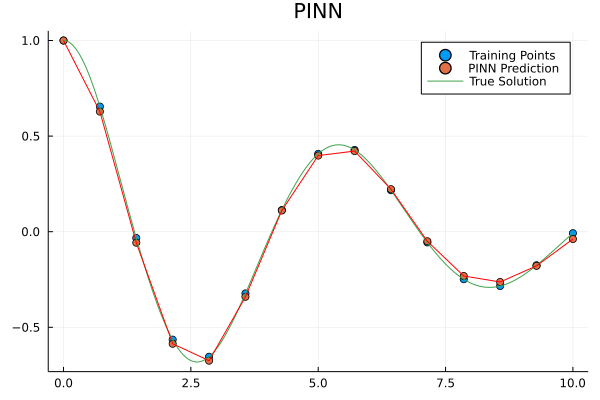

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


In [161]:
title!(p_11,"Neural ODE")
title!(plt,"Neural ODE Multiple Shootings")
title!(pinn_1,"PINN")

## Surrogate

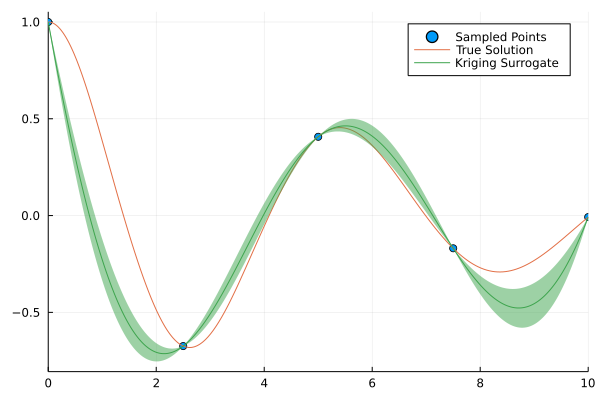

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


In [218]:
kriging_surrogate = Kriging(t_5, sol_Duffing_5[1,:], 0.0, 10.0);
s_1 = plot()
plot!(s_1,t_5, sol_Duffing_5[1,:], seriestype=:scatter, label="Sampled Points", xlims=(0, 10))
plot!(s_1,t_true, sol_Duffing_true[1,:], label="True Solution")
plot!(s_1,t_true, kriging_surrogate.(t_true), label="Kriging Surrogate", ribbon=p->std_error_at_point(kriging_surrogate, p))

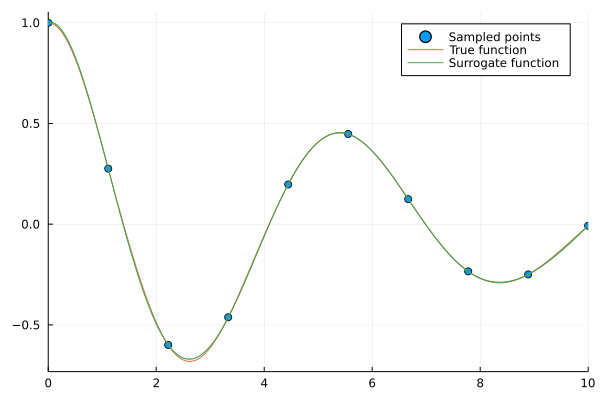

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


In [205]:
kriging_surrogate = Kriging(t_10, sol_Duffing_10[1,:], 0.0, 10.0);
s_2 = plot()
plot!(s_2,t_10, sol_Duffing_10[1,:], seriestype=:scatter, label="Sampled points", xlims=(0, 10))
plot!(s_2,t_true, sol_Duffing_true[1,:], label="True function")
plot!(s_2,t_true, kriging_surrogate.(t_true), label="Surrogate function", ribbon=p->std_error_at_point(kriging_surrogate, p))

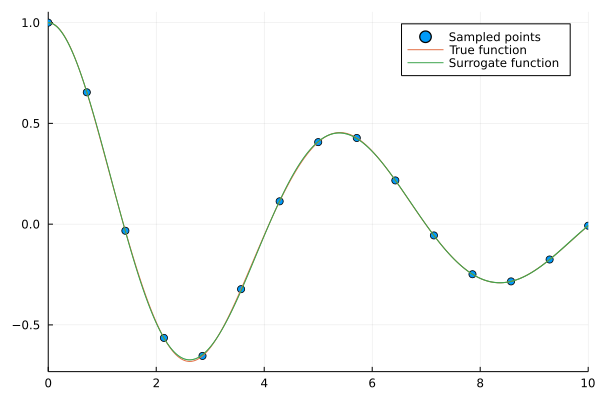

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


In [204]:
kriging_surrogate = Kriging(t_15, sol_Duffing_15[1,:], 0.0, 10.0);
s_3 = plot()
plot!(s_3,t_15, sol_Duffing_15[1,:], seriestype=:scatter, label="Sampled points", xlims=(0, 10))
plot!(s_3,t_true, sol_Duffing_true[1,:], label="True function")
plot!(s_3,t_true, kriging_surrogate.(t_true), label="Surrogate function", ribbon=p->std_error_at_point(kriging_surrogate, p))

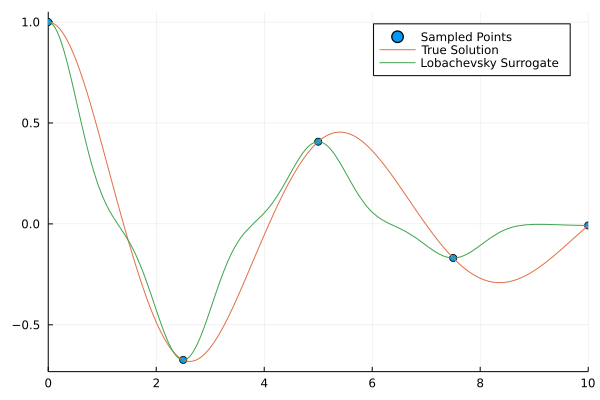

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


In [219]:
lobachevsky_surrogate = LobachevskySurrogate(t_5, sol_Duffing_5[1,:], 0,10, alpha = 2.0, n = 6)
s_4 = plot()
plot!(s_4,t_5, sol_Duffing_5[1,:], seriestype=:scatter, label="Sampled Points", xlims=(0, 10))
plot!(s_4,t_true, sol_Duffing_true[1,:], label="True Solution")
plot!(s_4,lobachevsky_surrogate, label="Lobachevsky Surrogate")

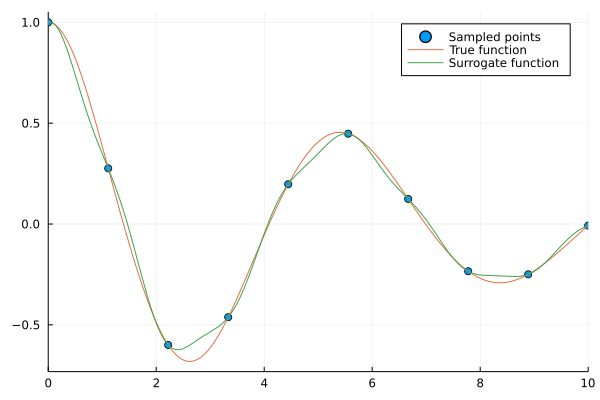

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


In [202]:
lobachevsky_surrogate = LobachevskySurrogate(t_10, sol_Duffing_10[1,:], 0,10, alpha = 2.0, n = 6)
s_5 = plot()
plot!(s_5,t_10, sol_Duffing_10[1,:], seriestype=:scatter, label="Sampled points", xlims=(0, 10))
plot!(s_5,t_true, sol_Duffing_true[1,:], label="True function")
plot!(s_5,lobachevsky_surrogate, label="Surrogate function")

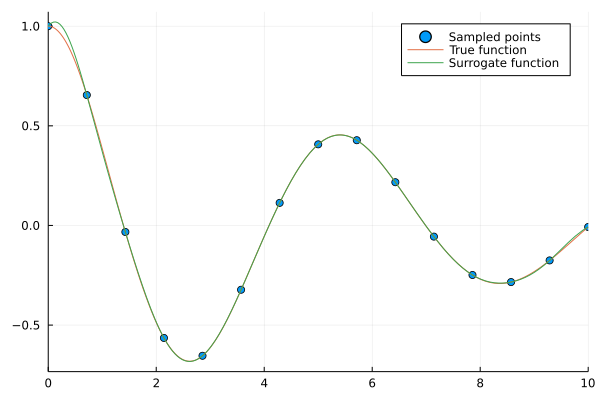

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


In [201]:
lobachevsky_surrogate = LobachevskySurrogate(t_15, sol_Duffing_15[1,:], 0,10, alpha = 2.0, n = 6)
s_6 = plot()
plot!(s_6,t_15, sol_Duffing_15[1,:], seriestype=:scatter, label="Sampled points", xlims=(0, 10))
plot!(s_6,t_true, sol_Duffing_true[1,:], label="True function")
plot!(s_6,lobachevsky_surrogate, label="Surrogate function")

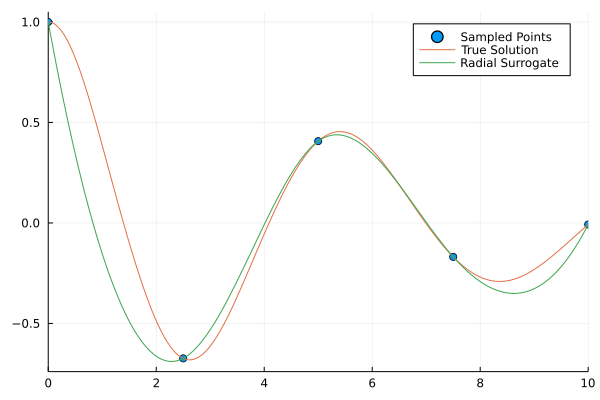

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


In [220]:
radial_surrogate = RadialBasis(t_5, sol_Duffing_5[1,:], 0,10, rad = cubicRadial())
s_7 = plot()
plot!(s_7,t_5, sol_Duffing_5[1,:], seriestype=:scatter, label="Sampled Points", xlims=(0, 10))
plot!(s_7,t_true, sol_Duffing_true[1,:], label="True Solution")
plot!(s_7,radial_surrogate, label="Radial Surrogate")

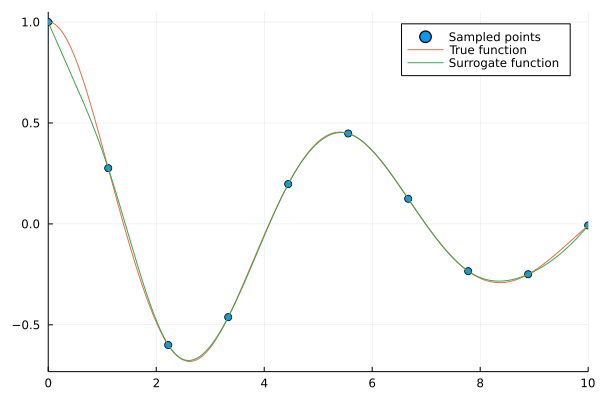

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


In [199]:
radial_surrogate = RadialBasis(t_10, sol_Duffing_10[1,:], 0,10, rad = cubicRadial())
s_8 = plot()
plot!(s_8,t_10, sol_Duffing_10[1,:], seriestype=:scatter, label="Sampled points", xlims=(0, 10))
plot!(s_8,t_true, sol_Duffing_true[1,:], label="True function")
plot!(s_8,radial_surrogate, label="Surrogate function")

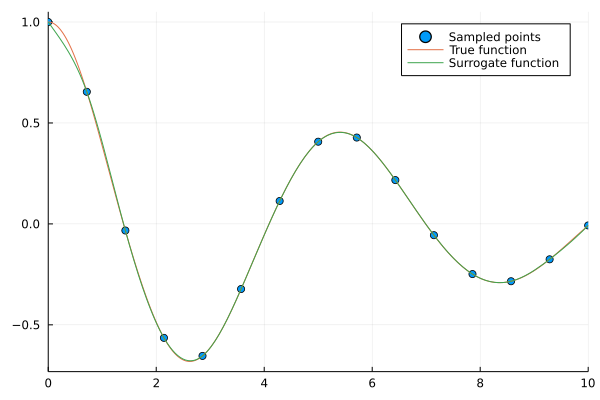

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


In [198]:
radial_surrogate = RadialBasis(t_15, sol_Duffing_15[1,:], 0,10, rad = cubicRadial())
s_9 = plot()
plot!(s_9,t_15, sol_Duffing_15[1,:], seriestype=:scatter, label="Sampled points", xlims=(0, 10))
plot!(s_9,t_true, sol_Duffing_true[1,:], label="True function")
plot!(s_9,radial_surrogate, label="Surrogate function")

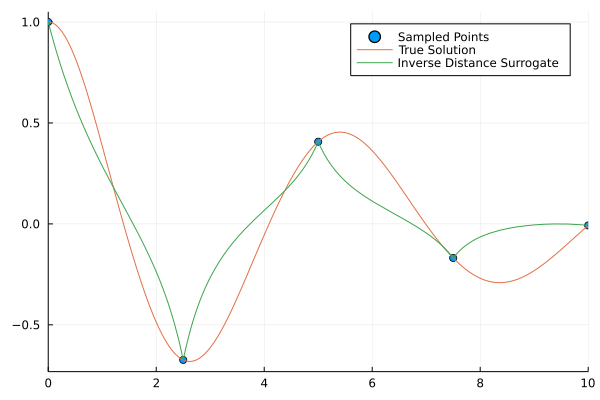

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


In [221]:
InverseDistance = InverseDistanceSurrogate(t_5, sol_Duffing_5[1,:], 0,10)

s_10 = plot()
plot!(s_10,t_5, sol_Duffing_5[1,:], seriestype=:scatter, label="Sampled Points", xlims=(0, 10))
plot!(s_10,t_true, sol_Duffing_true[1,:], label="True Solution")
plot!(s_10,InverseDistance, label="Inverse Distance Surrogate")

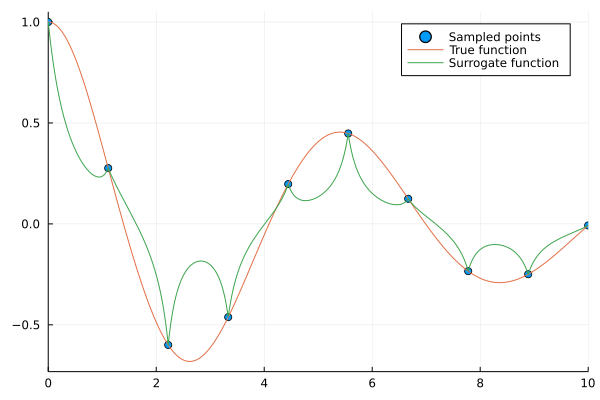

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


In [196]:
InverseDistance = InverseDistanceSurrogate(t_10, sol_Duffing_10[1,:], 0,10)

s_11 = plot()
plot!(s_11,t_10, sol_Duffing_10[1,:], seriestype=:scatter, label="Sampled points", xlims=(0, 10))
plot!(s_11,t_true, sol_Duffing_true[1,:], label="True function")
plot!(s_11,InverseDistance, label="Surrogate function")

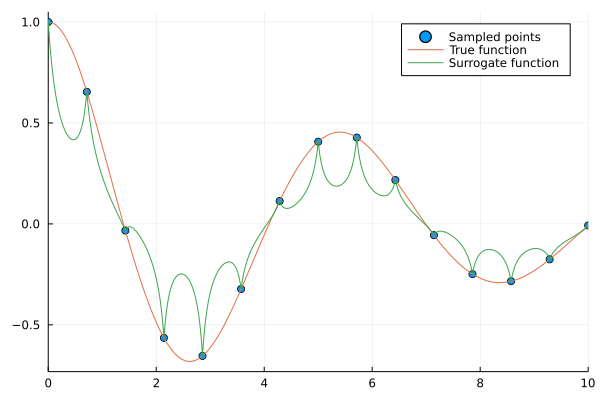

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


In [195]:
InverseDistance = InverseDistanceSurrogate(t_15, sol_Duffing_15[1,:], 0,10)

s_12 = plot()
plot!(s_12,t_15, sol_Duffing_15[1,:], seriestype=:scatter, label="Sampled points", xlims=(0, 10))
plot!(s_12,t_true, sol_Duffing_true[1,:], label="True function")
plot!(s_12,InverseDistance, label="Surrogate function")

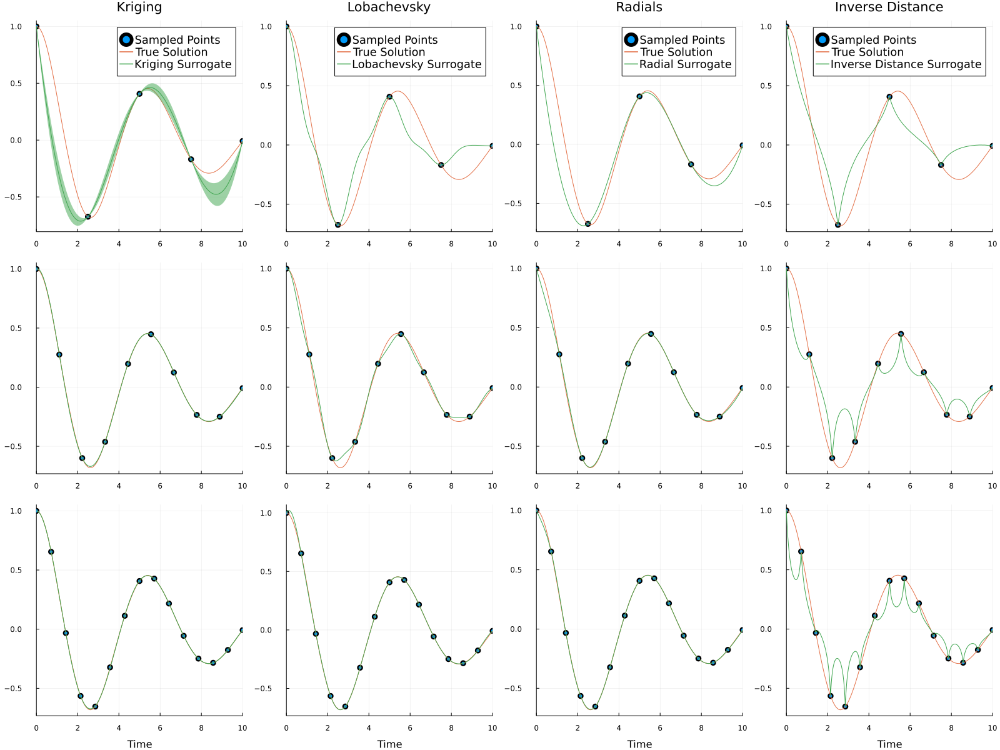

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


In [231]:
p_42 = plot(s_1,s_4,s_7,s_10,s_2,s_5,s_8,s_11,s_3,s_6,s_9,s_12,layout = (3,4),size = (1600,1200),legendfontsize = 12)

In [232]:
savefig(p_42,"C:/Users/周天恒/Desktop/课程/英国布里斯托/Bristol课程/DSP/4-2")

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


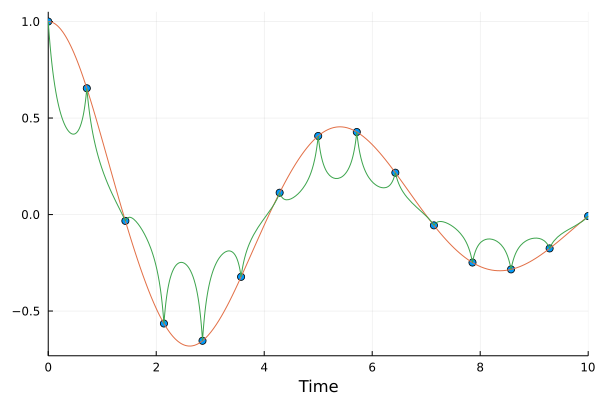

base64 binary data: b3BlbjogTm8gc3VjaCBmaWxlIG9yIGRpcmVjdG9yeQpvcGVuOiBObyBzdWNoIGZpbGUgb3IgZGlyZWN0b3J5CkdLUzogZmlsZSBvcGVuIGVycm9yIChDOlxVc2Vyc1zW3MzsuuNcLmp1bGlhXGFydGlmYWN0c1xjOTM1MTE2YzljN2I5MWI0ZjI3YmEyYjNjOWY3YzZiNjM5YjMwMmFjXGJpblwuLlxGT05UU1xHS1NGT05ULkRBVCkKR0tTOiBmaWxlIG9wZW4gZXJyb3IgKEM6XFVzZXJzXNbczOy641wuanVsaWFcYXJ0aWZhY3RzXGM5MzUxMTZjOWM3YjkxYjRmMjdiYTJiM2M5ZjdjNmI2MzliMzAyYWNcYmluXC4uXEZPTlRTXEdLU0ZPTlQuREFUKQo=


In [223]:
title!(s_1,"Kriging")
title!(s_4,"Lobachevsky")
title!(s_7,"Radials")
title!(s_10,"Inverse Distance")

xaxis!(s_3,"Time")
xaxis!(s_6,"Time")
xaxis!(s_9,"Time")
xaxis!(s_12,"Time")

plot!(s_2,legend = false)
plot!(s_3,legend = false)
plot!(s_5,legend = false)
plot!(s_6,legend = false)
plot!(s_8,legend = false)
plot!(s_9,legend = false)
plot!(s_11,legend = false)
plot!(s_12,legend = false)